In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Dataset DateTime Setting**

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import matplotlib
import seaborn as sns
from sklearn import metrics
import tensorflow as tf
from tensorflow import keras

from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense, Dropout
from sklearn.preprocessing import StandardScaler
from keras.callbacks import ModelCheckpoint


In [ ]:
matplotlib.rc('xtick', labelsize=25) 
matplotlib.rc('ytick', labelsize=25)
plt.rc('axes', labelsize=30)
plt.rc('axes', titlesize=30)
plt.rc('legend', fontsize=25)

In [ ]:
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 20)

In [ ]:
sns.set(rc = {'figure.figsize':(15,8)})

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/FYP complete files/Atlanta_33.77_-84.38_1998.csv')
df.head()

,Year,Month,Day,Hour,Minute,GHI,Clearsky GHI,Cloud Type,Dew Point,Solar Zenith Angle,Wind Speed,Precipitable Water,Wind Direction,Relative Humidity,Temperature
0,1998,1,1,0,0,0,0,0,-6.0,165.99,0.6,0.302,336.7,87.85,-5.0
1,1998,1,1,0,30,0,0,0,-6.0,168.98,0.6,0.306,336.7,87.86,-5.0
2,1998,1,1,1,0,0,0,0,-7.0,168.46,0.6,0.310,342.1,91.40,-6.0
3,1998,1,1,1,30,0,0,0,-7.0,164.79,0.6,0.317,342.1,91.40,-6.0
4,1998,1,1,2,0,0,0,0,-7.0,159.61,0.6,0.324,347.2,88.52,-6.0


In [ ]:
df.dtypes

Year                    int64
Month                   int64
Day                     int64
Hour                    int64
Minute                  int64
GHI                     int64
Clearsky GHI            int64
Cloud Type              int64
Dew Point             float64
Solar Zenith Angle    float64
Wind Speed            float64
Precipitable Water    float64
Wind Direction        float64
Relative Humidity     float64
Temperature           float64
dtype: object

In [ ]:
df['Date']=df['Year'].astype(str) + df['Month'].astype(str).str.zfill(2) + df['Day'].astype(str).str.zfill(2) + df['Hour'].astype(str).str.zfill(2)+ df['Minute'].astype(str).str.zfill(2)
df.Date

0         199801010000
1         199801010030
2         199801010100
3         199801010130
4         199801010200
              ...     
402955    202012312130
402956    202012312200
402957    202012312230
402958    202012312300
402959    202012312330
Name: Date, Length: 402960, dtype: object

In [ ]:
df['Date'] = pd.to_datetime(df['Date'], format='%Y%m%d%H%M')
df.head()

,Year,Month,Day,Hour,Minute,GHI,Clearsky GHI,Cloud Type,Dew Point,Solar Zenith Angle,Wind Speed,Precipitable Water,Wind Direction,Relative Humidity,Temperature,Date
0,1998,1,1,0,0,0,0,0,-6.0,165.99,0.6,0.302,336.7,87.85,-5.0,1998-01-01 00:00:00
1,1998,1,1,0,30,0,0,0,-6.0,168.98,0.6,0.306,336.7,87.86,-5.0,1998-01-01 00:30:00
2,1998,1,1,1,0,0,0,0,-7.0,168.46,0.6,0.310,342.1,91.40,-6.0,1998-01-01 01:00:00
3,1998,1,1,1,30,0,0,0,-7.0,164.79,0.6,0.317,342.1,91.40,-6.0,1998-01-01 01:30:00
4,1998,1,1,2,0,0,0,0,-7.0,159.61,0.6,0.324,347.2,88.52,-6.0,1998-01-01 02:00:00


In [ ]:
df = df.drop(labels = ['Year', 'Month',	'Day',	'Hour',	'Minute'], axis=1)

In [ ]:
df.set_index('Date', inplace = True)
df.head()

,GHI,Clearsky GHI,Cloud Type,Dew Point,Solar Zenith Angle,Wind Speed,Precipitable Water,Wind Direction,Relative Humidity,Temperature
Date,,,,,,,,,,
1998-01-01 00:00:00,0,0,0,-6.0,165.99,0.6,0.302,336.7,87.85,-5.0
1998-01-01 00:30:00,0,0,0,-6.0,168.98,0.6,0.306,336.7,87.86,-5.0
1998-01-01 01:00:00,0,0,0,-7.0,168.46,0.6,0.310,342.1,91.40,-6.0
1998-01-01 01:30:00,0,0,0,-7.0,164.79,0.6,0.317,342.1,91.40,-6.0
1998-01-01 02:00:00,0,0,0,-7.0,159.61,0.6,0.324,347.2,88.52,-6.0


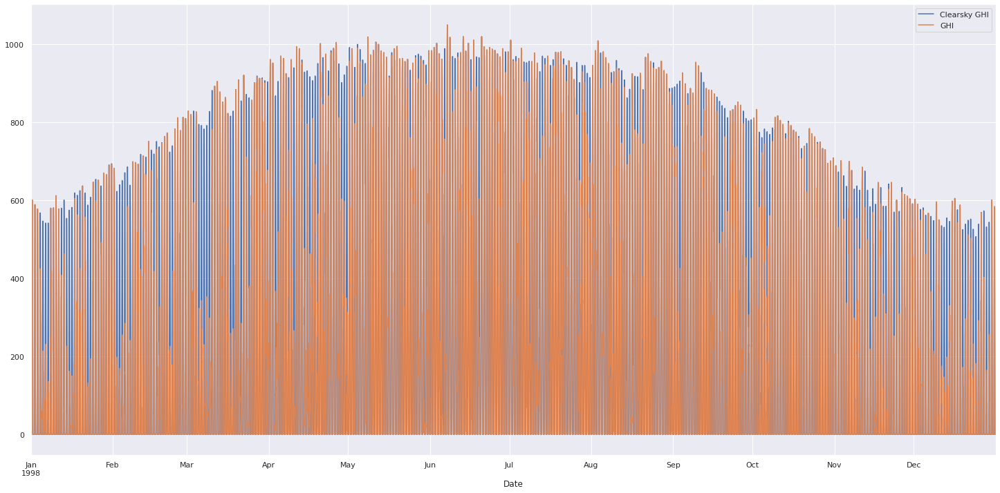

In [ ]:
df['Clearsky GHI'][:17520].plot(figsize=(25,12), label='Clearsky GHI')
df['GHI'][:17520].plot(figsize=(25,12), label='GHI')
plt.legend()
#plt.savefig('/content/drive/MyDrive/FYP complete files/Images Hawaii/Hawaii Data plot 1998.png', dpi = 120)

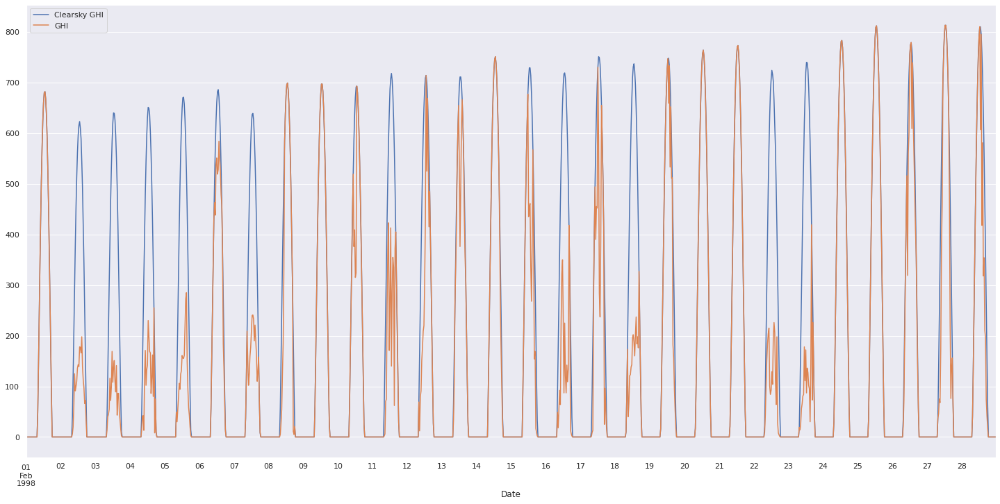

In [ ]:
df['Clearsky GHI'][1488:2832].plot(figsize=(25,12), label='Clearsky GHI')
df['GHI'][1488:2832].plot(figsize=(25,12), label='GHI')
plt.legend()

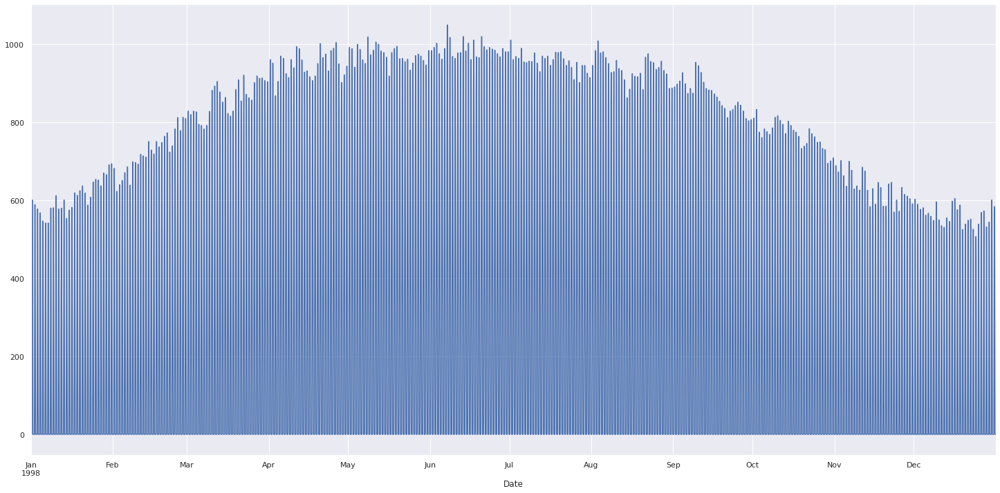

In [ ]:
df['Clearsky GHI'][:17520].plot(figsize=(25,12), label='Clearsky GHI')

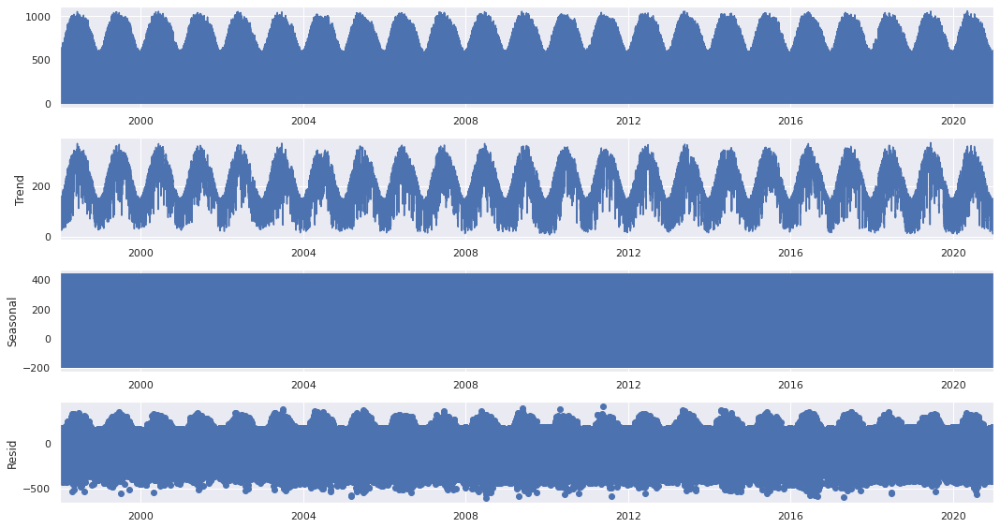

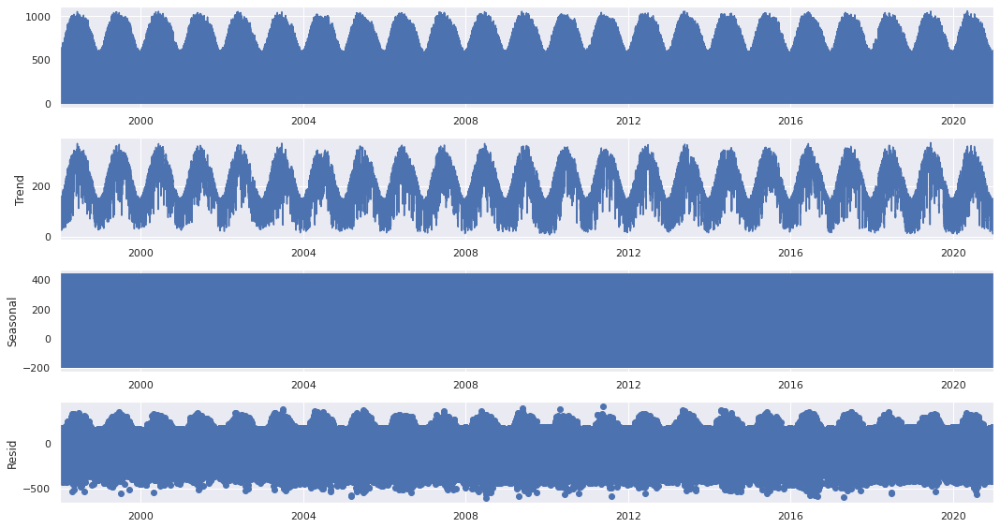

In [ ]:
from pandas.core.internals.construction import treat_as_nested
from statsmodels.tsa.seasonal import seasonal_decompose
analysis = df[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

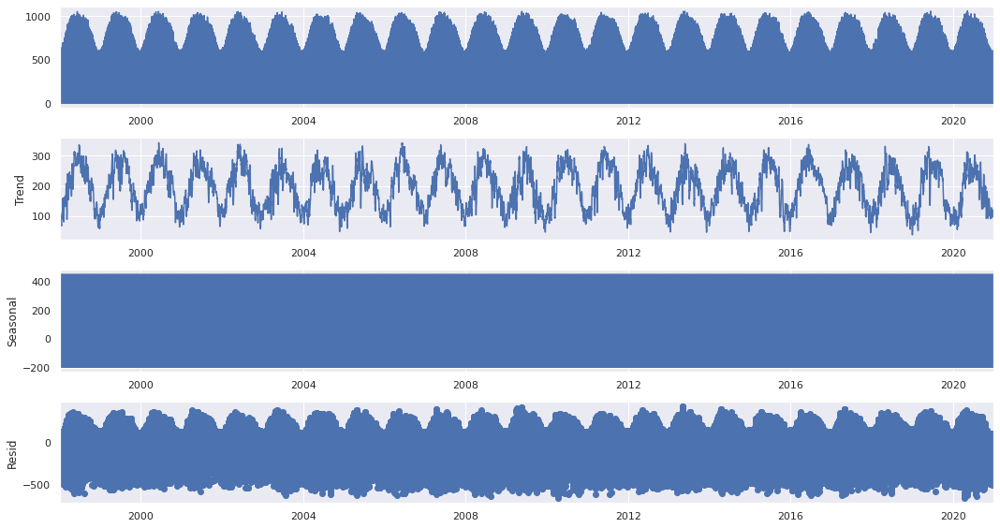

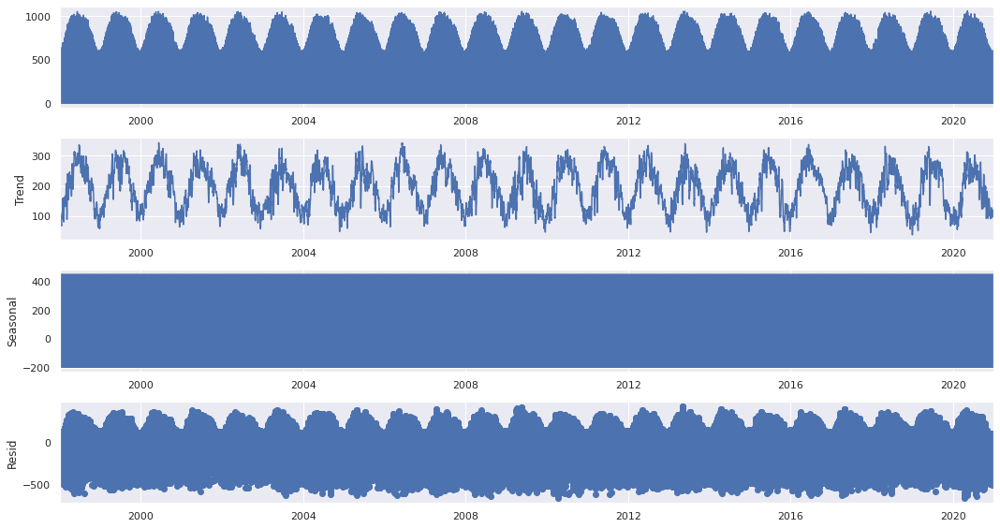

In [ ]:
analysis = df[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48*7)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

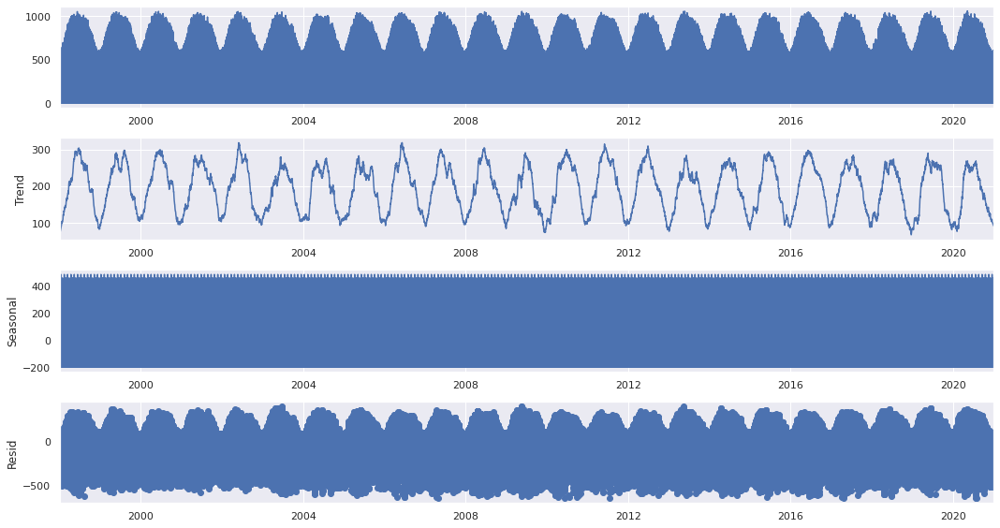

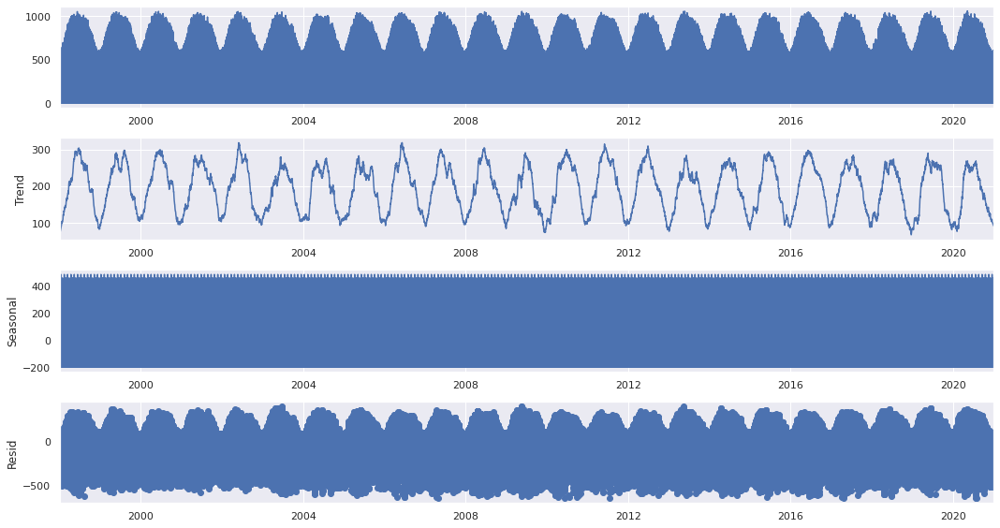

In [ ]:
analysis = df[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48*30)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

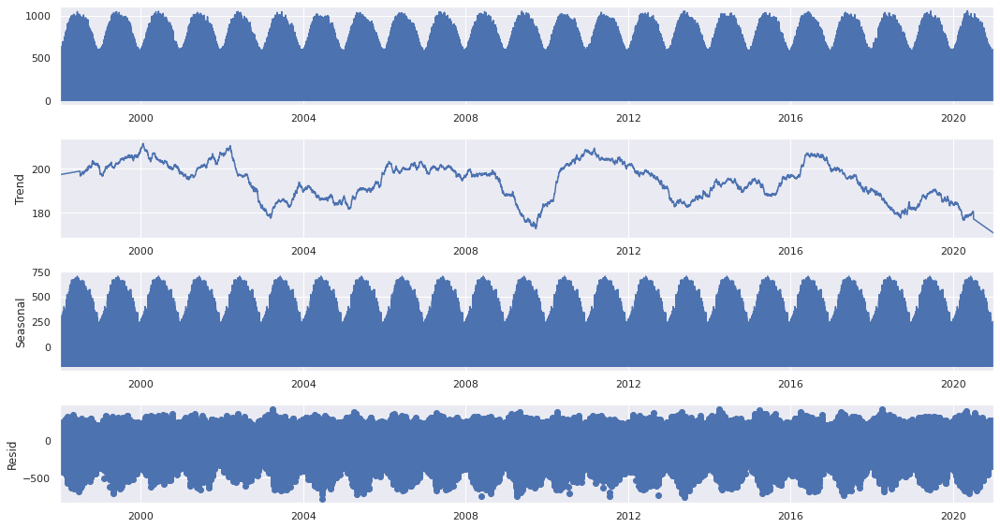

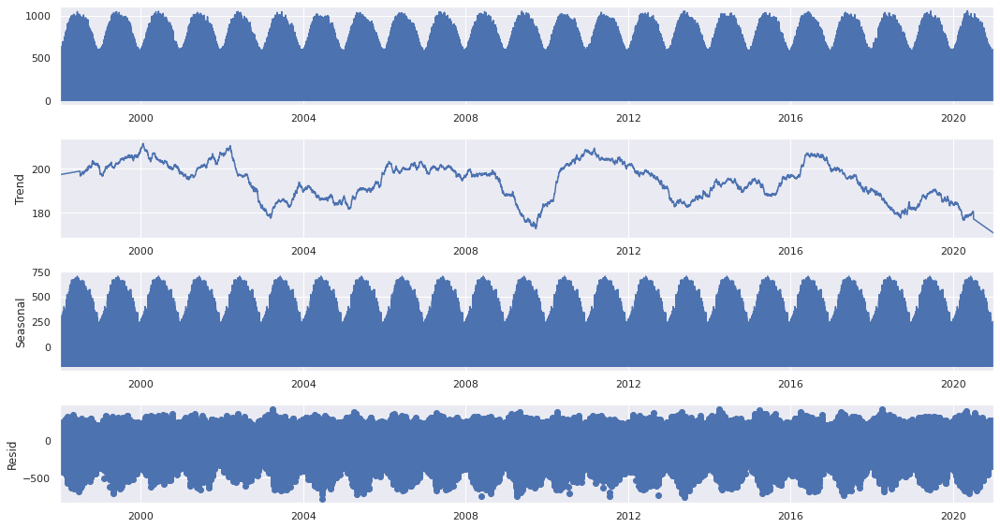

In [ ]:
analysis = df[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48*365)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

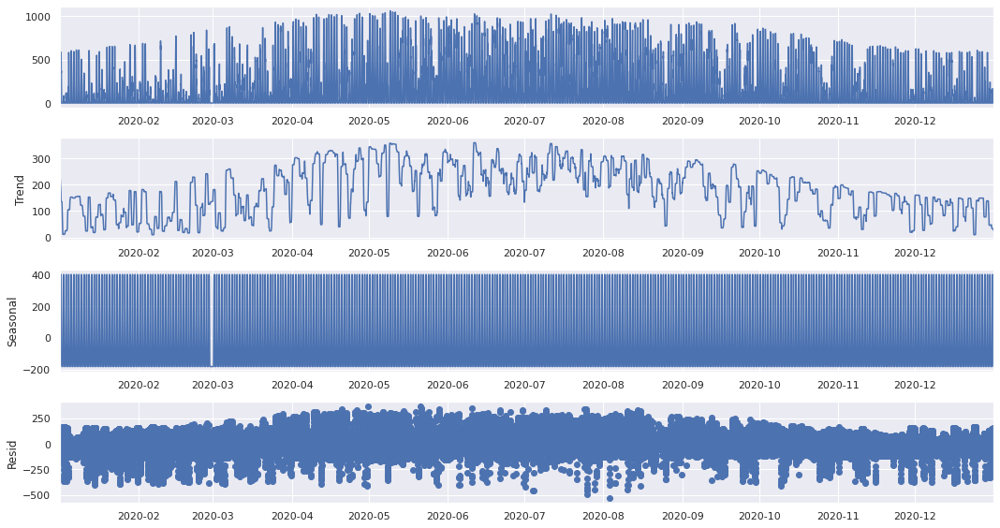

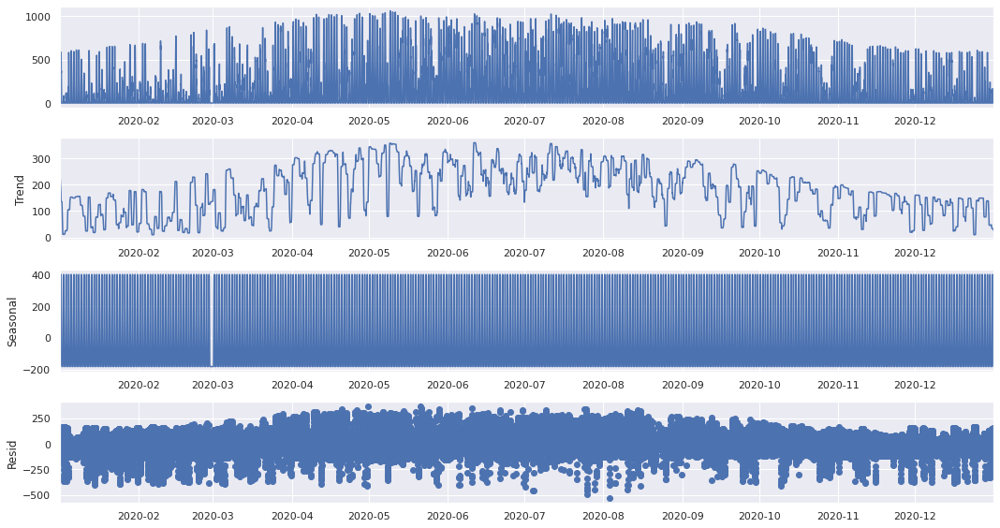

In [ ]:
maskd = (df.index > '2020-01-01') & (df.index <= '2021-01-01')
seasonality = df.loc[maskd]
seasonality = seasonality.dropna()
analysis = seasonality[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

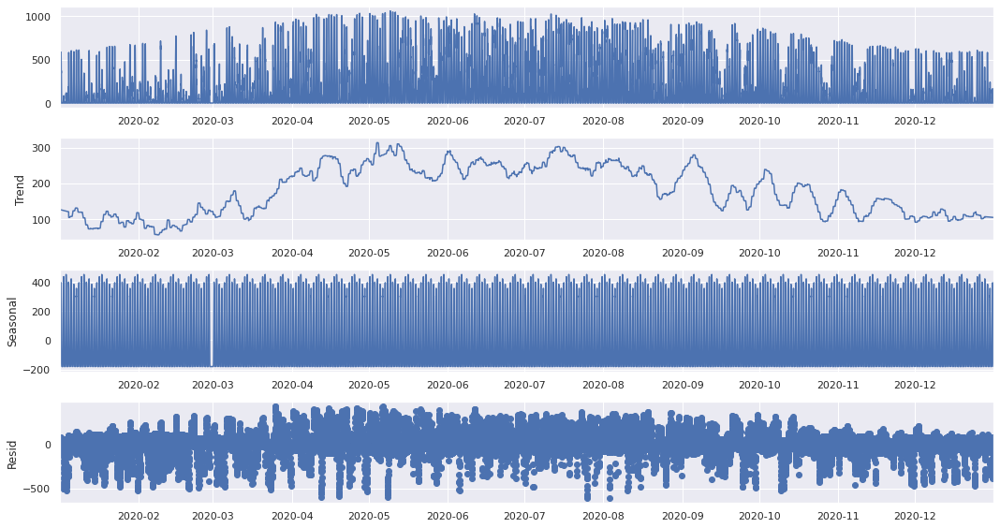

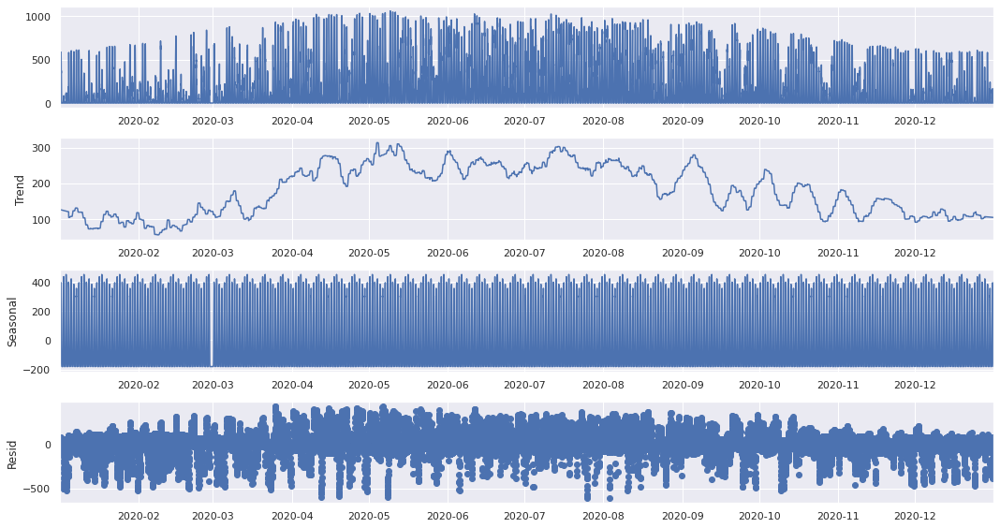

In [ ]:
analysis = seasonality[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48*7)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

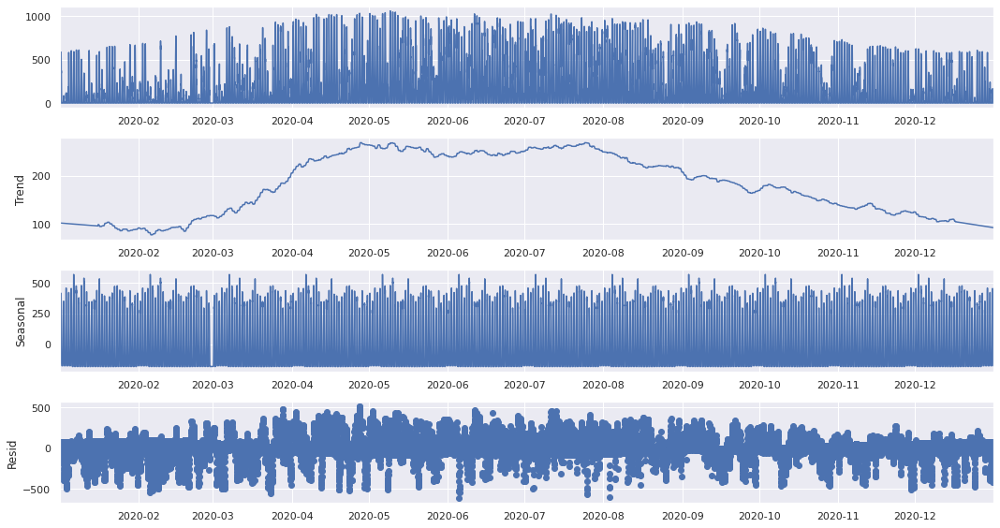

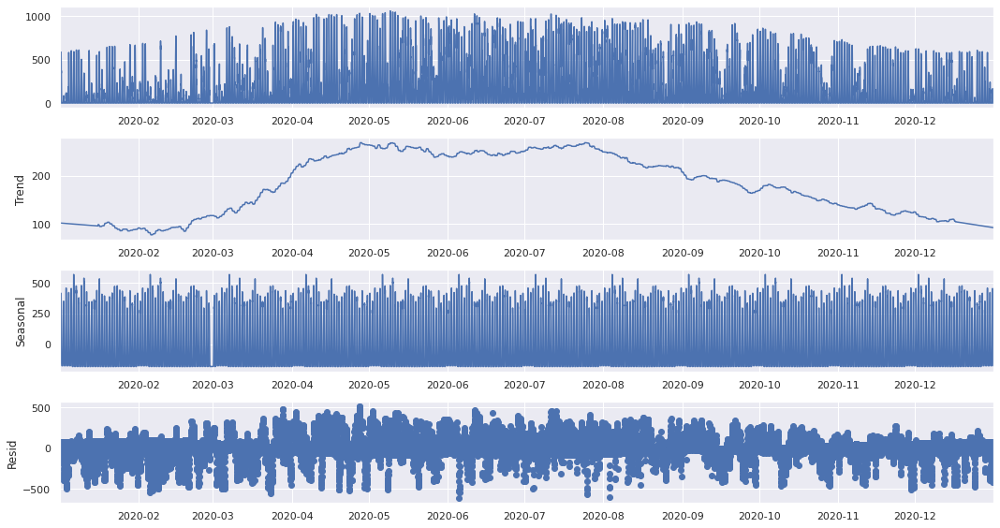

In [ ]:
analysis = seasonality[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48*30)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

# **Box Plot and Histogram**

In [ ]:
Dailybox = df
Dailybox = Dailybox.reset_index()
Dailybox=Dailybox.resample('H',on='Date').mean()
Dailybox = Dailybox.reset_index()
Dailybox = Dailybox.resample('D', on='Date').sum()
Dailybox['Month'] = Dailybox.index.month_name()
Dailybox.head()

,GHI,Clearsky GHI,Cloud Type,Dew Point,Solar Zenith Angle,Wind Speed,Precipitable Water,Wind Direction,Relative Humidity,Temperature,Month
Date,,,,,,,,,,,
1998-01-01,3636.0,3636.0,0.0,-139.0,2550.335,18.55,11.6085,3725.7,1732.960,-32.5,January
1998-01-02,3565.0,3565.0,5.5,-8.5,2548.940,20.40,18.7105,3791.5,2039.430,49.5,January
1998-01-03,3476.0,3476.0,33.0,143.0,2547.415,20.20,33.4570,3082.7,2266.850,174.0,January
1998-01-04,2161.0,3404.5,103.5,212.5,2545.790,23.25,44.9995,2406.3,2308.735,234.5,January
1998-01-05,898.5,3281.0,146.0,290.0,2544.040,24.30,75.3130,2650.2,2397.025,300.5,January


<function matplotlib.pyplot.show(*args, **kw)>

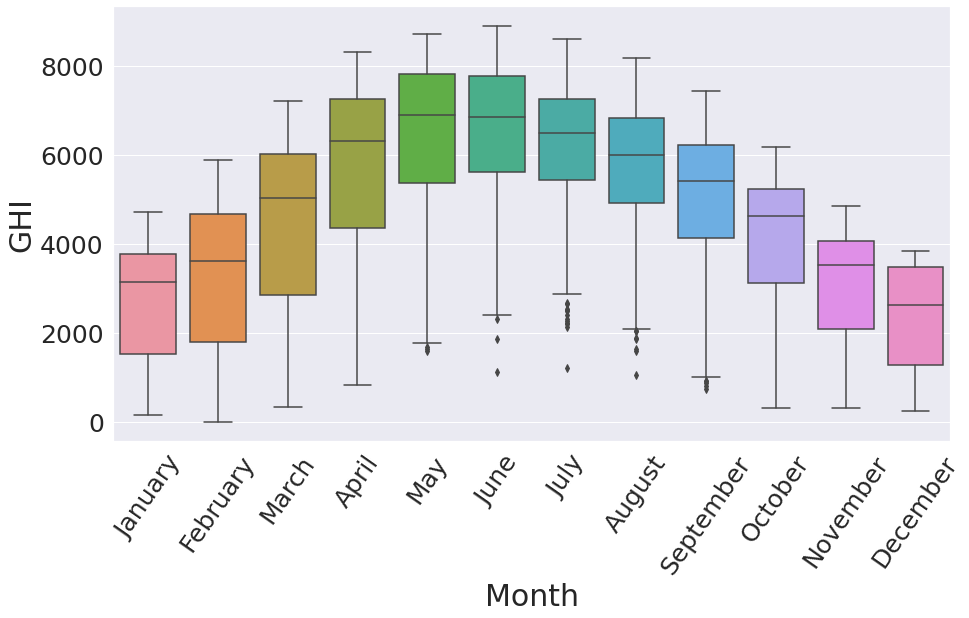

In [ ]:
q=sns.boxplot(x="Month",y="GHI",data=Dailybox)
q.set_xlabel("Month",fontsize=30)
q.set_ylabel("GHI",fontsize=30)
q.tick_params(labelsize=25, axis='x', rotation=55)
q.tick_params(labelsize=25, axis='y')
plt.show

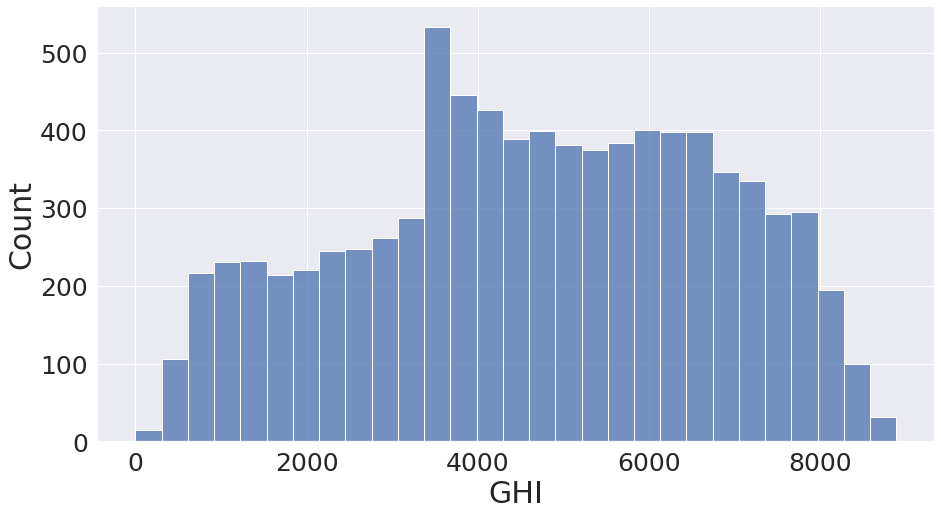

In [ ]:
q=sns.histplot(x='GHI', data=Dailybox, )
q.set_xlabel("GHI",fontsize=30)
q.set_ylabel("Count",fontsize=30)
q.tick_params(labelsize=25)
plt.show()

# **Feature Selection and Correlation Matrix**

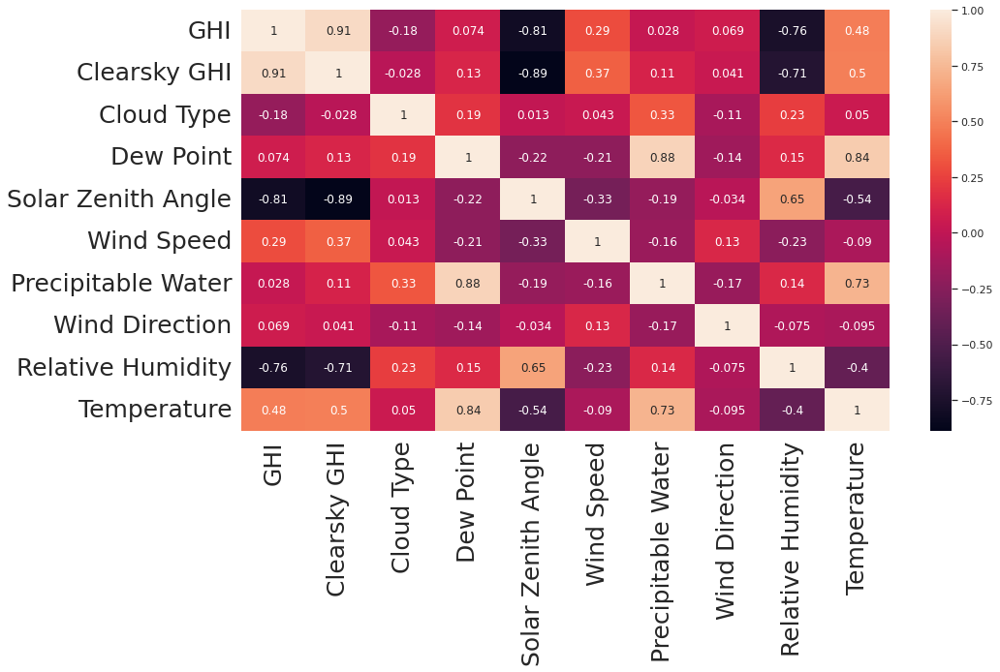

In [ ]:
corrMatrix = df.corr()
a = sns.heatmap(corrMatrix, annot=True)
a.tick_params(labelsize=25, axis='x')
a.tick_params(labelsize=25, axis='y')
plt.show()

In [ ]:
df = df.drop(labels = ['Dew Point',	'Wind Speed',	'Precipitable Water',	'Wind Direction'], axis=1)
df.head()

,GHI,Clearsky GHI,Cloud Type,Solar Zenith Angle,Relative Humidity,Temperature
Date,,,,,,
1998-01-01 00:00:00,0,0,0,165.99,87.85,-5.0
1998-01-01 00:30:00,0,0,0,168.98,87.86,-5.0
1998-01-01 01:00:00,0,0,0,168.46,91.40,-6.0
1998-01-01 01:30:00,0,0,0,164.79,91.40,-6.0
1998-01-01 02:00:00,0,0,0,159.61,88.52,-6.0


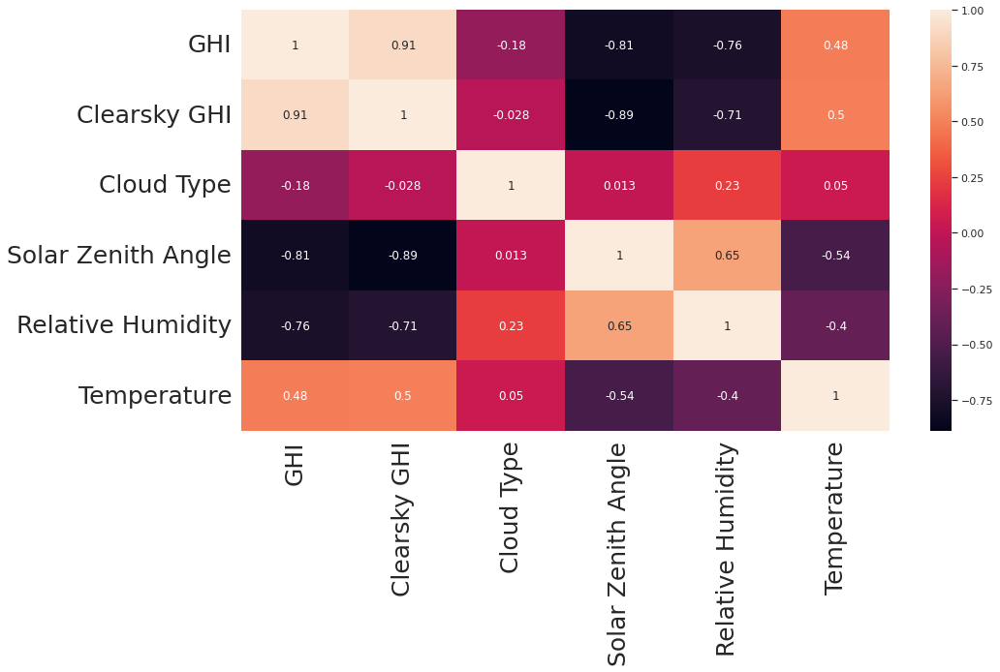

In [ ]:
corrMatrixUpdate = df.corr()
b = sns.heatmap(corrMatrixUpdate, annot=True)
b.tick_params(labelsize=25, axis='x', rotation=90 )
b.tick_params(labelsize=25, axis='y')
plt.show()

# **ONE HOT ENCODING**

In [ ]:
ohe = pd.get_dummies(df['Cloud Type'], drop_first=True)
ohe.columns = ['Probably Clear', 'Fog', 'Water', 'Super-Cooled Water', 'Mixed', 'Opaque Ice', 'Cirrus', 'Overlapping', 'Overshooting'] 
# (Clear Sky) is the first column which is dropped.  
ohe.head()

,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting
Date,,,,,,,,,
1998-01-01 00:00:00,0,0,0,0,0,0,0,0,0
1998-01-01 00:30:00,0,0,0,0,0,0,0,0,0
1998-01-01 01:00:00,0,0,0,0,0,0,0,0,0
1998-01-01 01:30:00,0,0,0,0,0,0,0,0,0
1998-01-01 02:00:00,0,0,0,0,0,0,0,0,0


In [ ]:
dfohe = pd.concat([df,ohe], axis = 'columns')
dfohe = dfohe.drop(['Cloud Type'], axis = 'columns')
dfohe.head(10)

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting
Date,,,,,,,,,,,,,,
1998-01-01 00:00:00,0,0,165.99,87.85,-5.0,0,0,0,0,0,0,0,0,0
1998-01-01 00:30:00,0,0,168.98,87.86,-5.0,0,0,0,0,0,0,0,0,0
1998-01-01 01:00:00,0,0,168.46,91.40,-6.0,0,0,0,0,0,0,0,0,0
1998-01-01 01:30:00,0,0,164.79,91.40,-6.0,0,0,0,0,0,0,0,0,0
1998-01-01 02:00:00,0,0,159.61,88.52,-6.0,0,0,0,0,0,0,0,0,0
1998-01-01 02:30:00,0,0,153.82,88.50,-5.0,0,0,0,0,0,0,0,0,0
1998-01-01 03:00:00,0,0,147.76,86.68,-5.0,0,0,0,0,0,0,0,0,0
1998-01-01 03:30:00,0,0,141.59,80.33,-5.0,0,0,0,0,0,0,0,0,0
1998-01-01 04:00:00,0,0,135.36,79.16,-5.0,0,0,0,0,0,0,0,0,0


# **Clearness Index**

In [ ]:
df1 = dfohe
df1['clearness-index'] = df1['GHI'].astype(float) / df1['Clearsky GHI'].astype(float)
#df2=df1.between_time('08:00','16:30')
print(df1['clearness-index'].isna().sum())

202552


In [ ]:
dftemp = df1
df1 = df1.dropna()
df1

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
Date,,,,,,,,,,,,,,,
1998-01-01 08:00:00,30,30,87.63,72.32,-4.0,0,0,0,0,0,0,0,0,0,1.000000
1998-01-01 08:30:00,113,113,82.35,62.36,-2.0,0,0,0,0,0,0,0,0,0,1.000000
1998-01-01 09:00:00,206,206,77.35,53.12,-1.0,0,0,0,0,0,0,0,0,0,1.000000
1998-01-01 09:30:00,297,297,72.70,49.40,0.0,0,0,0,0,0,0,0,0,0,1.000000
1998-01-01 10:00:00,380,380,68.48,46.97,1.0,0,0,0,0,0,0,0,0,0,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 15:30:00,44,321,69.56,96.51,15.8,0,0,0,0,0,1,0,0,0,0.137072
2020-12-31 16:00:00,38,242,73.89,97.82,15.5,0,0,0,1,0,0,0,0,0,0.157025
2020-12-31 16:30:00,27,158,78.61,100.00,14.5,0,0,0,1,0,0,0,0,0,0.170886


# **Seasonality Analysis**

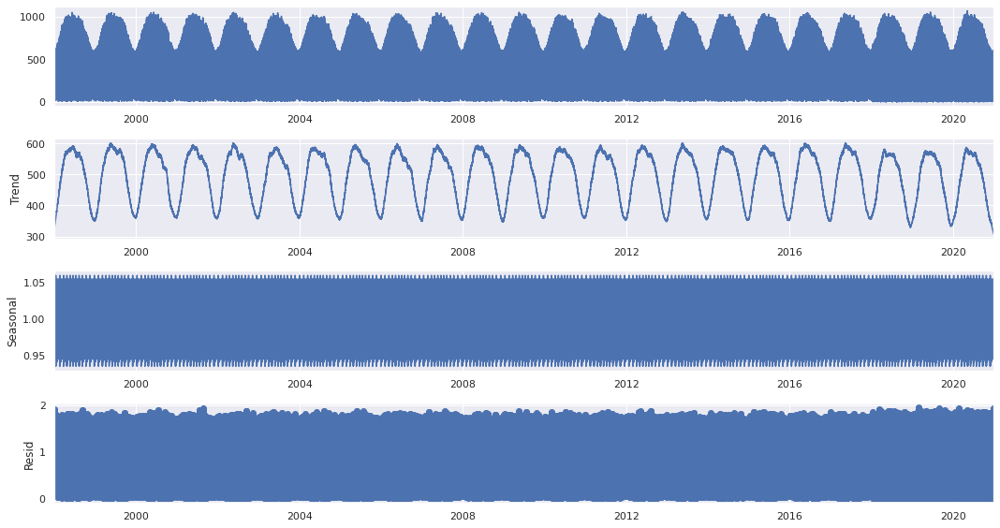

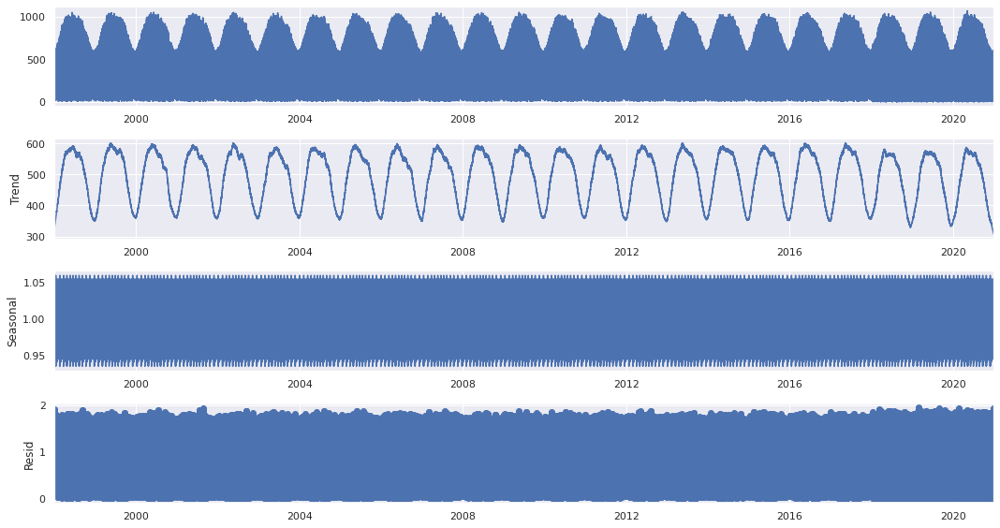

In [ ]:
from pandas.core.internals.construction import treat_as_nested
from statsmodels.tsa.seasonal import seasonal_decompose
analysis = df1[['Clearsky GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='multiplicative', extrapolate_trend='freq', period=25*30)

#trend = decompose_result_mult.trend
#seasonal = decompose_result_mult.seasonal
#residual = decompose_result_mult.resid

decompose_result_mult.plot()

<function matplotlib.pyplot.show(*args, **kw)>

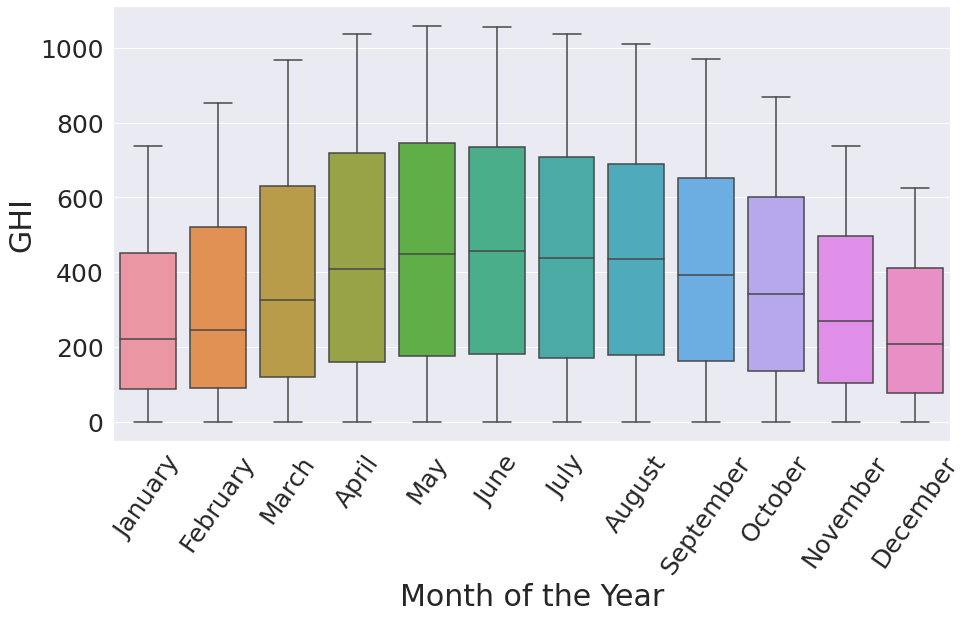

In [ ]:
df1box = dftemp
df1box['Month'] = df1box.index.month_name()
df1box = df1box.dropna()
r=sns.boxplot(x="Month",y="GHI",data=df1box)
r.set_xlabel("Month of the Year",fontsize=30)
r.set_ylabel("GHI",fontsize=30)
r.tick_params(labelsize=25, axis='x', rotation=55)
r.tick_params(labelsize=25, axis='y')
plt.show

<function matplotlib.pyplot.show(*args, **kw)>

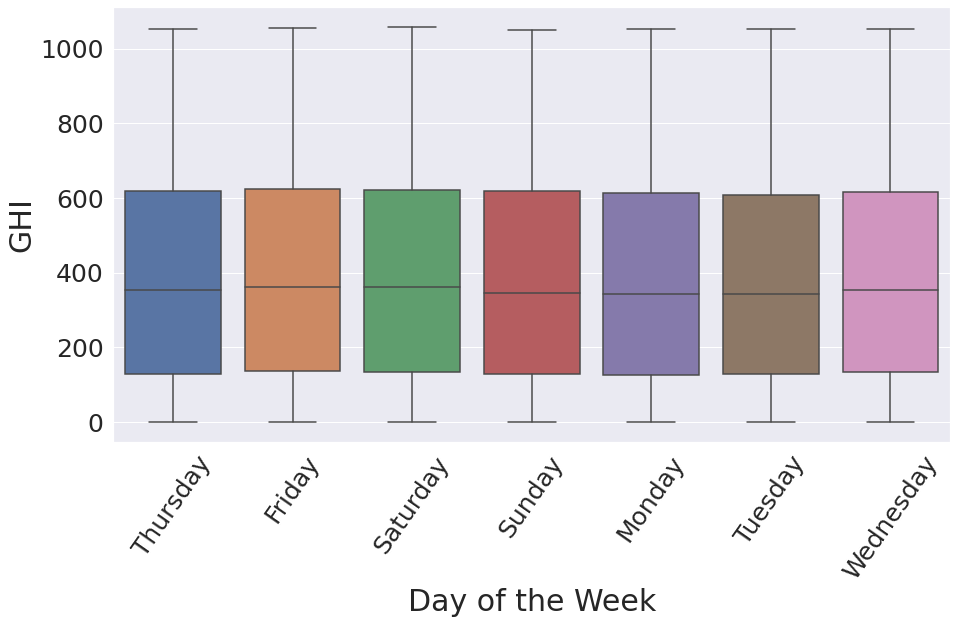

In [ ]:
df3box = dftemp
df3box['Month'] = df3box.index.day_name()
df3box = df3box.dropna()
t=sns.boxplot(x="Month",y="GHI",data=df3box)
t.set_xlabel("Day of the Week",fontsize=30)
t.set_ylabel("GHI",fontsize=30)
t.tick_params(labelsize=25, axis='x', rotation=55)
t.tick_params(labelsize=25, axis='y')
plt.show

<function matplotlib.pyplot.show(*args, **kw)>

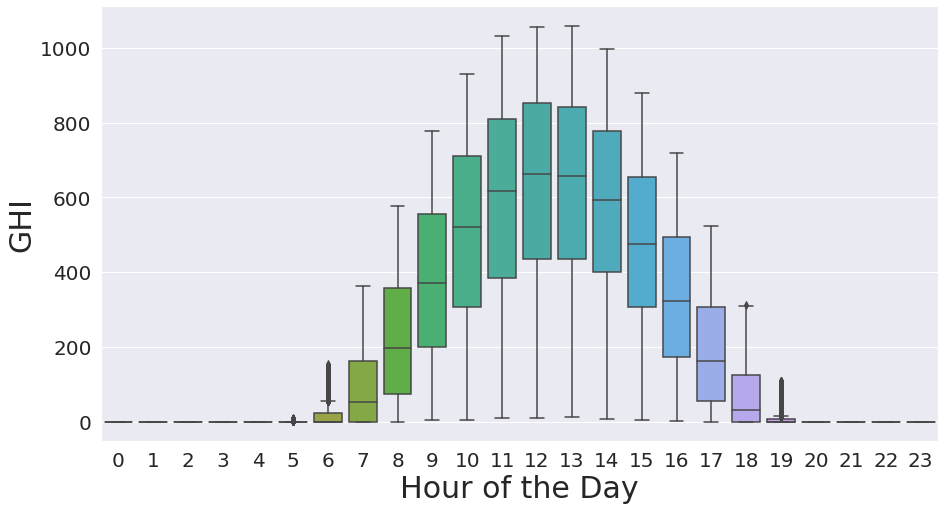

In [ ]:
df4box = df
df4box['Hour'] = df4box.index.hour
df4box = df4box.dropna()
u=sns.boxplot(x="Hour",y="GHI",data=df4box)
u.set_xlabel("Hour of the Day",fontsize=30)
u.set_ylabel("GHI",fontsize=30)
u.tick_params(labelsize=20)
plt.show

<function matplotlib.pyplot.show(*args, **kw)>

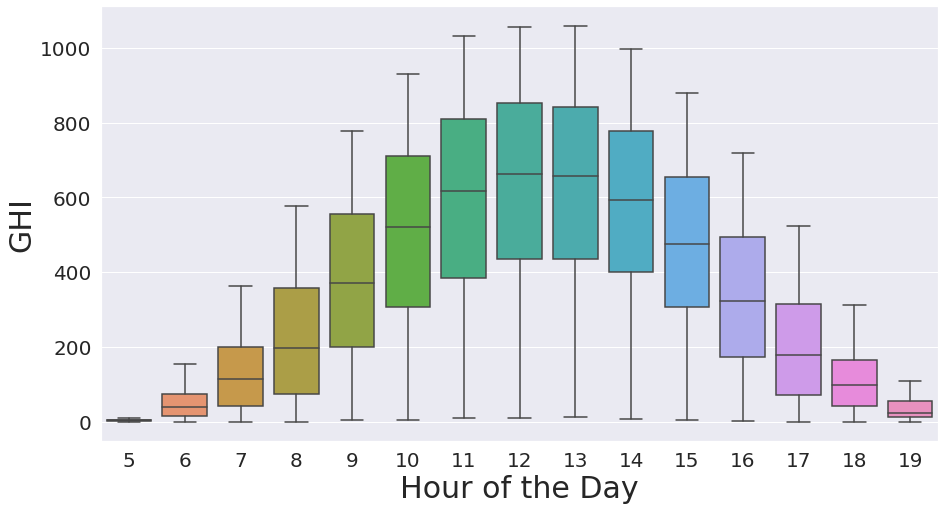

In [ ]:
df2box = dftemp
df2box['Hour'] = df2box.index.hour
df2box = df2box.dropna()
s=sns.boxplot(x="Hour",y="GHI",data=df2box)
s.set_xlabel("Hour of the Day",fontsize=30)
s.set_ylabel("GHI",fontsize=30)
s.tick_params(labelsize=20)
plt.show


# **Train Test Validation Split**

In [ ]:
#df1 = df1.drop(['Month'], axis = 'columns')
mask1 = (df1.index > '1998-01-01') & (df1.index <= '2018-12-29')
dftrain = df1.loc[mask1]
traindates = dftrain.index
dftrain.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
Date,,,,,,,,,,,,,,,
1998-01-01 08:00:00,30,30,87.63,72.32,-4.0,0,0,0,0,0,0,0,0,0,1.0
1998-01-01 08:30:00,113,113,82.35,62.36,-2.0,0,0,0,0,0,0,0,0,0,1.0
1998-01-01 09:00:00,206,206,77.35,53.12,-1.0,0,0,0,0,0,0,0,0,0,1.0
1998-01-01 09:30:00,297,297,72.70,49.40,0.0,0,0,0,0,0,0,0,0,0,1.0
1998-01-01 10:00:00,380,380,68.48,46.97,1.0,0,0,0,0,0,0,0,0,0,1.0


In [ ]:
mask2 = (df1.index > '2018-12-29') & (df1.index <= '2019-12-29')
dfval = df1.loc[mask2]
valdates = dfval.index
dfval.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
Date,,,,,,,,,,,,,,,
2018-12-29 08:00:00,15,33,87.25,99.46,7.8,0,0,0,1,0,0,0,0,0,0.454545
2018-12-29 08:30:00,85,109,82.13,96.80,8.2,0,0,0,0,0,0,0,0,0,0.779817
2018-12-29 09:00:00,104,196,77.20,97.71,8.5,0,0,1,0,0,0,0,0,0,0.530612
2018-12-29 09:30:00,155,282,72.60,93.20,9.2,0,0,0,0,0,1,0,0,0,0.549645
2018-12-29 10:00:00,204,361,68.42,92.83,9.8,0,0,1,0,0,0,0,0,0,0.565097


In [ ]:
mask3 = (df1.index > '2019-12-29') & (df1.index <= '2021-01-01')
dftest = df1.loc[mask3]
testdates = dftest.index
dftest.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
Date,,,,,,,,,,,,,,,
2019-12-29 08:00:00,10,30,87.24,100.00,15.8,0,0,0,1,0,0,0,0,0,0.333333
2019-12-29 08:30:00,25,100,82.12,97.16,16.3,0,0,0,1,0,0,0,0,0,0.250000
2019-12-29 09:00:00,20,182,77.19,99.40,16.8,0,0,0,0,0,1,0,0,0,0.109890
2019-12-29 09:30:00,64,263,72.60,96.32,17.3,0,0,0,0,0,1,0,0,0,0.243346
2019-12-29 10:00:00,69,339,68.42,98.01,17.8,0,0,0,0,0,1,0,0,0,0.203540


# **K-means clustering**

In [ ]:
mask4 = (df1.index > '2020-01-01') & (df1.index <= '2021-01-01')
Daily = df1.loc[mask4]
Dailydates = Daily.index
testyear = Daily
Daily = Daily.reset_index()
Daily=Daily.resample('H',on='Date').mean()
testyear.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
Date,,,,,,,,,,,,,,,
2020-01-01 08:00:00,25,32,87.35,90.41,1.6,0,0,0,0,0,0,0,0,0,0.78125
2020-01-01 08:30:00,91,111,82.22,82.43,2.9,0,0,0,0,0,0,0,0,0,0.81982
2020-01-01 09:00:00,181,200,77.27,78.43,4.1,0,0,0,0,0,0,0,0,0,0.90500
2020-01-01 09:30:00,279,288,72.65,69.20,5.9,0,0,0,0,0,0,0,0,0,0.96875
2020-01-01 10:00:00,359,369,68.44,55.88,7.7,0,0,0,0,0,0,0,0,0,0.97290


In [ ]:
Daily = Daily.reset_index()
Daily=Daily.resample('D',on='Date').sum()
Daily = Daily.drop(['clearness-index'], axis = 1)
Daily['clearness-index'] = Daily['GHI'].astype(float) / Daily['Clearsky GHI'].astype(float)
#print(Daily['clearness-index'].isna().sum())
Daily = Daily.dropna()
Daily.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
Date,,,,,,,,,,,,,,,
2020-01-01,3257.0,3563.5,692.445,589.290,88.30,0.0,0.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.913989
2020-01-02,277.0,3166.0,691.745,939.160,80.75,0.0,0.0,0.0,0.5,1.5,6.5,1.5,0.0,0.0,0.087492
2020-01-03,607.0,3249.0,690.995,987.130,182.70,0.0,0.0,1.0,4.5,1.5,0.5,2.0,0.0,0.0,0.186827
2020-01-04,2510.5,3540.5,690.130,707.250,109.90,0.0,1.0,0.5,3.5,0.0,0.0,0.0,0.0,0.0,0.709081
2020-01-05,3666.0,3666.0,689.225,630.455,67.90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000


[]

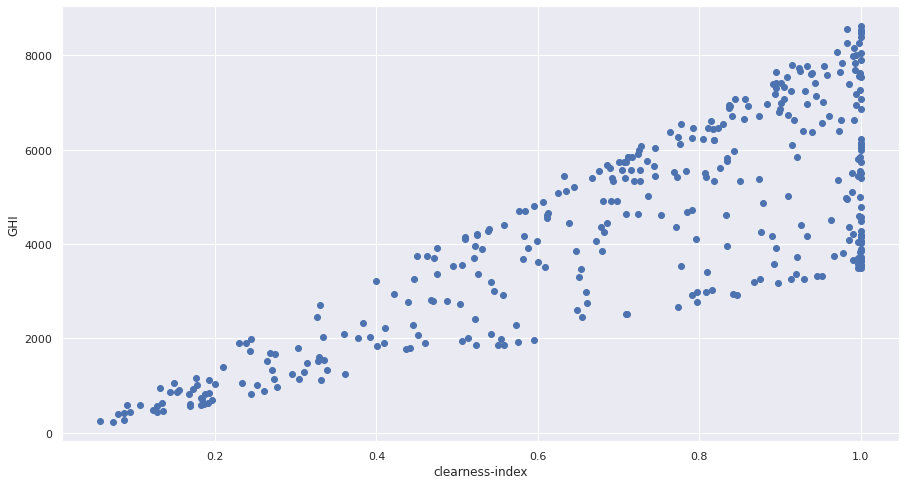

In [ ]:
from sklearn.cluster import KMeans
plt.scatter(Daily['clearness-index'], Daily['GHI'])
plt.xlabel('clearness-index')
plt.ylabel('GHI')
plt.plot()

[]

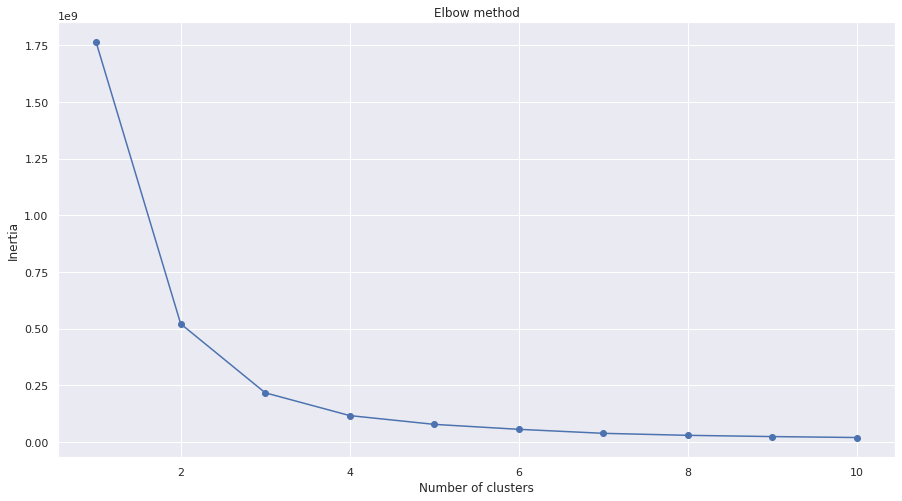

In [ ]:
data = list(zip(Daily['clearness-index'], Daily['GHI']))
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.plot()

In [ ]:
km = KMeans(n_clusters=3)
clusters = km.fit_predict(Daily[['clearness-index', 'GHI']])
Daily['cluster'] = clusters
Daily.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,cluster
Date,,,,,,,,,,,,,,,,
2020-01-01,3257.0,3563.5,692.445,589.290,88.30,0.0,0.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.913989,0
2020-01-02,277.0,3166.0,691.745,939.160,80.75,0.0,0.0,0.0,0.5,1.5,6.5,1.5,0.0,0.0,0.087492,2
2020-01-03,607.0,3249.0,690.995,987.130,182.70,0.0,0.0,1.0,4.5,1.5,0.5,2.0,0.0,0.0,0.186827,2
2020-01-04,2510.5,3540.5,690.130,707.250,109.90,0.0,1.0,0.5,3.5,0.0,0.0,0.0,0.0,0.0,0.709081,2
2020-01-05,3666.0,3666.0,689.225,630.455,67.90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0


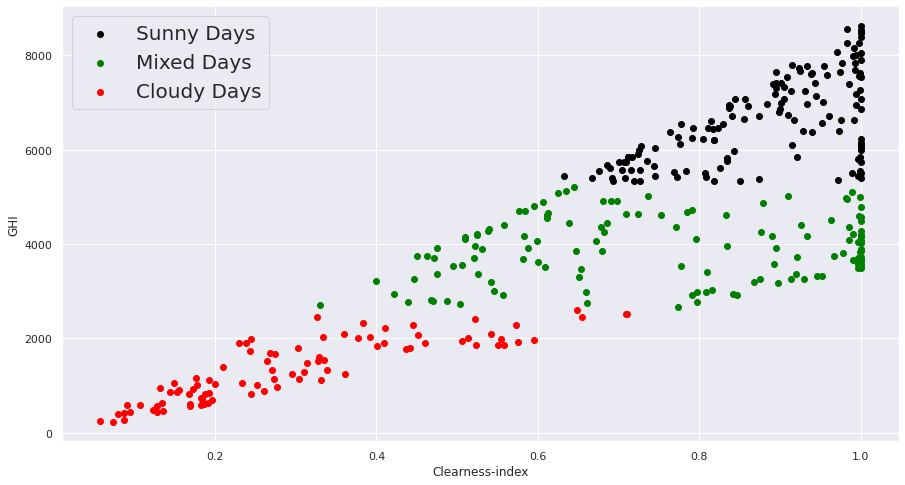

In [ ]:
cluster0 = Daily[Daily.cluster == 0]
cluster1 = Daily[Daily.cluster == 1]
cluster2 = Daily[Daily.cluster == 2]
grn = plt.scatter(cluster0['clearness-index'], cluster0['GHI'], color = 'green')
blk = plt.scatter(cluster1['clearness-index'], cluster1['GHI'], color = 'black')
red = plt.scatter(cluster2['clearness-index'], cluster2['GHI'], color = 'red')
plt.xlabel('Clearness-index')
plt.ylabel('GHI')
plt.legend((blk, grn, red),
           ('Sunny Days', 'Mixed Days', 'Cloudy Days'),
           scatterpoints=1,
           loc='upper left',
           ncol=1,
           fontsize=20)

In [ ]:
clus = 1
clum = 0
cluc = 2

In [ ]:
print(cluster0['cluster'].value_counts())
print(cluster1['cluster'].value_counts())
print(cluster2['cluster'].value_counts())

0    136
Name: cluster, dtype: int64
1    140
Name: cluster, dtype: int64
2    89
Name: cluster, dtype: int64


# **Data Normalization**

In [ ]:
cols1 = list(dftrain)[:]
cols2 = list(dfval)[:]
cols3 = list(dftest)[:]
dftrain = dftrain[cols1].astype(float)
dfval = dfval[cols2].astype(float)
dftest = dftest[cols3].astype(float)
dftrain.dtypes #, dfval.dtypes, dftest.dtypes

GHI                   float64
Clearsky GHI          float64
Solar Zenith Angle    float64
Relative Humidity     float64
Temperature           float64
Probably Clear        float64
Fog                   float64
Water                 float64
Super-Cooled Water    float64
Mixed                 float64
Opaque Ice            float64
Cirrus                float64
Overlapping           float64
Overshooting          float64
clearness-index       float64
dtype: object

In [ ]:
from sklearn.preprocessing import MinMaxScaler

Scaler = MinMaxScaler()
#Scalertr = Scaler.fit(dftrain)
#dftrain_scaled = Scalertr.transform(dftrain)
Scaler = Scaler.fit(dftrain)
dftrain_scaled = Scaler.transform(dftrain)

#Scalervl = Scaler.fit(dfval)
#dfval_scaled = Scalervl.transform(dfval)
dfval_scaled = Scaler.transform(dfval)

#Scalerts = Scaler.fit(dftest)
#dftest_scaled = Scalerts.transform(dftest)
dftest_scaled = Scaler.transform(dftest)

dftrain_scaled.shape, dfval_scaled.shape, dftest_scaled.shape

((182218, 15), (9068, 15), (9122, 15))

# **Tensors for models**

In [ ]:
n_past = 60

n_future = 1 
X_train = []
y_train = []

for i in range(n_past, len(dftrain_scaled) - n_future +1):
    X_train.append(dftrain_scaled[i - n_past:i, 0:dftrain_scaled.shape[1]])
    y_train.append(dftrain_scaled[i + n_future - 1:i + n_future, 0])

X_train, y_train = np.array(X_train), np.array(y_train)

print('X_train shape == {}.'.format(X_train.shape))
print('y_train shape == {}.'.format(y_train.shape))

n_future = 1 
X_val = []
y_val = []

for i in range(n_past, len(dfval_scaled) - n_future +1):
    X_val.append(dfval_scaled[i - n_past:i, 0:dfval_scaled.shape[1]])
    y_val.append(dfval_scaled[i + n_future - 1:i + n_future, 0])

X_val, y_val = np.array(X_val), np.array(y_val)

print('X_val shape == {}.'.format(X_val.shape))
print('y_val shape == {}.'.format(y_val.shape))

n_future = 1 
X_test = []
y_test = []

for i in range(n_past, len(dftest_scaled) - n_future +1):
    X_test.append(dftest_scaled[i - n_past:i, 0:dftest_scaled.shape[1]])
    y_test.append(dftest_scaled[i + n_future - 1:i + n_future, 0])

X_test, y_test = np.array(X_test), np.array(y_test)

print('X_test shape == {}.'.format(X_test.shape))
print('y_test shape == {}.'.format(y_test.shape))

X_train shape == (182158, 60, 15).
y_train shape == (182158, 1).
X_val shape == (9008, 60, 15).
y_val shape == (9008, 1).
X_test shape == (9062, 60, 15).
y_test shape == (9062, 1).


# **LSTM**

In [ ]:
from keras.callbacks import ModelCheckpoint
# define the Autoencoder model

model = Sequential()
model.add(LSTM(64, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model.add(LSTM(32, activation='relu', return_sequences=False))
model.add(Dropout(0.1))
model.add(Dense(32))
#model.add(Dense(16))
#model.add(Dense(8))
model.add(Dense(y_train.shape[1]))
cp1 = ModelCheckpoint(filepath = '/content/drive/MyDrive/FYP complete files/LSTMH6/', monitor = 'val_loss',mode = 'min' , save_best_only=True, verbose = 2)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 60, 64)            20480     
                                                                 
 lstm_1 (LSTM)               (None, 32)                12416     
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense (Dense)               (None, 32)                1056      
                                                                 
 dense_1 (Dense)             (None, 1)                 33        
                                                                 
Total params: 33,985
Trainable params: 33,985
Non-trainable params: 0
_________________________________________________________________


Epoch 1/30
45/45 [==============================] - ETA: 0s - loss: 0.2150 - mape: 344348.2500 - root_mean_squared_error: 0.2611
Epoch 1: val_loss improved from inf to 0.17141, saving model to /content/drive/MyDrive/FYP complete files/LSTMH6/
45/45 [==============================] - 20s 366ms/step - loss: 0.2150 - mape: 344348.2500 - root_mean_squared_error: 0.2611 - val_loss: 0.1714 - val_mape: 187188.9844 - val_root_mean_squared_error: 0.2092
Epoch 2/30
45/45 [==============================] - ETA: 0s - loss: 0.1230 - mape: 129697.8828 - root_mean_squared_error: 0.1597
Epoch 2: val_loss improved from 0.17141 to 0.07416, saving model to /content/drive/MyDrive/FYP complete files/LSTMH6/
45/45 [==============================] - 15s 343ms/step - loss: 0.1230 - mape: 129697.8828 - root_mean_squared_error: 0.1597 - val_loss: 0.0742 - val_mape: 43888.3594 - val_root_mean_squared_error: 0.0999
Epoch 3/30
45/45 [==============================] - ETA: 0s - loss: 0.0798 - mape: 57890.1953 - roo

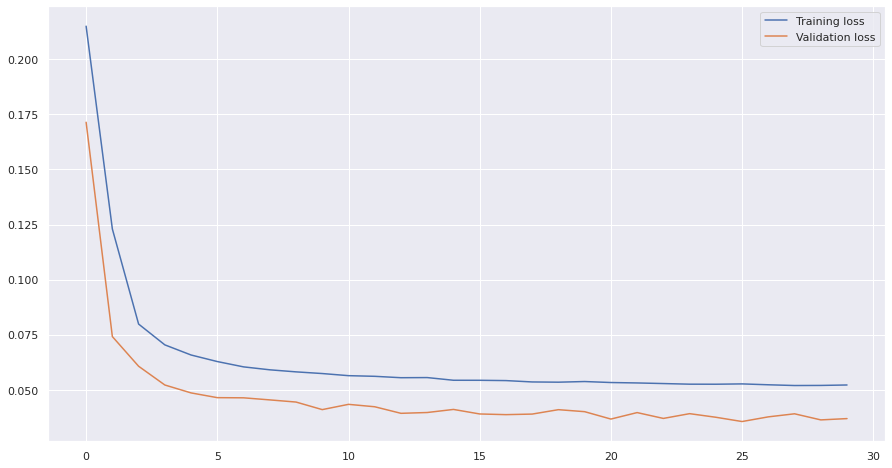

In [ ]:
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0005) , loss='mae' , metrics=['mape' ,tf.keras.metrics.RootMeanSquaredError()])

# fit the model
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=30, batch_size=4096, callbacks=[cp1])
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()

# **LSTM analysis**

In [ ]:
from keras.models import load_model
model = load_model('/content/drive/MyDrive/FYP complete files/LSTMH6/')

dftrain1 = dftrain
X_train1 = X_train
train_predictions1 = model.predict(X_train1)
prediction_copies1 = np.repeat(train_predictions1, dftrain1.shape[1], axis=-1)
#train_predictions1 = Scalertr.inverse_transform(prediction_copies1)[:,0]
train_predictions1 = Scaler.inverse_transform(prediction_copies1)[:,0]

y_train1 = y_train
actual_copies1 = np.repeat(y_train1, dftrain1.shape[1], axis=-1)
#y_train1 = Scalertr.inverse_transform(actual_copies1)[:,0]
y_train1 = Scaler.inverse_transform(actual_copies1)[:,0]

train_predictions1 = train_predictions1.flatten()
y_train1 = y_train1.flatten()


5693/5693 [==============================] - 79s 14ms/step


In [ ]:
train_results1 = pd.DataFrame(data={'Train Predictions':train_predictions1, 'Actuals':y_train1, 'Date':traindates[60:]})
train_results1.set_index('Date', inplace = True)
train_results1.head()

,Train Predictions,Actuals
Date,,
1998-01-04 08:30:00,40.329880,35.0
1998-01-04 09:00:00,82.073898,72.0
1998-01-04 09:30:00,110.334442,119.0
1998-01-04 10:00:00,146.778595,193.0
1998-01-04 10:30:00,213.931320,239.0


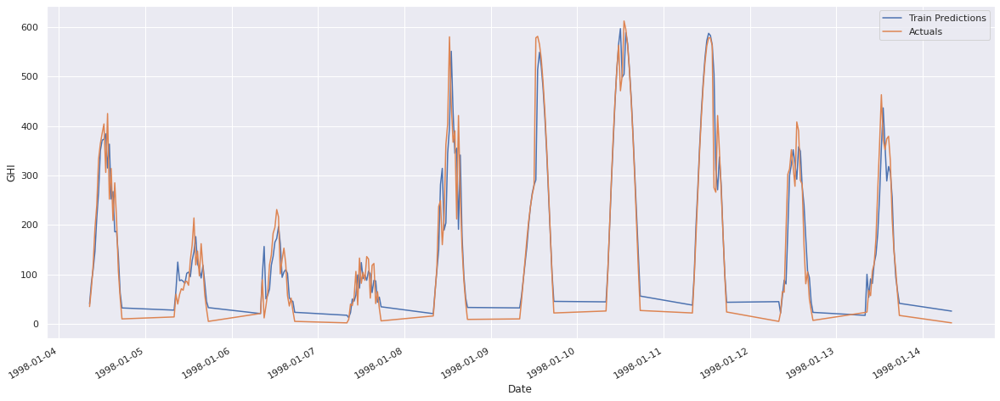

In [ ]:
train_results1['Train Predictions'][:200].plot(figsize=(20,8), label='Train Predictions')
train_results1['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()


In [ ]:
dfval1 = dfval
X_val1 = X_val
val_predictions1 = model.predict(X_val1)
prediction_copies1 = np.repeat(val_predictions1, dfval1.shape[1], axis=-1)
#val_predictions1 = Scalervl.inverse_transform(prediction_copies1)[:,0]
val_predictions1 = Scaler.inverse_transform(prediction_copies1)[:,0]


y_val1 = y_val
actual_copies1 = np.repeat(y_val1, dfval1.shape[1], axis=-1)
#y_val1 = Scalervl.inverse_transform(actual_copies1)[:,0]
y_val1 = Scaler.inverse_transform(actual_copies1)[:,0]

val_predictions1 = val_predictions1.flatten()
y_val1 = y_val1.flatten()

val_results1 = pd.DataFrame(data={'Val Predictions':val_predictions1, 'Actuals':y_val1, 'Date':valdates[60:]})
val_results1.set_index('Date', inplace = True)
val_results1.head()

282/282 [==============================] - 5s 17ms/step


,Val Predictions,Actuals
Date,,
2019-01-01 08:00:00,15.728327,9.0
2019-01-01 08:30:00,37.492550,31.0
2019-01-01 09:00:00,80.234795,58.0
2019-01-01 09:30:00,105.799988,66.0
2019-01-01 10:00:00,107.608681,69.0


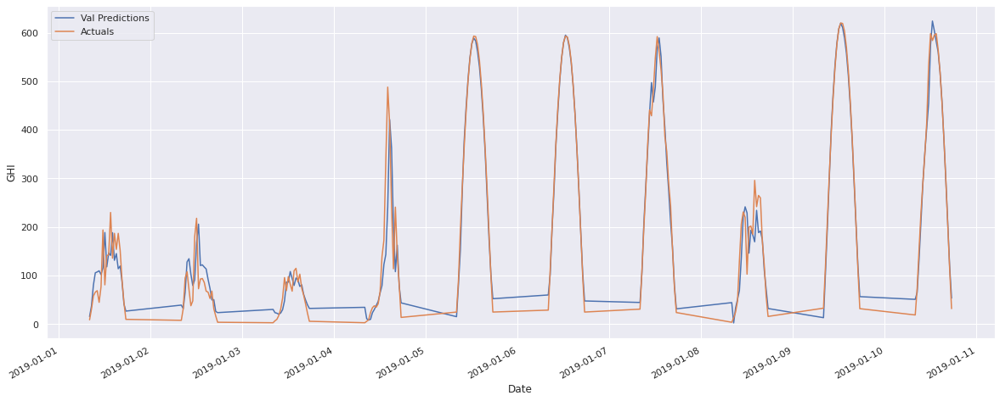

In [ ]:
val_results1['Val Predictions'][:200].plot(figsize=(20,8), label='Val Predictions')
val_results1['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
from sklearn.metrics import r2_score

dftest1 = dftest
X_test1 = X_test
test_predictions1 = model.predict(X_test1)
prediction_copies1 = np.repeat(test_predictions1, dftest1.shape[1], axis=-1)
#test_predictions1 = Scalerts.inverse_transform(prediction_copies1)[:,0]
test_predictions1 = Scaler.inverse_transform(prediction_copies1)[:,0]


y_test1 = y_test
actual_copies1 = np.repeat(y_test1, dftest1.shape[1], axis=-1)
#y_test1 = Scalerts.inverse_transform(actual_copies1)[:,0]
y_test1 = Scaler.inverse_transform(actual_copies1)[:,0]


y_test1 = y_test1.flatten()

test_results1 = pd.DataFrame(data={'Test Predictions':test_predictions1, 'Actuals':y_test1.flatten(), 'Date':testdates[60:]})
test_results1.set_index('Date', inplace = True)
Rsquared1 =r2_score(y_test1, test_predictions1)
mape1 = tf.keras.metrics.mean_absolute_percentage_error(y_test1, test_predictions1)
mae1 = tf.keras.metrics.mean_absolute_error(y_test1, test_predictions1)

m1 = tf.keras.metrics.RootMeanSquaredError()
m1.update_state(y_test1, test_predictions1)
rmse1 = m1.result().numpy()

#rmse1 =  tf.keras.metrics.RootMeanSquaredError(y_test1, test_predictions1)
mean1 =np.mean(y_test1)
test_results1, print('Rsqrared: ', Rsquared1), print('MAPE: ',mape1), print('MAE: ',mae1), print('RMSE: ',rmse1), print('Mean: ',mean1)

284/284 [==============================] - 4s 13ms/step
Rsqrared:  0.942414393391356
MAPE:  tf.Tensor(63796764.0, shape=(), dtype=float32)
MAE:  tf.Tensor(41.241932, shape=(), dtype=float32)
RMSE:  67.70796
Mean:  348.3554403001545


(                     Test Predictions  Actuals
 Date                                          
 2020-01-01 08:00:00         52.078556     25.0
 2020-01-01 08:30:00         87.478119     91.0
 2020-01-01 09:00:00        167.022797    181.0
 2020-01-01 09:30:00        254.758545    279.0
 2020-01-01 10:00:00        354.547607    359.0
 ...                               ...      ...
 2020-12-31 15:30:00         90.923103     44.0
 2020-12-31 16:00:00         69.170135     38.0
 2020-12-31 16:30:00         49.296082     27.0
 2020-12-31 17:00:00         28.892006     14.0
 2020-12-31 17:30:00         10.118139      3.0
 
 [9062 rows x 2 columns], None, None, None, None, None)

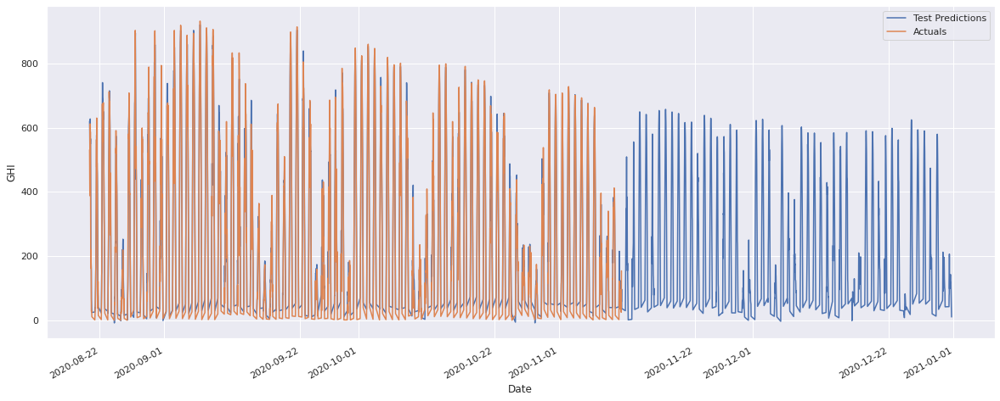

In [ ]:
test_results1['Test Predictions'][6000:].plot(figsize=(20,8), label='Test Predictions')
test_results1['Actuals'][6000:8000].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

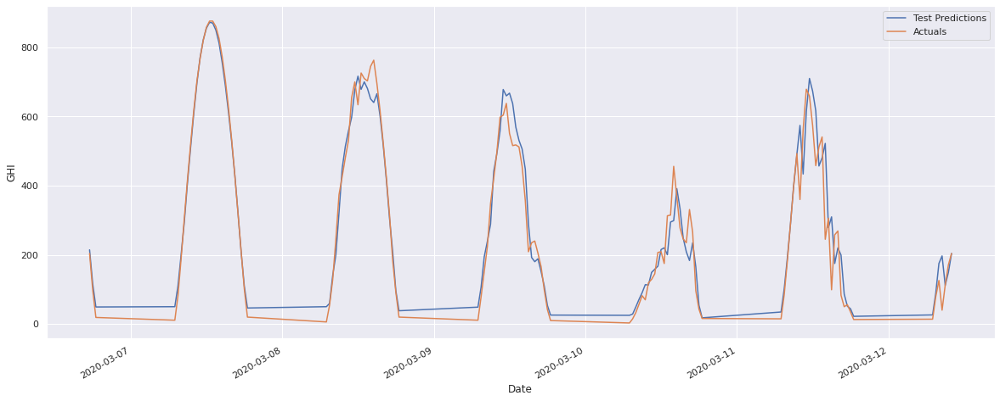

In [ ]:
test_results1['Test Predictions'][1410:1540].plot(figsize=(20,8), label='Test Predictions')
test_results1['Actuals'][1410:1540].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

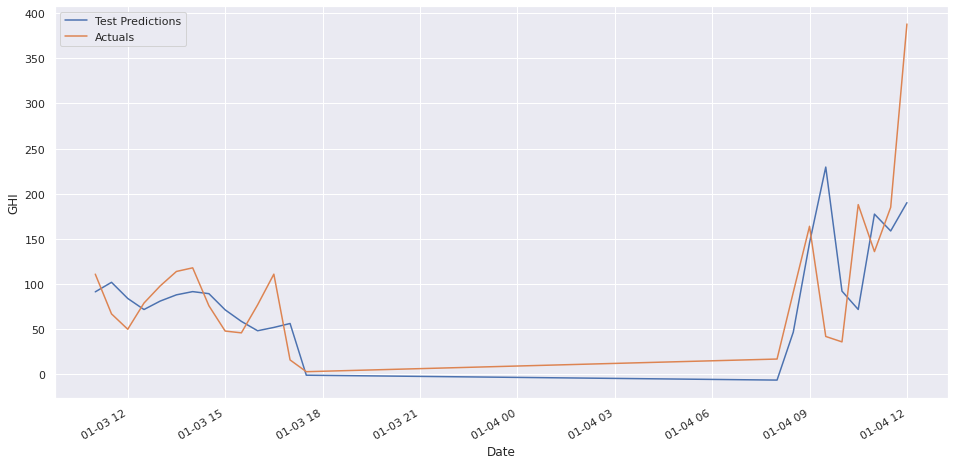

In [ ]:
test_results1['Test Predictions'][46:69].plot(figsize=(16,8), label='Test Predictions')
test_results1['Actuals'][46:69].plot(figsize=(16,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
test_results10 = test_results1
test_results1 = test_results1.reset_index()
test_results1 = test_results1.drop(['Date'], axis = 'columns')

In [ ]:
testyear = testyear.reset_index()
testyear

,Date,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
0,2020-01-01 08:00:00,25,32,87.35,90.41,1.6,0,0,0,0,0,0,0,0,0,0.781250
1,2020-01-01 08:30:00,91,111,82.22,82.43,2.9,0,0,0,0,0,0,0,0,0,0.819820
2,2020-01-01 09:00:00,181,200,77.27,78.43,4.1,0,0,0,0,0,0,0,0,0,0.905000
3,2020-01-01 09:30:00,279,288,72.65,69.20,5.9,0,0,0,0,0,0,0,0,0,0.968750
4,2020-01-01 10:00:00,359,369,68.44,55.88,7.7,0,0,0,0,0,0,0,0,0,0.972900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9057,2020-12-31 15:30:00,44,321,69.56,96.51,15.8,0,0,0,0,0,1,0,0,0,0.137072
9058,2020-12-31 16:00:00,38,242,73.89,97.82,15.5,0,0,0,1,0,0,0,0,0,0.157025
9059,2020-12-31 16:30:00,27,158,78.61,100.00,14.5,0,0,0,1,0,0,0,0,0,0.170886
9060,2020-12-31 17:00:00,14,77,83.63,100.00,13.5,0,0,0,1,0,0,0,0,0,0.181818


# **Daily Reults 1**

In [ ]:
testyear1 = pd.concat([testyear,test_results1], axis = 'columns')
testyear1.head()

,Date,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
0,2020-01-01 08:00:00,25,32,87.35,90.41,1.6,0,0,0,0,0,0,0,0,0,0.78125,52.078556,25.0
1,2020-01-01 08:30:00,91,111,82.22,82.43,2.9,0,0,0,0,0,0,0,0,0,0.81982,87.478119,91.0
2,2020-01-01 09:00:00,181,200,77.27,78.43,4.1,0,0,0,0,0,0,0,0,0,0.90500,167.022797,181.0
3,2020-01-01 09:30:00,279,288,72.65,69.20,5.9,0,0,0,0,0,0,0,0,0,0.96875,254.758545,279.0
4,2020-01-01 10:00:00,359,369,68.44,55.88,7.7,0,0,0,0,0,0,0,0,0,0.97290,354.547607,359.0


In [ ]:
testyear1 = testyear1.resample('D',on='Date').sum()

In [ ]:
testyear1.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,6514,7127,1384.89,1178.58,176.6,0,0,0,4,0,2,0,0,0,17.334613,6622.289551,6514.0
2020-01-02,554,6332,1383.49,1878.32,161.5,0,0,0,1,3,13,3,0,0,1.884887,1028.255737,554.0
2020-01-03,1214,6498,1381.99,1974.26,365.4,0,0,2,9,3,1,4,0,0,3.983212,1156.815063,1214.0
2020-01-04,5021,7081,1380.26,1414.50,219.8,0,2,1,7,0,0,0,0,0,13.493359,4841.107910,5021.0
2020-01-05,7332,7332,1378.45,1260.91,135.8,0,0,0,0,0,0,0,0,0,20.000000,7368.443359,7332.0


In [ ]:
#testyear1 = testyear1.dropna()
testyear1 = testyear1.drop("2020-02-29")
testyear1

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,6514,7127,1384.89,1178.58,176.6,0,0,0,4,0,2,0,0,0,17.334613,6622.289551,6514.0
2020-01-02,554,6332,1383.49,1878.32,161.5,0,0,0,1,3,13,3,0,0,1.884887,1028.255737,554.0
2020-01-03,1214,6498,1381.99,1974.26,365.4,0,0,2,9,3,1,4,0,0,3.983212,1156.815063,1214.0
2020-01-04,5021,7081,1380.26,1414.50,219.8,0,2,1,7,0,0,0,0,0,13.493359,4841.107910,5021.0
2020-01-05,7332,7332,1378.45,1260.91,135.8,0,0,0,0,0,0,0,0,0,20.000000,7368.443359,7332.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,7154,7157,1389.59,1239.62,154.9,0,0,0,0,0,0,0,0,0,19.988506,7201.876953,7154.0
2020-12-28,3704,6633,1388.66,1608.23,203.6,0,1,5,5,0,3,0,0,0,12.554911,4184.497070,3704.0
2020-12-29,6645,7023,1387.66,1488.35,223.5,0,0,0,1,0,0,0,0,0,18.935431,6714.444336,6645.0


In [ ]:
testyear1['cluster'] = clusters
testyear1.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals,cluster
Date,,,,,,,,,,,,,,,,,,
2020-01-01,6514,7127,1384.89,1178.58,176.6,0,0,0,4,0,2,0,0,0,17.334613,6622.289551,6514.0,0
2020-01-02,554,6332,1383.49,1878.32,161.5,0,0,0,1,3,13,3,0,0,1.884887,1028.255737,554.0,2
2020-01-03,1214,6498,1381.99,1974.26,365.4,0,0,2,9,3,1,4,0,0,3.983212,1156.815063,1214.0,2
2020-01-04,5021,7081,1380.26,1414.50,219.8,0,2,1,7,0,0,0,0,0,13.493359,4841.107910,5021.0,2
2020-01-05,7332,7332,1378.45,1260.91,135.8,0,0,0,0,0,0,0,0,0,20.000000,7368.443359,7332.0,0


# **Dividing days according to clusters**

In [ ]:
 Fullyear1= testyear1[['Test Predictions',	'Actuals']]

In [ ]:
Fullyeararrap1 =  Fullyear1['Test Predictions'].to_numpy()
Fullyearac1 =  Fullyear1['Actuals'].to_numpy()

In [ ]:
RsquaredFullyear1 =r2_score(Fullyearac1, Fullyeararrap1)
mapeFullyear1 = tf.keras.metrics.mean_absolute_percentage_error(Fullyearac1, Fullyeararrap1)
maeFullyear1 = tf.keras.metrics.mean_absolute_error(Fullyearac1, Fullyeararrap1)

mFullyear1 = tf.keras.metrics.RootMeanSquaredError()
mFullyear1.update_state(Fullyearac1, Fullyeararrap1)
rmseFullyear1 = mFullyear1.result().numpy()
meanFullyear1 =np.mean(Fullyearac1)
print('Rsqrared: ', RsquaredFullyear1), print('MAPE: ',mapeFullyear1), print('MAE: ',maeFullyear1), print('RMSE: ',rmseFullyear1), print('Mean: ',meanFullyear1)



Rsqrared:  0.9853163067035134
MAPE:  tf.Tensor(8.914269, shape=(), dtype=float32)
MAE:  tf.Tensor(388.27487, shape=(), dtype=float32)
RMSE:  532.4436
Mean:  8648.758904109589


(None, None, None, None, None)

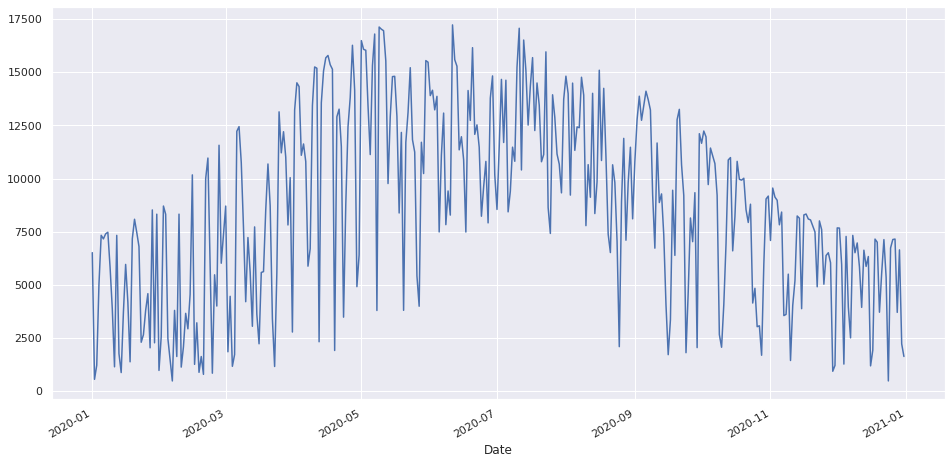

In [ ]:
Fullyear1['Actuals'][:].plot(figsize=(16,8), label='Actuals')

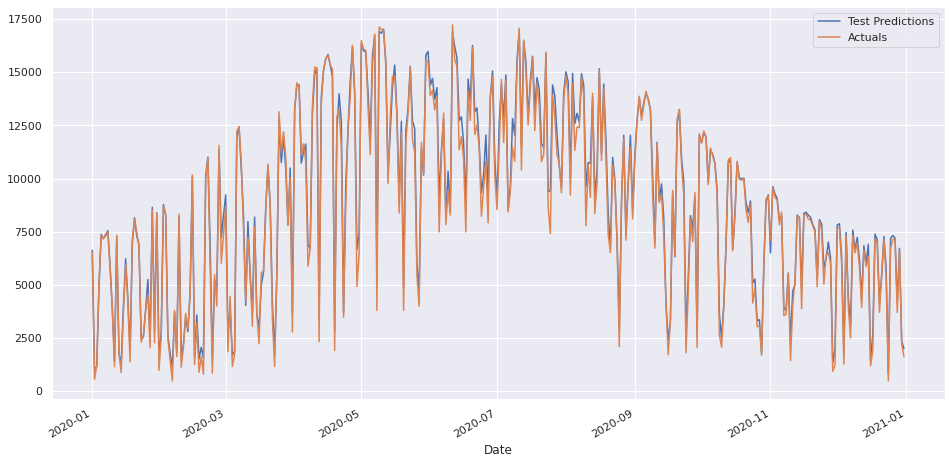

In [ ]:
Fullyear1['Test Predictions'][:].plot(figsize=(16,8), label='Test Predictions')
Fullyear1['Actuals'][:].plot(figsize=(16,8), label='Actuals')
plt.legend()

# Clusters Sorting

In [ ]:
sunnydays1 = testyear1[testyear1.cluster == clus]
mixeddays1 = testyear1[testyear1.cluster == clum]
cloudydays1 = testyear1[testyear1.cluster == cluc]

In [ ]:
sunnydays1 = sunnydays1[['Test Predictions',	'Actuals']]
sunnydays1

,Test Predictions,Actuals
Date,,
2020-02-22,11011.281250,10966.0
2020-02-27,11370.709961,11568.0
2020-03-06,11975.571289,12225.0
2020-03-07,12437.291992,12445.0
2020-03-08,10488.367188,10751.0
2020-03-20,10583.022461,10687.0
2020-03-25,12867.068359,13140.0
2020-03-26,10758.875977,11211.0
2020-03-27,11953.946289,12205.0


In [ ]:
sunnyarrap1 = sunnydays1['Test Predictions'].to_numpy()
sunnyac1 = sunnydays1['Actuals'].to_numpy()


In [ ]:
Rsquaredsunny1 =r2_score(sunnyac1, sunnyarrap1)
mapesunny1 = tf.keras.metrics.mean_absolute_percentage_error(sunnyac1, sunnyarrap1)
maesunny1 = tf.keras.metrics.mean_absolute_error(sunnyac1, sunnyarrap1)

msunny1 = tf.keras.metrics.RootMeanSquaredError()
msunny1.update_state(sunnyac1, sunnyarrap1)
rmsesunny1 = msunny1.result().numpy()
meansunny1 =np.mean(sunnyac1)
print('Rsqrared: ', Rsquaredsunny1), print('MAPE: ',mapesunny1), print('MAE: ',maesunny1), print('RMSE: ',rmsesunny1), print('Mean: ',meansunny1)



Rsqrared:  0.9252668064385501
MAPE:  tf.Tensor(3.0035553, shape=(), dtype=float32)
MAE:  tf.Tensor(373.76172, shape=(), dtype=float32)
RMSE:  506.44986
Mean:  13235.535714285714


(None, None, None, None, None)

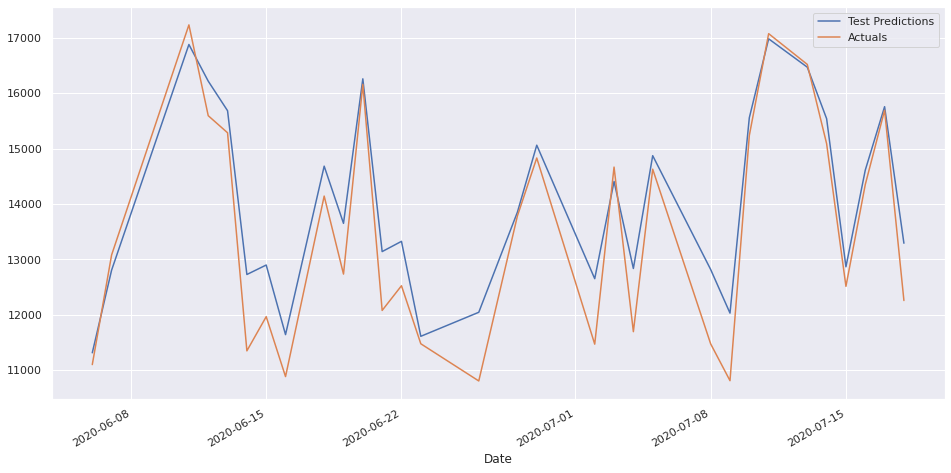

In [ ]:
sunnydays1['Test Predictions'][60:91].plot(figsize=(16,8), label='Test Predictions')
sunnydays1['Actuals'][60:91].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
mixdays1 = mixeddays1[['Test Predictions',	'Actuals']]
mixdays1

,Test Predictions,Actuals
Date,,
2020-01-01,6622.289551,6514.0
2020-01-05,7368.443359,7332.0
2020-01-06,7190.704590,7163.0
2020-01-07,7321.228027,7398.0
2020-01-08,7549.731445,7475.0
2020-01-09,5875.288574,5830.0
2020-01-12,7274.514160,7329.0
2020-01-16,6225.471191,5961.0
2020-01-19,6902.310547,7167.0


In [ ]:
mixarrap1 = mixeddays1['Test Predictions'].to_numpy()
mixac1 = mixeddays1['Actuals'].to_numpy()

In [ ]:
Rsquaredmix1 =r2_score(mixac1, mixarrap1)
mapemix1 = tf.keras.metrics.mean_absolute_percentage_error(mixac1, mixarrap1)
maemix1 = tf.keras.metrics.mean_absolute_error(mixac1, mixarrap1)

mmix1 = tf.keras.metrics.RootMeanSquaredError()
mmix1.update_state(mixac1, mixarrap1)
rmsemix1 = mmix1.result().numpy()
meanmix1 =np.mean(mixac1)
print('Rsqrared: ', Rsquaredmix1), print('MAPE: ',mapemix1), print('MAE: ',maemix1), print('RMSE: ',rmsemix1), print('Mean: ',meanmix1)



Rsqrared:  0.8398987725044521
MAPE:  tf.Tensor(4.600587, shape=(), dtype=float32)
MAE:  tf.Tensor(349.1539, shape=(), dtype=float32)
RMSE:  525.08026
Mean:  7813.713235294118


(None, None, None, None, None)

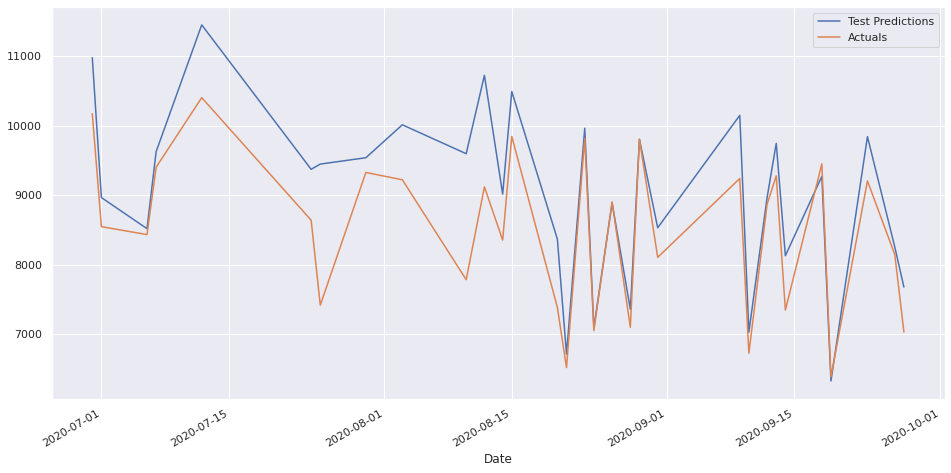

In [ ]:
mixeddays1['Test Predictions'][50:81].plot(figsize=(16,8), label='Test Predictions')
mixeddays1['Actuals'][50:81].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
cloudydays1 = cloudydays1[['Test Predictions',	'Actuals']]
cloudydays1

,Test Predictions,Actuals
Date,,
2020-01-02,1028.255737,554.0
2020-01-03,1156.815063,1214.0
2020-01-04,4841.107910,5021.0
2020-01-10,3886.484375,3868.0
2020-01-11,1396.880127,1143.0
2020-01-13,1751.513062,1763.0
2020-01-14,1308.083130,872.0
2020-01-15,3981.242920,3713.0
2020-01-17,4375.194824,4184.0


In [ ]:
cloudyarrap1 = cloudydays1['Test Predictions'].to_numpy()
cloudyac1 = cloudydays1['Actuals'].to_numpy()

In [ ]:
Rsquaredcloudy1 =r2_score(cloudyac1, cloudyarrap1)
mapecloudy1 = tf.keras.metrics.mean_absolute_percentage_error(cloudyac1, cloudyarrap1)
maecloudy1 = tf.keras.metrics.mean_absolute_error(cloudyac1, cloudyarrap1)

mcloudy1 = tf.keras.metrics.RootMeanSquaredError()
mcloudy1.update_state(cloudyac1, cloudyarrap1)
rmsecloudy1 = mcloudy1.result().numpy()
meancloudy1 =np.mean(cloudyac1)
print('Rsqrared: ', Rsquaredcloudy1), print('MAPE: ',mapecloudy1), print('MAE: ',maecloudy1), print('RMSE: ',rmsecloudy1), print('Mean: ',meancloudy1)

Rsqrared:  0.8031553775541419
MAPE:  tf.Tensor(24.803719, shape=(), dtype=float32)
MAE:  tf.Tensor(470.88492, shape=(), dtype=float32)
RMSE:  581.2699
Mean:  2709.629213483146


(None, None, None, None, None)

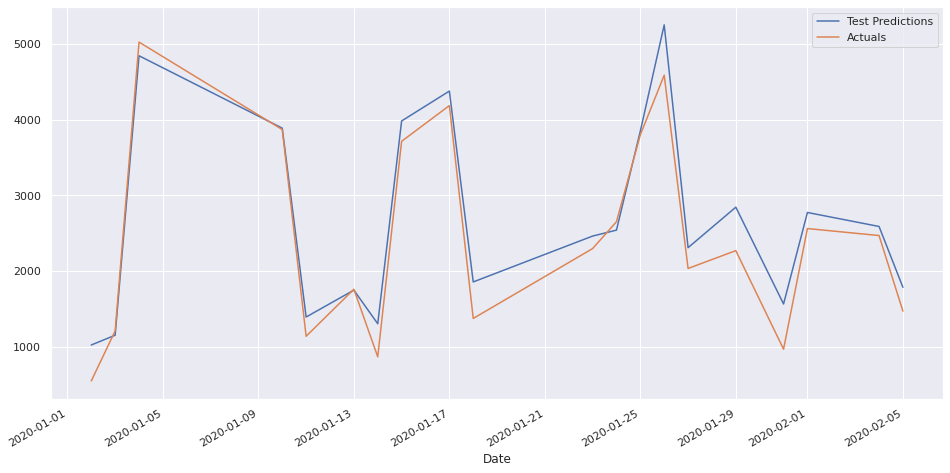

In [ ]:
cloudydays1['Test Predictions'][:20].plot(figsize=(16,8), label='Test Predictions')
cloudydays1['Actuals'][:20].plot(figsize=(16,8), label='Actuals')
plt.legend()

# **GRU**

In [ ]:
from keras.layers import GRU
model2 = Sequential()
model2.add(GRU(64, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model2.add(GRU(32, activation='relu', return_sequences=False))
model2.add(Dropout(0.1))
model2.add(Dense(32))
#model2.add(Dense(16))
#model2.add(Dense(8))
model2.add(Dense(y_train.shape[1]))
cp2 = ModelCheckpoint(filepath = '/content/drive/MyDrive/FYP complete files/GRU1/', monitor = 'val_loss',mode = 'min' , save_best_only=True, verbose = 2)
model2.summary()



Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 60, 64)            15552     
                                                                 
 gru_1 (GRU)                 (None, 32)                9408      
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 32)                1056      
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                                 
Total params: 26,049
Trainable params: 26,049
Non-trainable params: 0
_________________________________________________________________


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 60, 64)            15552     
                                                                 
 gru_1 (GRU)                 (None, 32)                9408      
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 32)                1056      
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                                 
Total params: 26,049
Trainable params: 26,049
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
45/45 [==============================] 

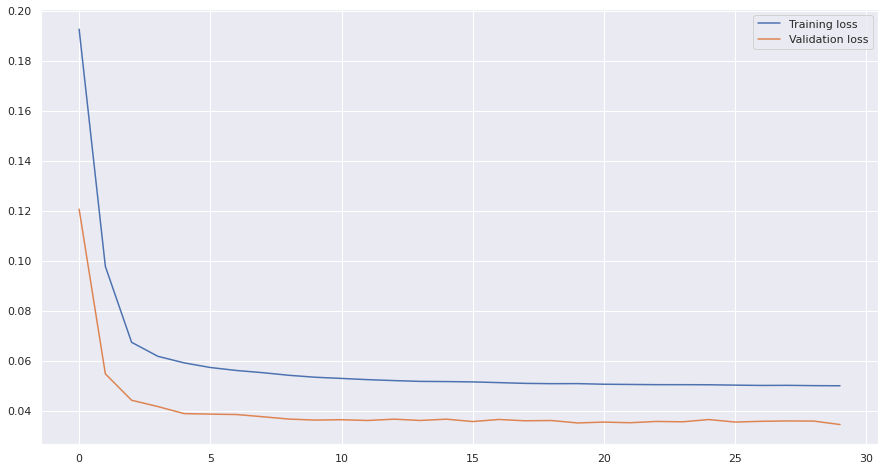

In [ ]:
model2.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0005) , loss='mae', metrics=['mape' , tf.keras.metrics.RootMeanSquaredError()])
model2.summary()
# fit the model
history2 = model2.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=30, batch_size=4096, callbacks=[cp2])
plt.plot(history2.history['loss'], label='Training loss')
plt.plot(history2.history['val_loss'], label='Validation loss')
plt.legend()

# **GRU analysis**

In [ ]:
from keras.models import load_model
model2 = load_model('/content/drive/MyDrive/FYP complete files/GRU1/')

dftrain2 = dftrain
X_train2 = X_train
train_predictions2 = model2.predict(X_train2)
prediction_copies2 = np.repeat(train_predictions2, dftrain2.shape[1], axis=-1)
train_predictions2 = Scaler.inverse_transform(prediction_copies2)[:,0]

y_train2 = y_train
actual_copies2 = np.repeat(y_train2, dftrain2.shape[1], axis=-1)
y_train2 = Scaler.inverse_transform(actual_copies2)[:,0]

train_predictions2 = train_predictions2.flatten()
y_train2 = y_train2.flatten()


5693/5693 [==============================] - 62s 11ms/step


In [ ]:
train_results2 = pd.DataFrame(data={'Train Predictions':train_predictions2, 'Actuals':y_train2, 'Date':traindates[60:]})
train_results2.set_index('Date', inplace = True)
train_results2.head()

,Train Predictions,Actuals
Date,,
1998-01-04 08:30:00,42.509609,35.0
1998-01-04 09:00:00,72.900040,72.0
1998-01-04 09:30:00,101.143471,119.0
1998-01-04 10:00:00,151.545502,193.0
1998-01-04 10:30:00,220.007660,239.0


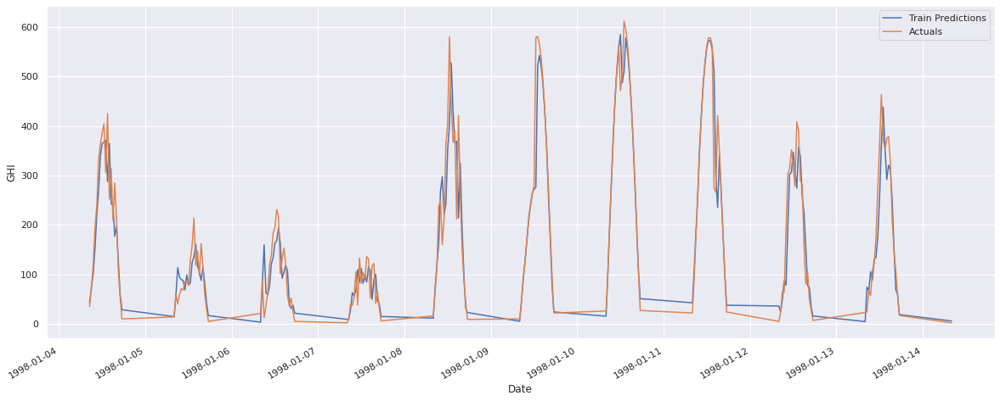

In [ ]:
train_results2['Train Predictions'][:200].plot(figsize=(20,8), label='Train Predictions')
train_results2['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()


In [ ]:
dfval2 = dfval
X_val2 = X_val
val_predictions2 = model2.predict(X_val2)
prediction_copies2 = np.repeat(val_predictions2, dfval2.shape[1], axis=-1)
#val_predictions2 = Scalervl.inverse_transform(prediction_copies2)[:,0]
val_predictions2 = Scaler.inverse_transform(prediction_copies2)[:,0]


y_val2 = y_val
actual_copies2 = np.repeat(y_val2, dfval2.shape[1], axis=-1)
#y_val2 = Scalervl.inverse_transform(actual_copies2)[:,0]
y_val2 = Scaler.inverse_transform(actual_copies2)[:,0]

val_predictions2 = val_predictions2.flatten()
y_val2 = y_val2.flatten()

val_results2 = pd.DataFrame(data={'Val Predictions':val_predictions2, 'Actuals':y_val2, 'Date':valdates[60:]})
val_results2.set_index('Date', inplace = True)
val_results2.head()

282/282 [==============================] - 3s 11ms/step


,Val Predictions,Actuals
Date,,
2019-01-01 08:00:00,-1.312473,9.0
2019-01-01 08:30:00,37.876789,31.0
2019-01-01 09:00:00,80.147499,58.0
2019-01-01 09:30:00,105.605148,66.0
2019-01-01 10:00:00,116.669624,69.0


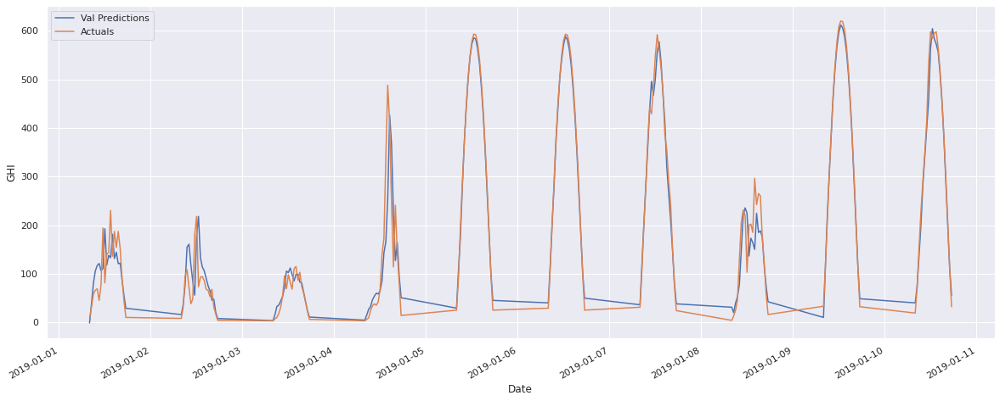

In [ ]:
val_results2['Val Predictions'][:200].plot(figsize=(20,8), label='Val Predictions')
val_results2['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
from sklearn.metrics import r2_score

dftest2 = dftest
X_test2 = X_test
test_predictions2 = model2.predict(X_test2)
prediction_copies2 = np.repeat(test_predictions2, dftest2.shape[1], axis=-1)
#test_predictions2 = Scalerts.inverse_transform(prediction_copies2)[:,0]
test_predictions2 = Scaler.inverse_transform(prediction_copies2)[:,0]


y_test2 = y_test
actual_copies2 = np.repeat(y_test2, dftest2.shape[1], axis=-1)
#y_test2 = Scalerts.inverse_transform(actual_copies2)[:,0]
y_test2 = Scaler.inverse_transform(actual_copies2)[:,0]


y_test2 = y_test2.flatten()

test_results2 = pd.DataFrame(data={'Test Predictions':test_predictions2, 'Actuals':y_test2.flatten(), 'Date':testdates[60:]})
test_results2.set_index('Date', inplace = True)
Rsquared2 =r2_score(y_test2, test_predictions2)
mape2 = tf.keras.metrics.mean_absolute_percentage_error(y_test2, test_predictions2)
mae2 = tf.keras.metrics.mean_absolute_error(y_test2, test_predictions2)

m2 = tf.keras.metrics.RootMeanSquaredError()
m2.update_state(y_test2, test_predictions2)
rmse2 = m2.result().numpy()

#rmse2 =  tf.keras.metrics.RootMeanSquaredError(y_test2, test_predictions2)
mean2 =np.mean(y_test2)
test_results2, print('Rsqrared: ', Rsquared2), print('MAPE: ',mape2), print('MAE: ',mae2), print('RMSE: ',rmse2), print('Mean: ',mean2)

284/284 [==============================] - 3s 11ms/step
Rsqrared:  0.9452291532473404
MAPE:  tf.Tensor(34331936.0, shape=(), dtype=float32)
MAE:  tf.Tensor(39.78895, shape=(), dtype=float32)
RMSE:  66.03246
Mean:  348.3554403001545


(                     Test Predictions  Actuals
 Date                                          
 2020-01-01 08:00:00         48.572632     25.0
 2020-01-01 08:30:00        111.208351     91.0
 2020-01-01 09:00:00        175.864426    181.0
 2020-01-01 09:30:00        251.085587    279.0
 2020-01-01 10:00:00        358.629700    359.0
 ...                               ...      ...
 2020-12-31 15:30:00         72.366325     44.0
 2020-12-31 16:00:00         46.675282     38.0
 2020-12-31 16:30:00         32.705379     27.0
 2020-12-31 17:00:00         16.271933     14.0
 2020-12-31 17:30:00          8.030874      3.0
 
 [9062 rows x 2 columns], None, None, None, None, None)

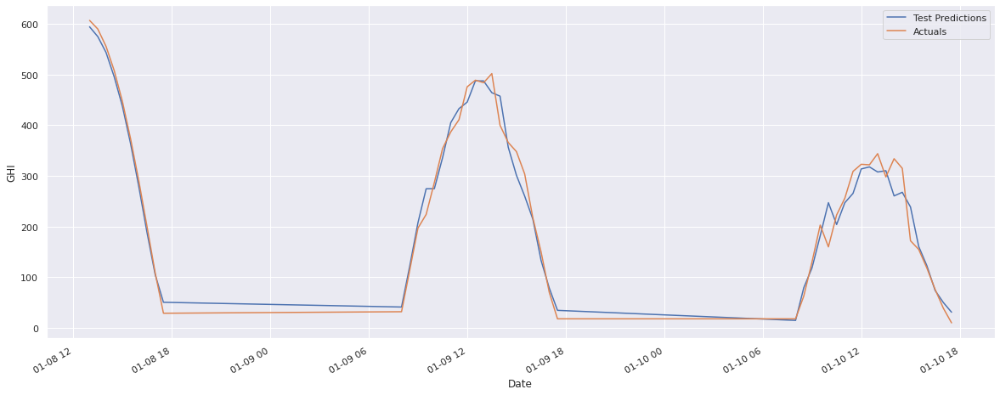

In [ ]:
test_results2['Test Predictions'][150:200].plot(figsize=(20,8), label='Test Predictions')
test_results2['Actuals'][150:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

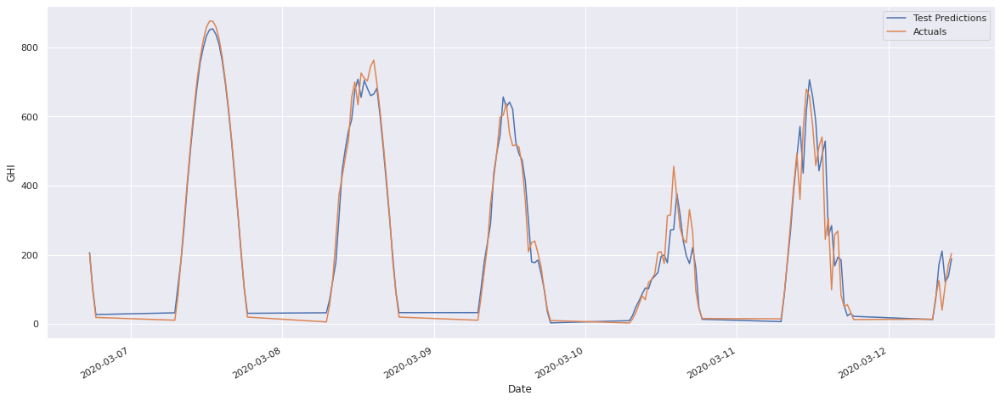

In [ ]:
test_results2['Test Predictions'][1410:1540].plot(figsize=(20,8), label='Test Predictions')
test_results2['Actuals'][1410:1540].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

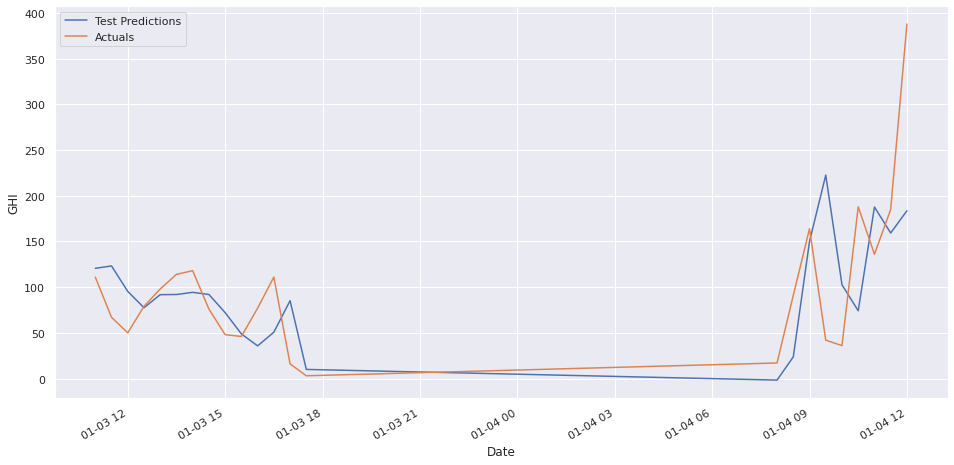

In [ ]:
test_results2['Test Predictions'][46:69].plot(figsize=(16,8), label='Test Predictions')
test_results2['Actuals'][46:69].plot(figsize=(16,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
test_results20 = test_results2
test_results2 = test_results2.reset_index()
test_results2 = test_results2.drop(['Date'], axis = 'columns')

# **Daily Reults GRU**

In [ ]:
testyear2 = pd.concat([testyear,test_results2], axis = 'columns')
testyear2.head()

,Date,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
0,2020-01-01 08:00:00,25,32,87.35,90.41,1.6,0,0,0,0,0,0,0,0,0,0.78125,48.572632,25.0
1,2020-01-01 08:30:00,91,111,82.22,82.43,2.9,0,0,0,0,0,0,0,0,0,0.81982,111.208351,91.0
2,2020-01-01 09:00:00,181,200,77.27,78.43,4.1,0,0,0,0,0,0,0,0,0,0.90500,175.864426,181.0
3,2020-01-01 09:30:00,279,288,72.65,69.20,5.9,0,0,0,0,0,0,0,0,0,0.96875,251.085587,279.0
4,2020-01-01 10:00:00,359,369,68.44,55.88,7.7,0,0,0,0,0,0,0,0,0,0.97290,358.629700,359.0


In [ ]:
testyear2 = testyear2.resample('D',on='Date').sum()

In [ ]:
testyear2.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,6514,7127,1384.89,1178.58,176.6,0,0,0,4,0,2,0,0,0,17.334613,6547.824219,6514.0
2020-01-02,554,6332,1383.49,1878.32,161.5,0,0,0,1,3,13,3,0,0,1.884887,847.864319,554.0
2020-01-03,1214,6498,1381.99,1974.26,365.4,0,0,2,9,3,1,4,0,0,3.983212,1301.393921,1214.0
2020-01-04,5021,7081,1380.26,1414.50,219.8,0,2,1,7,0,0,0,0,0,13.493359,4834.157227,5021.0
2020-01-05,7332,7332,1378.45,1260.91,135.8,0,0,0,0,0,0,0,0,0,20.000000,7279.639160,7332.0


In [ ]:
#testyear2 = testyear2.dropna()
testyear2 = testyear2.drop("2020-02-29")
testyear2

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,6514,7127,1384.89,1178.58,176.6,0,0,0,4,0,2,0,0,0,17.334613,6547.824219,6514.0
2020-01-02,554,6332,1383.49,1878.32,161.5,0,0,0,1,3,13,3,0,0,1.884887,847.864319,554.0
2020-01-03,1214,6498,1381.99,1974.26,365.4,0,0,2,9,3,1,4,0,0,3.983212,1301.393921,1214.0
2020-01-04,5021,7081,1380.26,1414.50,219.8,0,2,1,7,0,0,0,0,0,13.493359,4834.157227,5021.0
2020-01-05,7332,7332,1378.45,1260.91,135.8,0,0,0,0,0,0,0,0,0,20.000000,7279.639160,7332.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,7154,7157,1389.59,1239.62,154.9,0,0,0,0,0,0,0,0,0,19.988506,7116.419922,7154.0
2020-12-28,3704,6633,1388.66,1608.23,203.6,0,1,5,5,0,3,0,0,0,12.554911,3981.265137,3704.0
2020-12-29,6645,7023,1387.66,1488.35,223.5,0,0,0,1,0,0,0,0,0,18.935431,6673.856445,6645.0


In [ ]:
testyear2['cluster'] = clusters
testyear2.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals,cluster
Date,,,,,,,,,,,,,,,,,,
2020-01-01,6514,7127,1384.89,1178.58,176.6,0,0,0,4,0,2,0,0,0,17.334613,6547.824219,6514.0,0
2020-01-02,554,6332,1383.49,1878.32,161.5,0,0,0,1,3,13,3,0,0,1.884887,847.864319,554.0,2
2020-01-03,1214,6498,1381.99,1974.26,365.4,0,0,2,9,3,1,4,0,0,3.983212,1301.393921,1214.0,2
2020-01-04,5021,7081,1380.26,1414.50,219.8,0,2,1,7,0,0,0,0,0,13.493359,4834.157227,5021.0,2
2020-01-05,7332,7332,1378.45,1260.91,135.8,0,0,0,0,0,0,0,0,0,20.000000,7279.639160,7332.0,0


# **Dividing days according to clusters GRU**

In [ ]:
 Fullyear2= testyear2[['Test Predictions',	'Actuals']]

In [ ]:
Fullyeararrap2 =  Fullyear2['Test Predictions'].to_numpy()
Fullyearac2 =  Fullyear2['Actuals'].to_numpy()

In [ ]:
RsquaredFullyear2 =r2_score(Fullyearac2, Fullyeararrap2)
mapeFullyear2 = tf.keras.metrics.mean_absolute_percentage_error(Fullyearac2, Fullyeararrap2)
maeFullyear2 = tf.keras.metrics.mean_absolute_error(Fullyearac2, Fullyeararrap2)

mFullyear2 = tf.keras.metrics.RootMeanSquaredError()
mFullyear2.update_state(Fullyearac2, Fullyeararrap2)
rmseFullyear2 = mFullyear2.result().numpy()
meanFullyear2 =np.mean(Fullyearac2)
print('Rsqrared: ', RsquaredFullyear2), print('MAPE: ',mapeFullyear2), print('MAE: ',maeFullyear2), print('RMSE: ',rmseFullyear2), print('Mean: ',meanFullyear2)



Rsqrared:  0.9923132559485229
MAPE:  tf.Tensor(6.259771, shape=(), dtype=float32)
MAE:  tf.Tensor(289.14883, shape=(), dtype=float32)
RMSE:  385.23627
Mean:  8648.758904109589


(None, None, None, None, None)

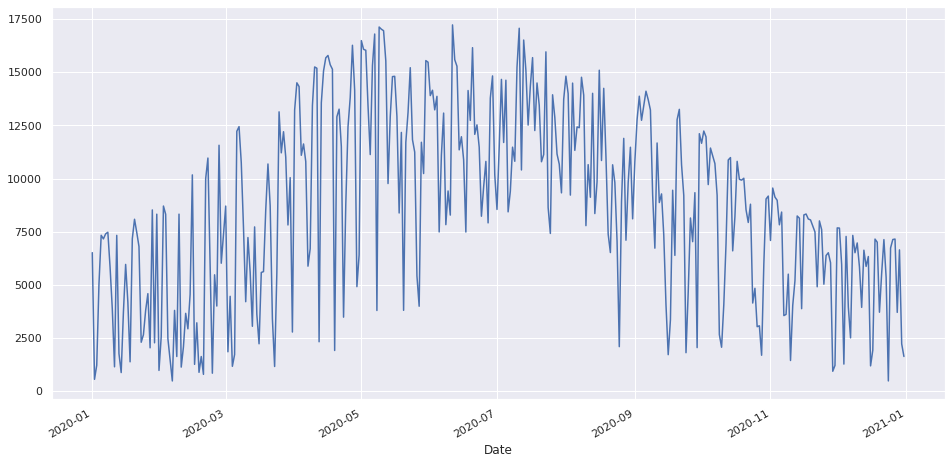

In [ ]:
Fullyear2['Actuals'][:].plot(figsize=(16,8), label='Actuals')

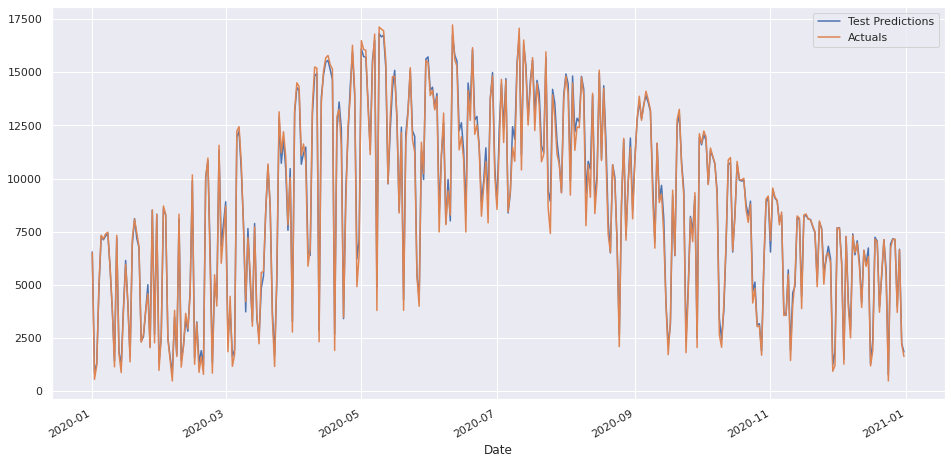

In [ ]:
Fullyear2['Test Predictions'][:].plot(figsize=(16,8), label='Test Predictions')
Fullyear2['Actuals'][:].plot(figsize=(16,8), label='Actuals')
plt.legend()

# Cluster sorting

In [ ]:
sunnydays2 = testyear2[testyear2.cluster == clus]
mixeddays2 = testyear2[testyear2.cluster == clum]
cloudydays2 = testyear2[testyear2.cluster == cluc]

In [ ]:
sunnydays2 = sunnydays2[['Test Predictions',	'Actuals']]
sunnydays2

,Test Predictions,Actuals
Date,,
2020-02-22,10837.223633,10966.0
2020-02-27,11317.180664,11568.0
2020-03-06,11945.240234,12225.0
2020-03-07,12228.779297,12445.0
2020-03-08,10400.323242,10751.0
2020-03-20,10591.856445,10687.0
2020-03-25,12857.904297,13140.0
2020-03-26,10720.408203,11211.0
2020-03-27,11846.142578,12205.0


In [ ]:
sunnyarrap2 = sunnydays2['Test Predictions'].to_numpy()
sunnyac2 = sunnydays2['Actuals'].to_numpy()


In [ ]:
Rsquaredsunny2 =r2_score(sunnyac2, sunnyarrap2)
mapesunny2 = tf.keras.metrics.mean_absolute_percentage_error(sunnyac2, sunnyarrap2)
maesunny2 = tf.keras.metrics.mean_absolute_error(sunnyac2, sunnyarrap2)

msunny2 = tf.keras.metrics.RootMeanSquaredError()
msunny2.update_state(sunnyac2, sunnyarrap2)
rmsesunny2 = msunny2.result().numpy()
meansunny2 =np.mean(sunnyac2)
print('Rsqrared: ', Rsquaredsunny2), print('MAPE: ',mapesunny2), print('MAE: ',maesunny2), print('RMSE: ',rmsesunny2), print('Mean: ',meansunny2)



Rsqrared:  0.9574896473546675
MAPE:  tf.Tensor(2.415238, shape=(), dtype=float32)
MAE:  tf.Tensor(306.637, shape=(), dtype=float32)
RMSE:  381.96805
Mean:  13235.535714285714


(None, None, None, None, None)

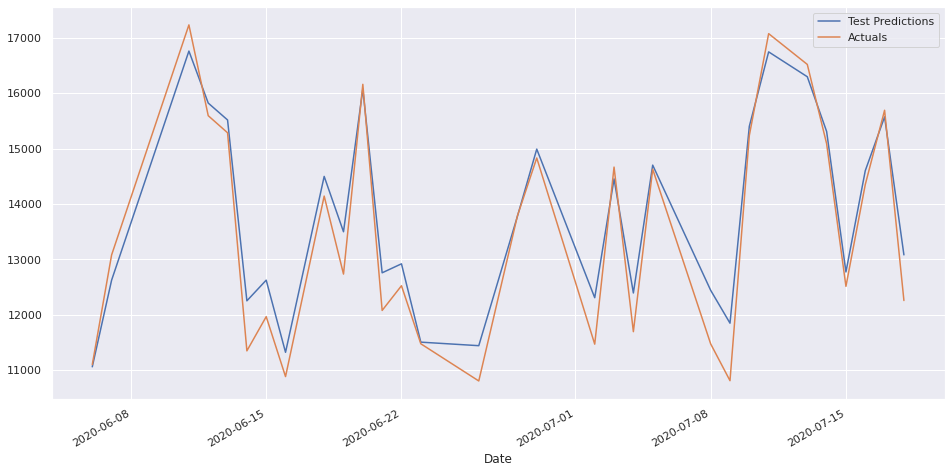

In [ ]:
sunnydays2['Test Predictions'][60:91].plot(figsize=(16,8), label='Test Predictions')
sunnydays2['Actuals'][60:91].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
mixdays2 = mixeddays2[['Test Predictions',	'Actuals']]
mixdays2

,Test Predictions,Actuals
Date,,
2020-01-01,6547.824219,6514.0
2020-01-05,7279.639160,7332.0
2020-01-06,7119.935059,7163.0
2020-01-07,7304.556641,7398.0
2020-01-08,7398.298340,7475.0
2020-01-09,5816.658691,5830.0
2020-01-12,7213.855469,7329.0
2020-01-16,6148.046875,5961.0
2020-01-19,6892.523926,7167.0


In [ ]:
mixarrap2 = mixeddays2['Test Predictions'].to_numpy()
mixac2 = mixeddays2['Actuals'].to_numpy()

In [ ]:
Rsquaredmix2 =r2_score(mixac2, mixarrap2)
mapemix2 = tf.keras.metrics.mean_absolute_percentage_error(mixac2, mixarrap2)
maemix2 = tf.keras.metrics.mean_absolute_error(mixac2, mixarrap2)

mmix2 = tf.keras.metrics.RootMeanSquaredError()
mmix2.update_state(mixac2, mixarrap2)
rmsemix2 = mmix2.result().numpy()
meanmix2 =np.mean(mixac2)
print('Rsqrared: ', Rsquaredmix2), print('MAPE: ',mapemix2), print('MAE: ',maemix2), print('RMSE: ',rmsemix2), print('Mean: ',meanmix2)



Rsqrared:  0.9131321499211896
MAPE:  tf.Tensor(3.3793457, shape=(), dtype=float32)
MAE:  tf.Tensor(253.73125, shape=(), dtype=float32)
RMSE:  386.77457
Mean:  7813.713235294118


(None, None, None, None, None)

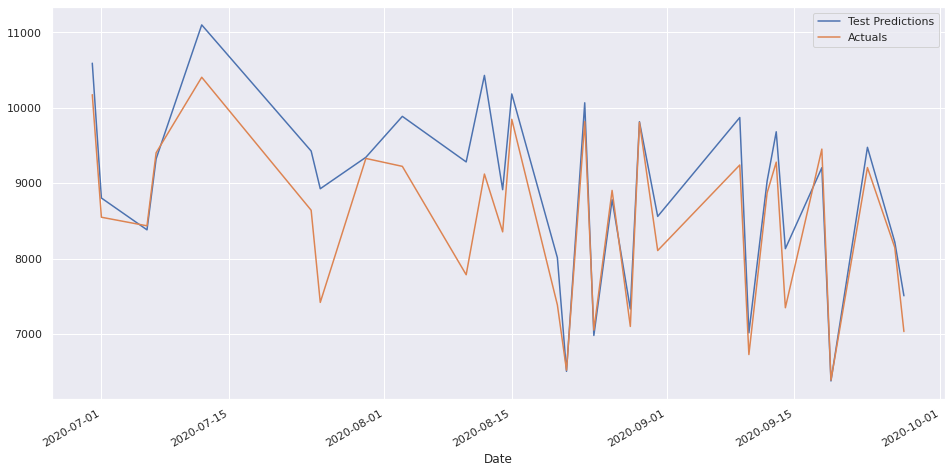

In [ ]:
mixeddays2['Test Predictions'][50:81].plot(figsize=(16,8), label='Test Predictions')
mixeddays2['Actuals'][50:81].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
cloudydays2 = cloudydays2[['Test Predictions',	'Actuals']]
cloudydays2

,Test Predictions,Actuals
Date,,
2020-01-02,847.864319,554.0
2020-01-03,1301.393921,1214.0
2020-01-04,4834.157227,5021.0
2020-01-10,3813.801025,3868.0
2020-01-11,1416.678589,1143.0
2020-01-13,1869.363892,1763.0
2020-01-14,1203.389282,872.0
2020-01-15,3868.234619,3713.0
2020-01-17,4082.832031,4184.0


In [ ]:
cloudyarrap2 = cloudydays2['Test Predictions'].to_numpy()
cloudyac2 = cloudydays2['Actuals'].to_numpy()

In [ ]:
Rsquaredcloudy2 =r2_score(cloudyac2, cloudyarrap2)
mapecloudy2 = tf.keras.metrics.mean_absolute_percentage_error(cloudyac2, cloudyarrap2)
maecloudy2 = tf.keras.metrics.mean_absolute_error(cloudyac2, cloudyarrap2)

mcloudy2 = tf.keras.metrics.RootMeanSquaredError()
mcloudy2.update_state(cloudyac2, cloudyarrap2)
rmsecloudy2 = mcloudy2.result().numpy()
meancloudy2 =np.mean(cloudyac2)
print('Rsqrared: ', Rsquaredcloudy2), print('MAPE: ',mapecloudy2), print('MAE: ',maecloudy2), print('RMSE: ',rmsecloudy2), print('Mean: ',meancloudy2)

Rsqrared:  0.9122979522644815
MAPE:  tf.Tensor(16.708897, shape=(), dtype=float32)
MAE:  tf.Tensor(315.7606, shape=(), dtype=float32)
RMSE:  387.9904
Mean:  2709.629213483146


(None, None, None, None, None)

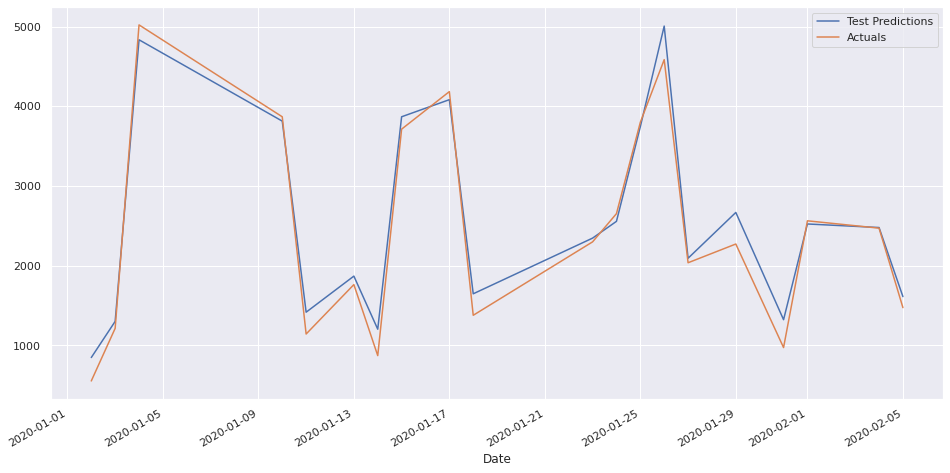

In [ ]:
cloudydays2['Test Predictions'][:20].plot(figsize=(16,8), label='Test Predictions')
cloudydays2['Actuals'][:20].plot(figsize=(16,8), label='Actuals')
plt.legend()

# **1D CONVOLUTIONAL**

In [ ]:
from keras.layers import *
model3 = Sequential()
model3.add(Conv1D(64, kernel_size=3, activation='relu',input_shape=(X_train.shape[1], X_train.shape[2])))
model3.add(MaxPooling1D(pool_size=2))
model3.add(Dropout(0.1))
model3.add(Flatten())
model3.add(Dense(8, 'relu'))
model3.add(Dense(1))

cp3 = ModelCheckpoint(filepath = '/content/drive/MyDrive/FYP complete files/1DCONV2/', monitor = 'val_loss',mode = 'min' , save_best_only=True, verbose = 2)
model3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 58, 64)            2944      
                                                                 
 max_pooling1d (MaxPooling1D  (None, 29, 64)           0         
 )                                                               
                                                                 
 dropout_2 (Dropout)         (None, 29, 64)            0         
                                                                 
 flatten (Flatten)           (None, 1856)              0         
                                                                 
 dense_4 (Dense)             (None, 8)                 14856     
                                                                 
 dense_5 (Dense)             (None, 1)                 9         
                                                      

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 58, 64)            2944      
                                                                 
 max_pooling1d (MaxPooling1D  (None, 29, 64)           0         
 )                                                               
                                                                 
 dropout_2 (Dropout)         (None, 29, 64)            0         
                                                                 
 flatten (Flatten)           (None, 1856)              0         
                                                                 
 dense_4 (Dense)             (None, 8)                 14856     
                                                                 
 dense_5 (Dense)             (None, 1)                 9         
                                                      

45/45 [==============================] - 8s 48ms/step - loss: 0.1827 - mape: 239079.2188 - root_mean_squared_error: 0.2309 - val_loss: 0.1099 - val_mape: 65724.3281 - val_root_mean_squared_error: 0.1415
Epoch 2/30
45/45 [==============================] - ETA: 0s - loss: 0.1165 - mape: 88505.5000 - root_mean_squared_error: 0.1520
Epoch 2: val_loss improved from 0.10992 to 0.08617, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 39ms/step - loss: 0.1165 - mape: 88505.5000 - root_mean_squared_error: 0.1520 - val_loss: 0.0862 - val_mape: 43257.1641 - val_root_mean_squared_error: 0.1155
Epoch 3/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0952 - mape: 71994.6328 - root_mean_squared_error: 0.1276
Epoch 3: val_loss improved from 0.08617 to 0.07199, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 38ms/step - loss: 0.0950 - mape: 73150.4609 - root_mean_squared_error: 0.1273 - val_loss: 0.0720 - val_mape: 45417.8438 - val_root_mean_squared_error: 0.1009
Epoch 4/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0830 - mape: 59210.8359 - root_mean_squared_error: 0.1143
Epoch 4: val_loss improved from 0.07199 to 0.06603, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 40ms/step - loss: 0.0829 - mape: 58878.3398 - root_mean_squared_error: 0.1141 - val_loss: 0.0660 - val_mape: 37702.1797 - val_root_mean_squared_error: 0.0933
Epoch 5/30
45/45 [==============================] - ETA: 0s - loss: 0.0759 - mape: 53210.1992 - root_mean_squared_error: 0.1069
Epoch 5: val_loss improved from 0.06603 to 0.06228, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 39ms/step - loss: 0.0759 - mape: 53210.1992 - root_mean_squared_error: 0.1069 - val_loss: 0.0623 - val_mape: 35426.6523 - val_root_mean_squared_error: 0.0876
Epoch 6/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0711 - mape: 46553.0938 - root_mean_squared_error: 0.1018
Epoch 6: val_loss improved from 0.06228 to 0.05758, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 39ms/step - loss: 0.0711 - mape: 46907.4570 - root_mean_squared_error: 0.1017 - val_loss: 0.0576 - val_mape: 36882.0898 - val_root_mean_squared_error: 0.0835
Epoch 7/30
45/45 [==============================] - ETA: 0s - loss: 0.0677 - mape: 46565.9219 - root_mean_squared_error: 0.0983
Epoch 7: val_loss improved from 0.05758 to 0.05606, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 39ms/step - loss: 0.0677 - mape: 46565.9219 - root_mean_squared_error: 0.0983 - val_loss: 0.0561 - val_mape: 38411.8359 - val_root_mean_squared_error: 0.0826
Epoch 8/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0651 - mape: 41022.9922 - root_mean_squared_error: 0.0959
Epoch 8: val_loss improved from 0.05606 to 0.05433, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 39ms/step - loss: 0.0650 - mape: 40509.9609 - root_mean_squared_error: 0.0958 - val_loss: 0.0543 - val_mape: 35801.2734 - val_root_mean_squared_error: 0.0796
Epoch 9/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0630 - mape: 39589.1250 - root_mean_squared_error: 0.0938
Epoch 9: val_loss improved from 0.05433 to 0.05294, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 39ms/step - loss: 0.0630 - mape: 40180.7266 - root_mean_squared_error: 0.0938 - val_loss: 0.0529 - val_mape: 32953.7539 - val_root_mean_squared_error: 0.0775
Epoch 10/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0612 - mape: 38397.3555 - root_mean_squared_error: 0.0920
Epoch 10: val_loss improved from 0.05294 to 0.05119, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 38ms/step - loss: 0.0612 - mape: 37919.6562 - root_mean_squared_error: 0.0921 - val_loss: 0.0512 - val_mape: 30111.4785 - val_root_mean_squared_error: 0.0762
Epoch 11/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0602 - mape: 37871.6406 - root_mean_squared_error: 0.0913
Epoch 11: val_loss improved from 0.05119 to 0.05029, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 38ms/step - loss: 0.0601 - mape: 37169.3242 - root_mean_squared_error: 0.0912 - val_loss: 0.0503 - val_mape: 30175.3848 - val_root_mean_squared_error: 0.0749
Epoch 12/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0589 - mape: 39167.4922 - root_mean_squared_error: 0.0902
Epoch 12: val_loss improved from 0.05029 to 0.04965, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 37ms/step - loss: 0.0589 - mape: 38930.1055 - root_mean_squared_error: 0.0902 - val_loss: 0.0496 - val_mape: 26922.2480 - val_root_mean_squared_error: 0.0748
Epoch 13/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0579 - mape: 38456.2148 - root_mean_squared_error: 0.0895
Epoch 13: val_loss improved from 0.04965 to 0.04911, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 48ms/step - loss: 0.0579 - mape: 37964.7266 - root_mean_squared_error: 0.0894 - val_loss: 0.0491 - val_mape: 24047.1660 - val_root_mean_squared_error: 0.0731
Epoch 14/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0571 - mape: 37476.4570 - root_mean_squared_error: 0.0888
Epoch 14: val_loss improved from 0.04911 to 0.04854, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 37ms/step - loss: 0.0571 - mape: 37212.8242 - root_mean_squared_error: 0.0887 - val_loss: 0.0485 - val_mape: 25777.4980 - val_root_mean_squared_error: 0.0725
Epoch 15/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0566 - mape: 35512.2031 - root_mean_squared_error: 0.0883
Epoch 15: val_loss improved from 0.04854 to 0.04742, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 37ms/step - loss: 0.0566 - mape: 36096.3359 - root_mean_squared_error: 0.0883 - val_loss: 0.0474 - val_mape: 24423.3984 - val_root_mean_squared_error: 0.0716
Epoch 16/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0558 - mape: 35922.0078 - root_mean_squared_error: 0.0877
Epoch 16: val_loss improved from 0.04742 to 0.04700, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 38ms/step - loss: 0.0558 - mape: 35928.9336 - root_mean_squared_error: 0.0876 - val_loss: 0.0470 - val_mape: 25063.5391 - val_root_mean_squared_error: 0.0719
Epoch 17/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0552 - mape: 35293.0859 - root_mean_squared_error: 0.0872
Epoch 17: val_loss did not improve from 0.04700
45/45 [==============================] - 1s 22ms/step - loss: 0.0553 - mape: 35058.3867 - root_mean_squared_error: 0.0872 - val_loss: 0.0471 - val_mape: 24177.4629 - val_root_mean_squared_error: 0.0718
Epoch 18/30
44/45 [============================>.] - ETA: 0s - loss: 0.0547 - mape: 35059.4258 - root_mean_squared_error: 0.0869
Epoch 18: val_loss improved from 0.04700 to 0.04631, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 38ms/step - loss: 0.0547 - mape: 34860.8750 - root_mean_squared_error: 0.0869 - val_loss: 0.0463 - val_mape: 24239.3652 - val_root_mean_squared_error: 0.0714
Epoch 19/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0544 - mape: 33465.3711 - root_mean_squared_error: 0.0865
Epoch 19: val_loss improved from 0.04631 to 0.04611, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 38ms/step - loss: 0.0544 - mape: 33608.5352 - root_mean_squared_error: 0.0865 - val_loss: 0.0461 - val_mape: 23801.5801 - val_root_mean_squared_error: 0.0719
Epoch 20/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0540 - mape: 33822.1484 - root_mean_squared_error: 0.0862
Epoch 20: val_loss improved from 0.04611 to 0.04608, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 37ms/step - loss: 0.0540 - mape: 33818.2227 - root_mean_squared_error: 0.0862 - val_loss: 0.0461 - val_mape: 23670.2910 - val_root_mean_squared_error: 0.0707
Epoch 21/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0536 - mape: 31147.3750 - root_mean_squared_error: 0.0858
Epoch 21: val_loss improved from 0.04608 to 0.04414, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 38ms/step - loss: 0.0536 - mape: 32180.9141 - root_mean_squared_error: 0.0858 - val_loss: 0.0441 - val_mape: 21900.4609 - val_root_mean_squared_error: 0.0691
Epoch 22/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0534 - mape: 32072.2441 - root_mean_squared_error: 0.0858
Epoch 22: val_loss did not improve from 0.04414
45/45 [==============================] - 1s 21ms/step - loss: 0.0534 - mape: 32125.3145 - root_mean_squared_error: 0.0858 - val_loss: 0.0453 - val_mape: 21212.2988 - val_root_mean_squared_error: 0.0688
Epoch 23/30
45/45 [==============================] - ETA: 0s - loss: 0.0530 - mape: 32607.2949 - root_mean_squared_error: 0.0855
Epoch 23: val_loss improved from 0.04414 to 0.04405, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 38ms/step - loss: 0.0530 - mape: 32607.2949 - root_mean_squared_error: 0.0855 - val_loss: 0.0440 - val_mape: 21890.3418 - val_root_mean_squared_error: 0.0686
Epoch 24/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0525 - mape: 30512.7246 - root_mean_squared_error: 0.0852
Epoch 24: val_loss improved from 0.04405 to 0.04400, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 38ms/step - loss: 0.0525 - mape: 31121.2871 - root_mean_squared_error: 0.0851 - val_loss: 0.0440 - val_mape: 22030.0293 - val_root_mean_squared_error: 0.0691
Epoch 25/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0524 - mape: 31486.7969 - root_mean_squared_error: 0.0849
Epoch 25: val_loss improved from 0.04400 to 0.04361, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 39ms/step - loss: 0.0524 - mape: 32315.0742 - root_mean_squared_error: 0.0849 - val_loss: 0.0436 - val_mape: 21222.8242 - val_root_mean_squared_error: 0.0686
Epoch 26/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0519 - mape: 30721.0957 - root_mean_squared_error: 0.0845
Epoch 26: val_loss did not improve from 0.04361
45/45 [==============================] - 1s 22ms/step - loss: 0.0520 - mape: 30481.7422 - root_mean_squared_error: 0.0846 - val_loss: 0.0440 - val_mape: 22244.5469 - val_root_mean_squared_error: 0.0686
Epoch 27/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0518 - mape: 30571.9297 - root_mean_squared_error: 0.0844
Epoch 27: val_loss improved from 0.04361 to 0.04259, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 40ms/step - loss: 0.0518 - mape: 30694.8945 - root_mean_squared_error: 0.0844 - val_loss: 0.0426 - val_mape: 20910.2617 - val_root_mean_squared_error: 0.0676
Epoch 28/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0515 - mape: 30494.3516 - root_mean_squared_error: 0.0841
Epoch 28: val_loss did not improve from 0.04259
45/45 [==============================] - 1s 22ms/step - loss: 0.0515 - mape: 30054.0098 - root_mean_squared_error: 0.0841 - val_loss: 0.0428 - val_mape: 20909.1270 - val_root_mean_squared_error: 0.0676
Epoch 29/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0513 - mape: 28487.3574 - root_mean_squared_error: 0.0842
Epoch 29: val_loss improved from 0.04259 to 0.04250, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 38ms/step - loss: 0.0513 - mape: 28231.9355 - root_mean_squared_error: 0.0841 - val_loss: 0.0425 - val_mape: 20339.7598 - val_root_mean_squared_error: 0.0669
Epoch 30/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0511 - mape: 29360.8105 - root_mean_squared_error: 0.0840
Epoch 30: val_loss improved from 0.04250 to 0.04246, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 38ms/step - loss: 0.0511 - mape: 29592.5762 - root_mean_squared_error: 0.0840 - val_loss: 0.0425 - val_mape: 21492.8203 - val_root_mean_squared_error: 0.0671


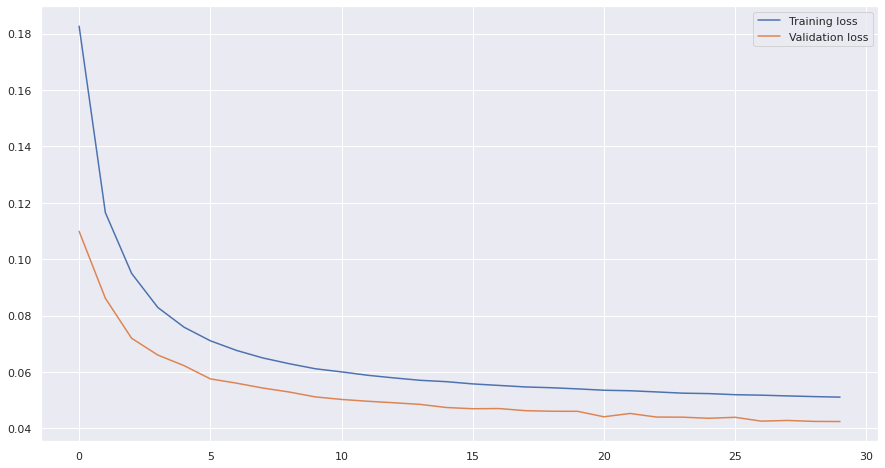

In [ ]:
model3.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0005), loss='mae', metrics=['mape' , tf.keras.metrics.RootMeanSquaredError()])
model3.summary()
# fit the model
history3 = model3.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=30, batch_size=4096, callbacks=[cp3])
plt.plot(history3.history['loss'], label='Training loss')
plt.plot(history3.history['val_loss'], label='Validation loss')
plt.legend()

# **CNN analysis**

In [ ]:
from keras.models import load_model
model3 = load_model('/content/drive/MyDrive/FYP complete files/1DCONV2/')

dftrain3 = dftrain
X_train3 = X_train
train_predictions3 = model3.predict(X_train3)
prediction_copies3 = np.repeat(train_predictions3, dftrain3.shape[1], axis=-1)
train_predictions3 = Scaler.inverse_transform(prediction_copies3)[:,0]

y_train3 = y_train
actual_copies3 = np.repeat(y_train3, dftrain3.shape[1], axis=-1)
y_train3 = Scaler.inverse_transform(actual_copies3)[:,0]

train_predictions3 = train_predictions3.flatten()
y_train3 = y_train3.flatten()


5693/5693 [==============================] - 12s 2ms/step


In [ ]:
train_results3 = pd.DataFrame(data={'Train Predictions':train_predictions3, 'Actuals':y_train3, 'Date':traindates[60:]})
train_results3.set_index('Date', inplace = True)
train_results3.head()

,Train Predictions,Actuals
Date,,
1998-01-04 08:30:00,52.864922,35.0
1998-01-04 09:00:00,83.833099,72.0
1998-01-04 09:30:00,153.146622,119.0
1998-01-04 10:00:00,197.025696,193.0
1998-01-04 10:30:00,237.900528,239.0


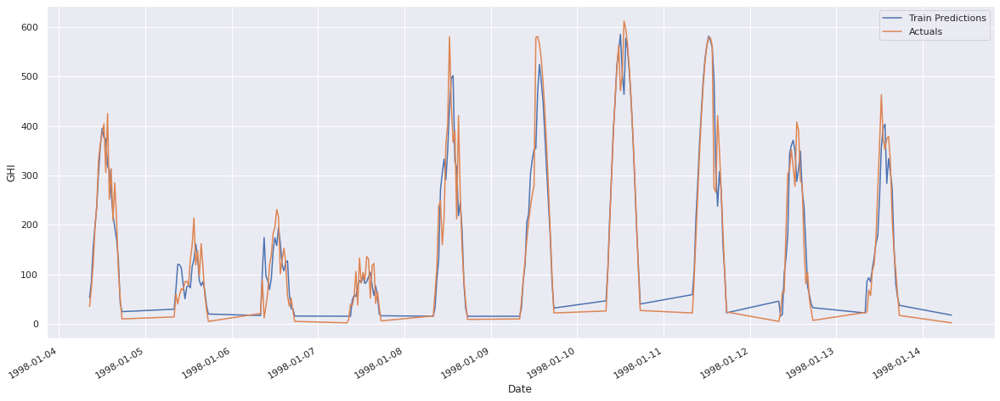

In [ ]:
train_results3['Train Predictions'][:200].plot(figsize=(20,8), label='Train Predictions')
train_results3['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()


In [ ]:
dfval3 = dfval
X_val3 = X_val
val_predictions3 = model3.predict(X_val3)
prediction_copies3 = np.repeat(val_predictions3, dfval3.shape[1], axis=-1)
#val_predictions3 = Scalervl.inverse_transform(prediction_copies3)[:,0]
val_predictions3 = Scaler.inverse_transform(prediction_copies3)[:,0]


y_val3 = y_val
actual_copies3 = np.repeat(y_val3, dfval3.shape[1], axis=-1)
#y_val3 = Scalervl.inverse_transform(actual_copies3)[:,0]
y_val3 = Scaler.inverse_transform(actual_copies3)[:,0]

val_predictions3 = val_predictions3.flatten()
y_val3 = y_val3.flatten()

val_results3 = pd.DataFrame(data={'Val Predictions':val_predictions3, 'Actuals':y_val3, 'Date':valdates[60:]})
val_results3.set_index('Date', inplace = True)
val_results3.head()

282/282 [==============================] - 1s 2ms/step


,Val Predictions,Actuals
Date,,
2019-01-01 08:00:00,19.129732,9.0
2019-01-01 08:30:00,25.406595,31.0
2019-01-01 09:00:00,54.695946,58.0
2019-01-01 09:30:00,100.640450,66.0
2019-01-01 10:00:00,109.255592,69.0


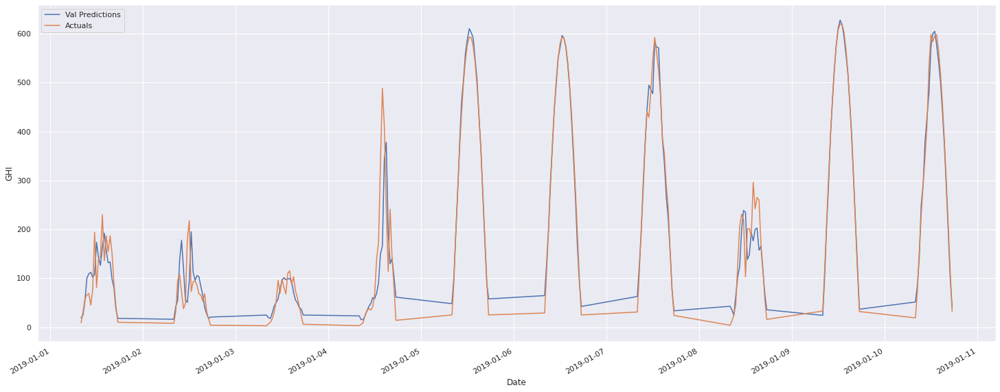

In [ ]:
val_results3['Val Predictions'][:200].plot(figsize=(20,8), label='Val Predictions')
val_results3['Actuals'][:200].plot(figsize=(25,10), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
from sklearn.metrics import r2_score

dftest3 = dftest
X_test3 = X_test
test_predictions3 = model3.predict(X_test3)
prediction_copies3 = np.repeat(test_predictions3, dftest3.shape[1], axis=-1)
#test_predictions3 = Scalerts.inverse_transform(prediction_copies3)[:,0]
test_predictions3 = Scaler.inverse_transform(prediction_copies3)[:,0]


y_test3 = y_test
actual_copies3 = np.repeat(y_test3, dftest3.shape[1], axis=-1)
#y_test3 = Scalerts.inverse_transform(actual_copies3)[:,0]
y_test3 = Scaler.inverse_transform(actual_copies3)[:,0]


y_test3 = y_test3.flatten()

test_results3 = pd.DataFrame(data={'Test Predictions':test_predictions3, 'Actuals':y_test3.flatten(), 'Date':testdates[60:]})
test_results3.set_index('Date', inplace = True)
Rsquared3 =r2_score(y_test3, test_predictions3)
mape3 = tf.keras.metrics.mean_absolute_percentage_error(y_test3, test_predictions3)
mae3 = tf.keras.metrics.mean_absolute_error(y_test3, test_predictions3)

m3 = tf.keras.metrics.RootMeanSquaredError()
m3.update_state(y_test3, test_predictions3)
rmse3 = m3.result().numpy()

#rmse3 =  tf.keras.metrics.RootMeanSquaredError(y_test3, test_predictions3)
mean3 =np.mean(y_test3)
test_results3, print('Rsqrared: ', Rsquared3), print('MAPE: ',mape3), print('MAE: ',mae3), print('RMSE: ',rmse3), print('Mean: ',mean3)

284/284 [==============================] - 1s 2ms/step
Rsqrared:  0.9242048437485935
MAPE:  tf.Tensor(60542320.0, shape=(), dtype=float32)
MAE:  tf.Tensor(48.774406, shape=(), dtype=float32)
RMSE:  77.67898
Mean:  348.3554403001545


(                     Test Predictions  Actuals
 Date                                          
 2020-01-01 08:00:00         77.165825     25.0
 2020-01-01 08:30:00        124.562500     91.0
 2020-01-01 09:00:00        194.054153    181.0
 2020-01-01 09:30:00        286.587494    279.0
 2020-01-01 10:00:00        370.829681    359.0
 ...                               ...      ...
 2020-12-31 15:30:00         93.667114     44.0
 2020-12-31 16:00:00         41.341995     38.0
 2020-12-31 16:30:00         23.230566     27.0
 2020-12-31 17:00:00         24.666691     14.0
 2020-12-31 17:30:00         17.626017      3.0
 
 [9062 rows x 2 columns], None, None, None, None, None)

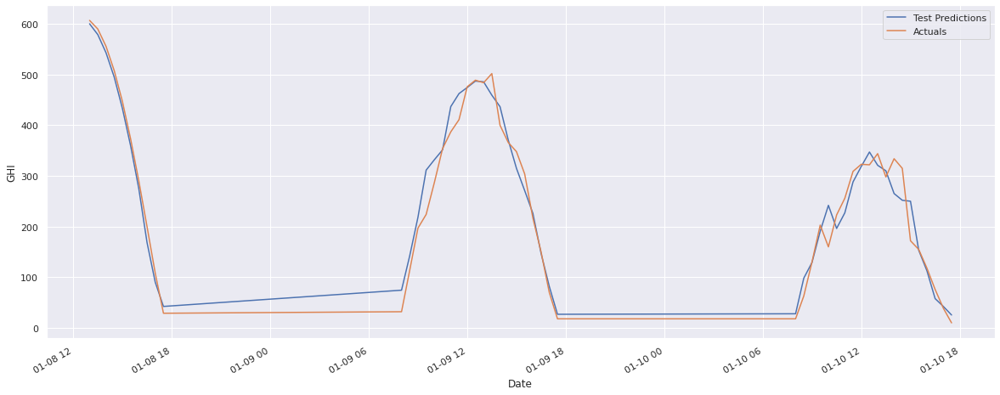

In [ ]:
test_results3['Test Predictions'][150:200].plot(figsize=(20,8), label='Test Predictions')
test_results3['Actuals'][150:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

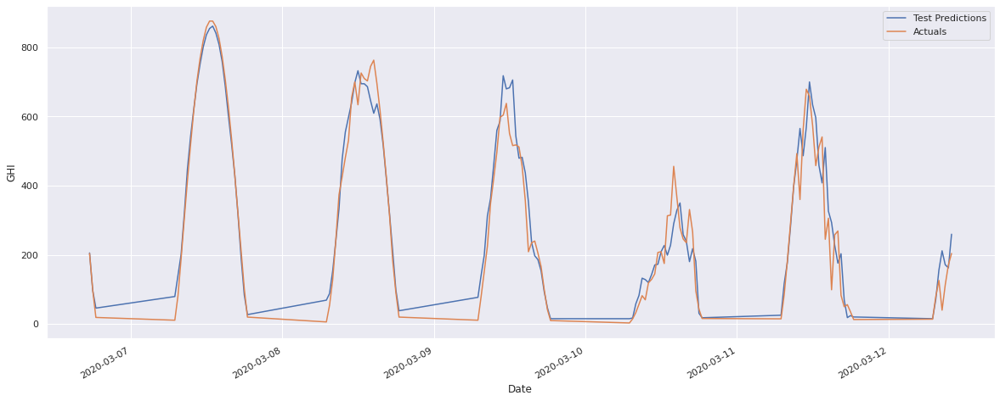

In [ ]:
test_results3['Test Predictions'][1410:1540].plot(figsize=(20,8), label='Test Predictions')
test_results3['Actuals'][1410:1540].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

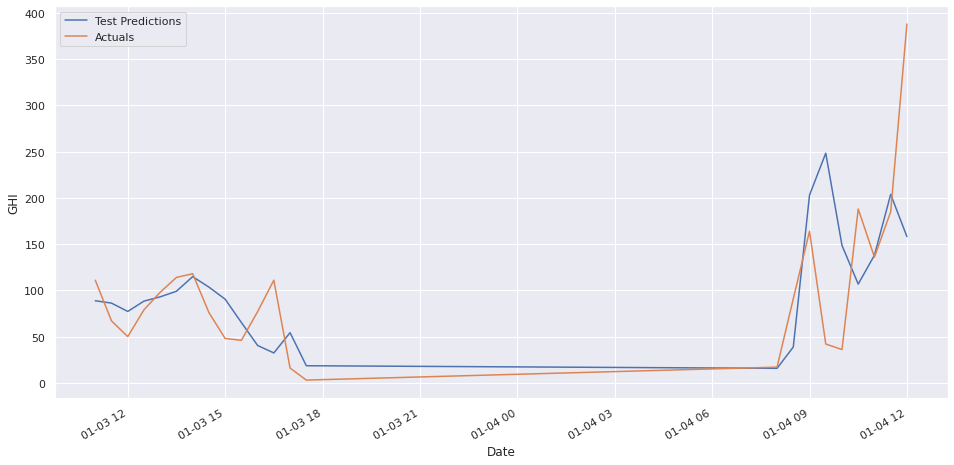

In [ ]:
test_results3['Test Predictions'][46:69].plot(figsize=(16,8), label='Test Predictions')
test_results3['Actuals'][46:69].plot(figsize=(16,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
test_results30 = test_results3
test_results3 = test_results3.reset_index()
test_results3 = test_results3.drop(['Date'], axis = 'columns')

# **Daily Reults CONV**

In [ ]:
testyear3 = pd.concat([testyear,test_results3], axis = 'columns')
testyear3.head()

,Date,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
0,2020-01-01 08:00:00,25,32,87.35,90.41,1.6,0,0,0,0,0,0,0,0,0,0.78125,77.165825,25.0
1,2020-01-01 08:30:00,91,111,82.22,82.43,2.9,0,0,0,0,0,0,0,0,0,0.81982,124.562500,91.0
2,2020-01-01 09:00:00,181,200,77.27,78.43,4.1,0,0,0,0,0,0,0,0,0,0.90500,194.054153,181.0
3,2020-01-01 09:30:00,279,288,72.65,69.20,5.9,0,0,0,0,0,0,0,0,0,0.96875,286.587494,279.0
4,2020-01-01 10:00:00,359,369,68.44,55.88,7.7,0,0,0,0,0,0,0,0,0,0.97290,370.829681,359.0


In [ ]:
testyear3 = testyear3.resample('D',on='Date').sum()

In [ ]:
testyear3.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,6514,7127,1384.89,1178.58,176.6,0,0,0,4,0,2,0,0,0,17.334613,6728.981934,6514.0
2020-01-02,554,6332,1383.49,1878.32,161.5,0,0,0,1,3,13,3,0,0,1.884887,1207.077148,554.0
2020-01-03,1214,6498,1381.99,1974.26,365.4,0,0,2,9,3,1,4,0,0,3.983212,1226.515137,1214.0
2020-01-04,5021,7081,1380.26,1414.50,219.8,0,2,1,7,0,0,0,0,0,13.493359,4991.095215,5021.0
2020-01-05,7332,7332,1378.45,1260.91,135.8,0,0,0,0,0,0,0,0,0,20.000000,7309.570312,7332.0


In [ ]:
#testyear3 = testyear3.dropna()
testyear3 = testyear3.drop("2020-02-29")
testyear3

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,6514,7127,1384.89,1178.58,176.6,0,0,0,4,0,2,0,0,0,17.334613,6728.981934,6514.0
2020-01-02,554,6332,1383.49,1878.32,161.5,0,0,0,1,3,13,3,0,0,1.884887,1207.077148,554.0
2020-01-03,1214,6498,1381.99,1974.26,365.4,0,0,2,9,3,1,4,0,0,3.983212,1226.515137,1214.0
2020-01-04,5021,7081,1380.26,1414.50,219.8,0,2,1,7,0,0,0,0,0,13.493359,4991.095215,5021.0
2020-01-05,7332,7332,1378.45,1260.91,135.8,0,0,0,0,0,0,0,0,0,20.000000,7309.570312,7332.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,7154,7157,1389.59,1239.62,154.9,0,0,0,0,0,0,0,0,0,19.988506,7038.006348,7154.0
2020-12-28,3704,6633,1388.66,1608.23,203.6,0,1,5,5,0,3,0,0,0,12.554911,4413.492188,3704.0
2020-12-29,6645,7023,1387.66,1488.35,223.5,0,0,0,1,0,0,0,0,0,18.935431,6729.226562,6645.0


In [ ]:
testyear3['cluster'] = clusters
testyear3.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals,cluster
Date,,,,,,,,,,,,,,,,,,
2020-01-01,6514,7127,1384.89,1178.58,176.6,0,0,0,4,0,2,0,0,0,17.334613,6728.981934,6514.0,0
2020-01-02,554,6332,1383.49,1878.32,161.5,0,0,0,1,3,13,3,0,0,1.884887,1207.077148,554.0,2
2020-01-03,1214,6498,1381.99,1974.26,365.4,0,0,2,9,3,1,4,0,0,3.983212,1226.515137,1214.0,2
2020-01-04,5021,7081,1380.26,1414.50,219.8,0,2,1,7,0,0,0,0,0,13.493359,4991.095215,5021.0,2
2020-01-05,7332,7332,1378.45,1260.91,135.8,0,0,0,0,0,0,0,0,0,20.000000,7309.570312,7332.0,0


# **Dividing days according to clusters CONV**

In [ ]:
 Fullyear3= testyear3[['Test Predictions',	'Actuals']]

In [ ]:
Fullyeararrap3 =  Fullyear3['Test Predictions'].to_numpy()
Fullyearac3 =  Fullyear3['Actuals'].to_numpy()

In [ ]:
RsquaredFullyear3 =r2_score(Fullyearac3, Fullyeararrap3)
mapeFullyear3 = tf.keras.metrics.mean_absolute_percentage_error(Fullyearac3, Fullyeararrap3)
maeFullyear3 = tf.keras.metrics.mean_absolute_error(Fullyearac3, Fullyeararrap3)

mFullyear3 = tf.keras.metrics.RootMeanSquaredError()
mFullyear3.update_state(Fullyearac3, Fullyeararrap3)
rmseFullyear3 = mFullyear3.result().numpy()
meanFullyear3 =np.mean(Fullyearac3)
print('Rsqrared: ', RsquaredFullyear3), print('MAPE: ',mapeFullyear3), print('MAE: ',maeFullyear3), print('RMSE: ',rmseFullyear3), print('Mean: ',meanFullyear3)



Rsqrared:  0.9781775128549016
MAPE:  tf.Tensor(9.913061, shape=(), dtype=float32)
MAE:  tf.Tensor(489.46854, shape=(), dtype=float32)
RMSE:  649.0947
Mean:  8648.758904109589


(None, None, None, None, None)

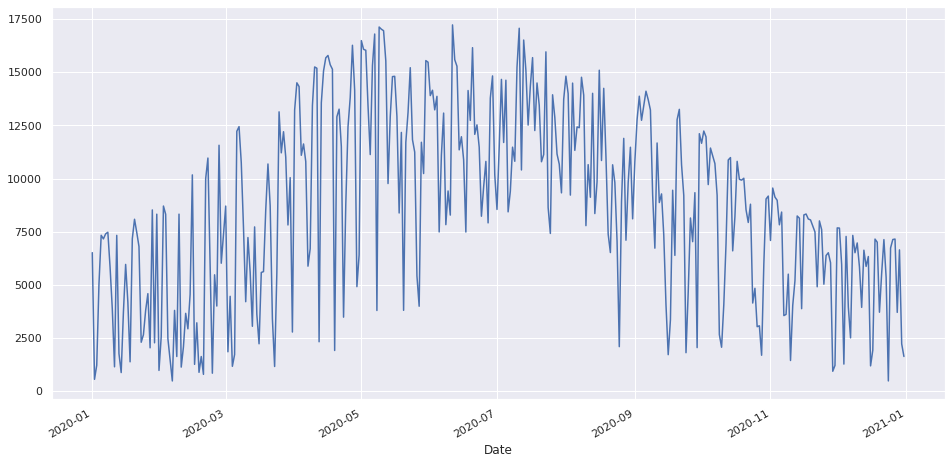

In [ ]:
Fullyear3['Actuals'][:].plot(figsize=(16,8), label='Actuals')

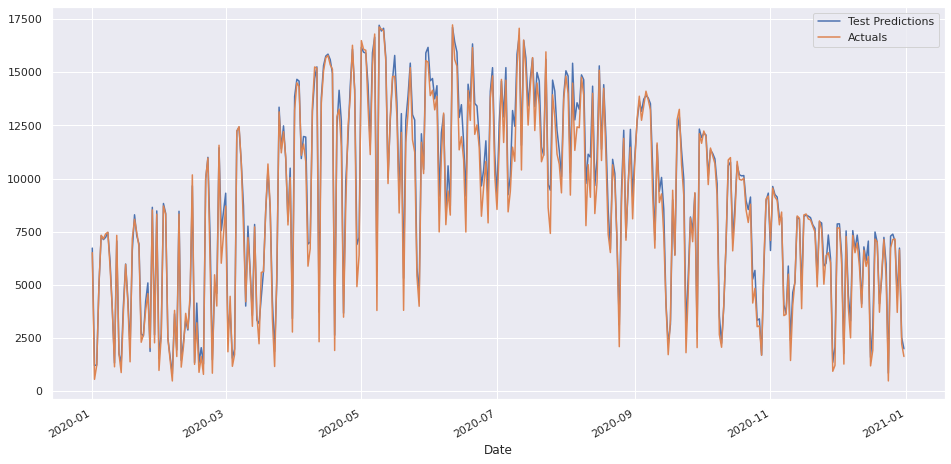

In [ ]:
Fullyear3['Test Predictions'][:].plot(figsize=(16,8), label='Test Predictions')
Fullyear3['Actuals'][:].plot(figsize=(16,8), label='Actuals')
plt.legend()

# Cluster sorting

In [ ]:
sunnydays3 = testyear3[testyear3.cluster == clus]
mixeddays3 = testyear3[testyear3.cluster == clum]
cloudydays3 = testyear3[testyear3.cluster == cluc]

In [ ]:
sunnydays1 = sunnydays1[['Test Predictions',	'Actuals']]
sunnydays1

,Test Predictions,Actuals
Date,,
2020-02-22,11011.281250,10966.0
2020-02-27,11370.709961,11568.0
2020-03-06,11975.571289,12225.0
2020-03-07,12437.291992,12445.0
2020-03-08,10488.367188,10751.0
2020-03-20,10583.022461,10687.0
2020-03-25,12867.068359,13140.0
2020-03-26,10758.875977,11211.0
2020-03-27,11953.946289,12205.0


In [ ]:
sunnyarrap3 = sunnydays3['Test Predictions'].to_numpy()
sunnyac3 = sunnydays3['Actuals'].to_numpy()


In [ ]:
Rsquaredsunny3 =r2_score(sunnyac3, sunnyarrap3)
mapesunny3 = tf.keras.metrics.mean_absolute_percentage_error(sunnyac3, sunnyarrap3)
maesunny3 = tf.keras.metrics.mean_absolute_error(sunnyac3, sunnyarrap3)

msunny3 = tf.keras.metrics.RootMeanSquaredError()
msunny3.update_state(sunnyac3, sunnyarrap3)
rmsesunny3 = msunny3.result().numpy()
meansunny3 =np.mean(sunnyac3)
print('Rsqrared: ', Rsquaredsunny3), print('MAPE: ',mapesunny3), print('MAE: ',maesunny3), print('RMSE: ',rmsesunny3), print('Mean: ',meansunny3)



Rsqrared:  0.8784962241227137
MAPE:  tf.Tensor(3.9635222, shape=(), dtype=float32)
MAE:  tf.Tensor(496.41852, shape=(), dtype=float32)
RMSE:  645.7651
Mean:  13235.535714285714


(None, None, None, None, None)

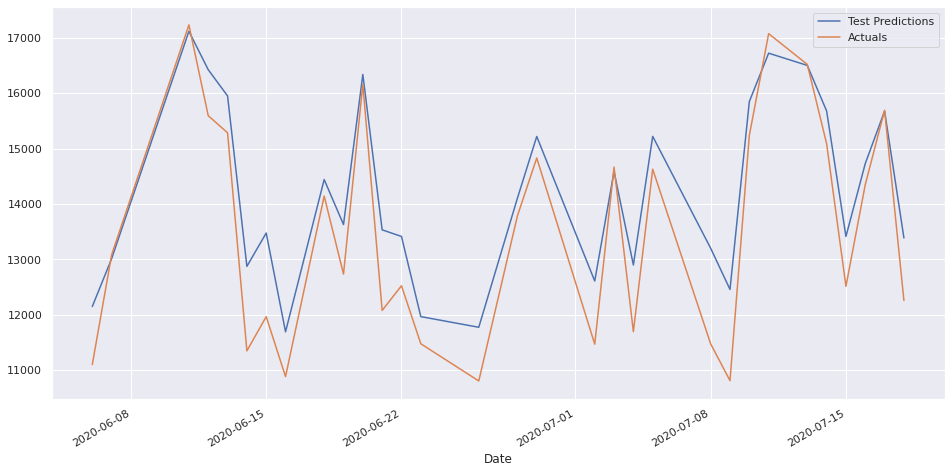

In [ ]:
sunnydays3['Test Predictions'][60:91].plot(figsize=(16,8), label='Test Predictions')
sunnydays3['Actuals'][60:91].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
mixdays3 = mixeddays3[['Test Predictions',	'Actuals']]
mixdays3

,Test Predictions,Actuals
Date,,
2020-01-01,6728.981934,6514.0
2020-01-05,7309.570312,7332.0
2020-01-06,7128.953613,7163.0
2020-01-07,7235.653809,7398.0
2020-01-08,7462.499512,7475.0
2020-01-09,6112.646973,5830.0
2020-01-12,7062.941406,7329.0
2020-01-16,5980.106445,5961.0
2020-01-19,6626.022461,7167.0


In [ ]:
mixarrap3 = mixeddays3['Test Predictions'].to_numpy()
mixac3 = mixeddays3['Actuals'].to_numpy()

In [ ]:
Rsquaredmix3 =r2_score(mixac3, mixarrap3)
mapemix3 = tf.keras.metrics.mean_absolute_percentage_error(mixac3, mixarrap3)
maemix3 = tf.keras.metrics.mean_absolute_error(mixac3, mixarrap3)

mmix3 = tf.keras.metrics.RootMeanSquaredError()
mmix3.update_state(mixac3, mixarrap3)
rmsemix3 = mmix3.result().numpy()
meanmix3 =np.mean(mixac3)
print('Rsqrared: ', Rsquaredmix3), print('MAPE: ',mapemix3), print('MAE: ',maemix3), print('RMSE: ',rmsemix3), print('Mean: ',meanmix3)



Rsqrared:  0.7461905671214613
MAPE:  tf.Tensor(6.2118726, shape=(), dtype=float32)
MAE:  tf.Tensor(475.31702, shape=(), dtype=float32)
RMSE:  661.123
Mean:  7813.713235294118


(None, None, None, None, None)

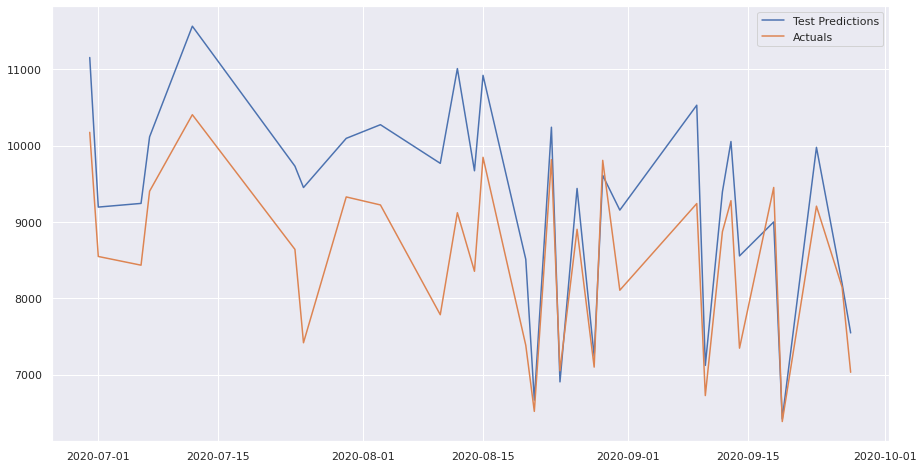

In [ ]:
plt.plot(mixeddays3['Test Predictions'][50:81], label='Test Predictions')
plt.plot(mixeddays3['Actuals'][50:81], label='Actuals')
plt.legend()

In [ ]:
cloudydays3 = cloudydays3[['Test Predictions',	'Actuals']]
cloudydays3

,Test Predictions,Actuals
Date,,
2020-01-02,1207.077148,554.0
2020-01-03,1226.515137,1214.0
2020-01-04,4991.095215,5021.0
2020-01-10,3856.422363,3868.0
2020-01-11,1321.079346,1143.0
2020-01-13,1764.790771,1763.0
2020-01-14,1307.544067,872.0
2020-01-15,4045.100098,3713.0
2020-01-17,4310.765625,4184.0


In [ ]:
cloudyarrap3 = cloudydays3['Test Predictions'].to_numpy()
cloudyac3 = cloudydays3['Actuals'].to_numpy()

In [ ]:
Rsquaredcloudy3 =r2_score(cloudyac3, cloudyarrap3)
mapecloudy3 = tf.keras.metrics.mean_absolute_percentage_error(cloudyac3, cloudyarrap3)
maecloudy3 = tf.keras.metrics.mean_absolute_error(cloudyac3, cloudyarrap3)

mcloudy3 = tf.keras.metrics.RootMeanSquaredError()
mcloudy3.update_state(cloudyac3, cloudyarrap3)
rmsecloudy3 = mcloudy3.result().numpy()
meancloudy3 =np.mean(cloudyac3)
print('Rsqrared: ', Rsquaredcloudy3), print('MAPE: ',mapecloudy3), print('MAE: ',maecloudy3), print('RMSE: ',rmsecloudy3), print('Mean: ',meancloudy3)

Rsqrared:  0.7646170492382944
MAPE:  tf.Tensor(24.927637, shape=(), dtype=float32)
MAE:  tf.Tensor(500.16095, shape=(), dtype=float32)
RMSE:  635.6288
Mean:  2709.629213483146


(None, None, None, None, None)

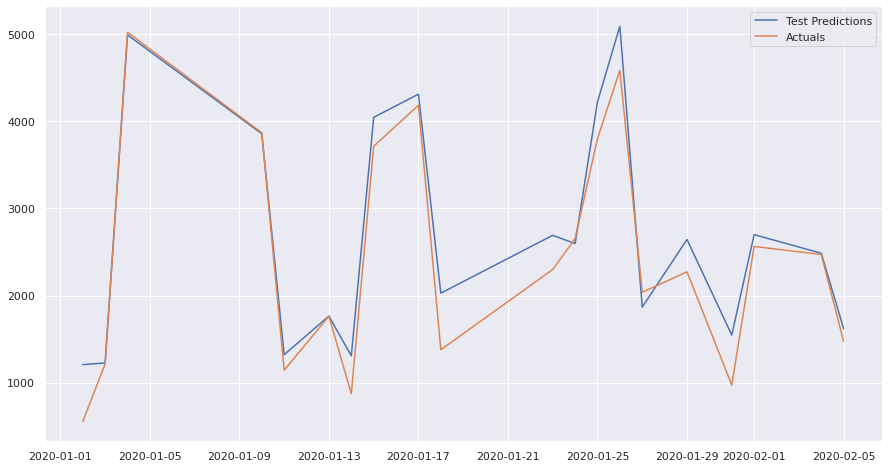

In [ ]:
plt.plot(cloudydays3['Test Predictions'][:20], label='Test Predictions')
plt.plot(cloudydays3['Actuals'][:20], label='Actuals')
plt.legend()

# **RNN**

In [ ]:
from tensorflow.keras.layers import SimpleRNN
model4 = Sequential()
model4.add(SimpleRNN(64, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model4.add(SimpleRNN(32, activation='relu', return_sequences=False))
model4.add(Dropout(0.1))
model4.add(Dense(32))
#model4.add(Dense(16))
#model4.add(Dense(8))
model4.add(Dense(y_train.shape[1]))
cp4 = ModelCheckpoint(filepath = '/content/drive/MyDrive/FYP complete files/RNN2/', monitor = 'val_loss',mode = 'min' , save_best_only=True, verbose = 2)
model4.summary()



Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn (SimpleRNN)      (None, 60, 64)            5120      
                                                                 
 simple_rnn_1 (SimpleRNN)    (None, 32)                3104      
                                                                 
 dropout_3 (Dropout)         (None, 32)                0         
                                                                 
 dense_6 (Dense)             (None, 32)                1056      
                                                                 
 dense_7 (Dense)             (None, 1)                 33        
                                                                 
Total params: 9,313
Trainable params: 9,313
Non-trainable params: 0
_________________________________________________________________


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn (SimpleRNN)      (None, 60, 64)            5120      
                                                                 
 simple_rnn_1 (SimpleRNN)    (None, 32)                3104      
                                                                 
 dropout_3 (Dropout)         (None, 32)                0         
                                                                 
 dense_6 (Dense)             (None, 32)                1056      
                                                                 
 dense_7 (Dense)             (None, 1)                 33        
                                                                 
Total params: 9,313
Trainable params: 9,313
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
45/45 [==============================] - 

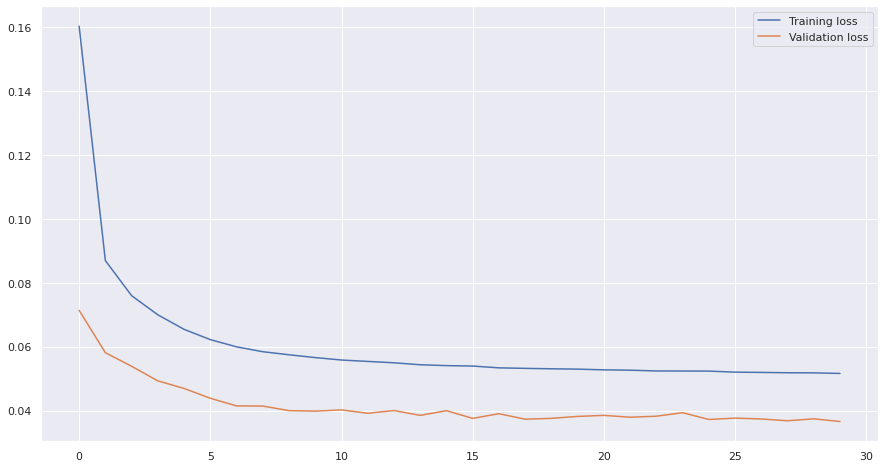

In [ ]:
model4.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0005) , loss='mae', metrics=['mape' , tf.keras.metrics.RootMeanSquaredError()])
model4.summary()
# fit the model
history4 = model4.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=30, batch_size=4096, callbacks=[cp4])
plt.plot(history4.history['loss'], label='Training loss')
plt.plot(history4.history['val_loss'], label='Validation loss')
plt.legend()

# **RNN analysis**

In [ ]:
from tensorflow.keras.models import load_model
model4 = load_model('/content/drive/MyDrive/FYP complete files/RNN2/')

dftrain4 = dftrain
X_train4 = X_train
train_predictions4 = model4.predict(X_train4)
prediction_copies4 = np.repeat(train_predictions4, dftrain4.shape[1], axis=-1)
train_predictions4 = Scaler.inverse_transform(prediction_copies4)[:,0]

y_train4 = y_train
actual_copies4 = np.repeat(y_train4, dftrain4.shape[1], axis=-1)
y_train4 = Scaler.inverse_transform(actual_copies4)[:,0]

train_predictions4 = train_predictions4.flatten()
y_train4 = y_train4.flatten()

train_results4 = pd.DataFrame(data={'Train Predictions':train_predictions4, 'Actuals':y_train4})
train_results4.head()

5693/5693 [==============================] - 33s 6ms/step


,Train Predictions,Actuals
0,63.173660,35.0
1,84.157173,72.0
2,111.004051,119.0
3,150.684525,193.0
4,212.041092,239.0


In [ ]:
train_results4 = pd.DataFrame(data={'Train Predictions':train_predictions4, 'Actuals':y_train4, 'Date':traindates[60:]})
train_results4.set_index('Date', inplace = True)
train_results4.head()

,Train Predictions,Actuals
Date,,
1998-01-04 08:30:00,63.173660,35.0
1998-01-04 09:00:00,84.157173,72.0
1998-01-04 09:30:00,111.004051,119.0
1998-01-04 10:00:00,150.684525,193.0
1998-01-04 10:30:00,212.041092,239.0


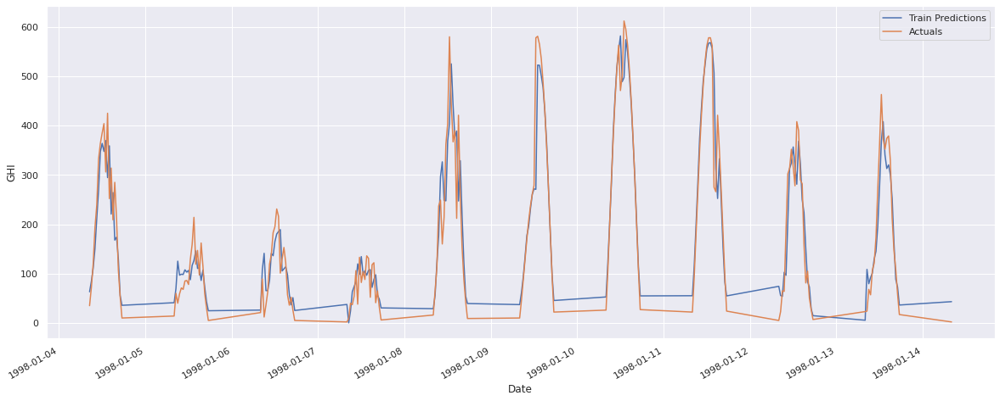

In [ ]:
train_results4['Train Predictions'][:200].plot(figsize=(20,8), label='Train Predictions')
train_results4['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()


In [ ]:
dfval4 = dfval
X_val4 = X_val
val_predictions4 = model4.predict(X_val4)
prediction_copies4 = np.repeat(val_predictions4, dfval4.shape[1], axis=-1)
#val_predictions4 = Scalervl.inverse_transform(prediction_copies4)[:,0]
val_predictions4 = Scaler.inverse_transform(prediction_copies4)[:,0]


y_val4 = y_val
actual_copies4 = np.repeat(y_val4, dfval4.shape[1], axis=-1)
#y_val4 = Scalervl.inverse_transform(actual_copies4)[:,0]
y_val4 = Scaler.inverse_transform(actual_copies4)[:,0]

val_predictions4 = val_predictions4.flatten()
y_val4 = y_val4.flatten()

val_results4 = pd.DataFrame(data={'Val Predictions':val_predictions4, 'Actuals':y_val4, 'Date':valdates[60:]})
val_results4.set_index('Date', inplace = True)
val_results4.head()

282/282 [==============================] - 2s 6ms/step


,Val Predictions,Actuals
Date,,
2019-01-01 08:00:00,22.758522,9.0
2019-01-01 08:30:00,33.203594,31.0
2019-01-01 09:00:00,75.018059,58.0
2019-01-01 09:30:00,104.833046,66.0
2019-01-01 10:00:00,116.199806,69.0


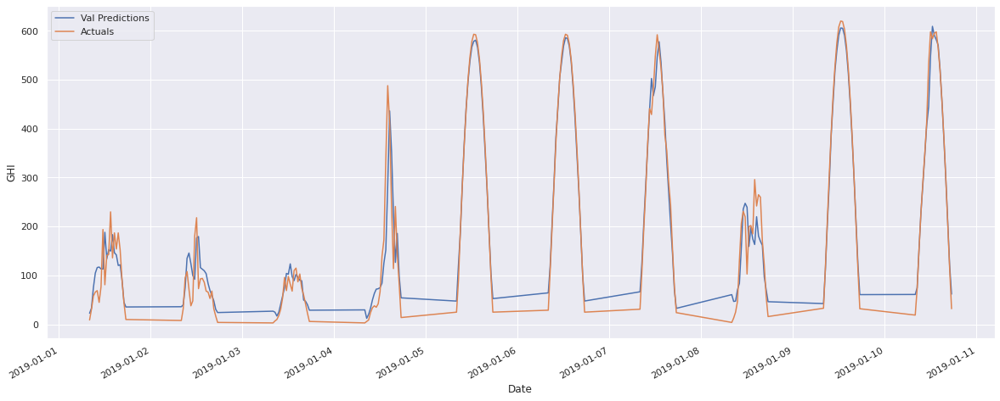

In [ ]:
val_results4['Val Predictions'][:200].plot(figsize=(20,8), label='Val Predictions')
val_results4['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
from sklearn.metrics import r2_score

dftest4 = dftest
X_test4 = X_test
test_predictions4 = model4.predict(X_test4)
prediction_copies4 = np.repeat(test_predictions4, dftest4.shape[1], axis=-1)
#test_predictions4 = Scalerts.inverse_transform(prediction_copies4)[:,0]
test_predictions4 = Scaler.inverse_transform(prediction_copies4)[:,0]


y_test4 = y_test
actual_copies4 = np.repeat(y_test4, dftest4.shape[1], axis=-1)
#y_test4 = Scalerts.inverse_transform(actual_copies4)[:,0]
y_test4 = Scaler.inverse_transform(actual_copies4)[:,0]


y_test4 = y_test4.flatten()

test_results4 = pd.DataFrame(data={'Test Predictions':test_predictions4, 'Actuals':y_test4.flatten(), 'Date':testdates[60:]})
test_results4.set_index('Date', inplace = True)
Rsquared4 =r2_score(y_test4, test_predictions4)
mape4 = tf.keras.metrics.mean_absolute_percentage_error(y_test4, test_predictions4)
mae4 = tf.keras.metrics.mean_absolute_error(y_test4, test_predictions4)

m4 = tf.keras.metrics.RootMeanSquaredError()
m4.update_state(y_test4, test_predictions4)
rmse4 = m4.result().numpy()

#rmse4 =  tf.keras.metrics.RootMeanSquaredError(y_test4, test_predictions4)
mean4 =np.mean(y_test4)
test_results4, print('Rsqrared: ', Rsquared4), print('MAPE: ',mape4), print('MAE: ',mae4), print('RMSE: ',rmse4), print('Mean: ',mean4)

284/284 [==============================] - 2s 6ms/step
Rsqrared:  0.9422750556804402
MAPE:  tf.Tensor(66724230.0, shape=(), dtype=float32)
MAE:  tf.Tensor(41.733, shape=(), dtype=float32)
RMSE:  67.789825
Mean:  348.3554403001545


(                     Test Predictions  Actuals
 Date                                          
 2020-01-01 08:00:00         76.807953     25.0
 2020-01-01 08:30:00        122.343796     91.0
 2020-01-01 09:00:00        196.127151    181.0
 2020-01-01 09:30:00        272.289734    279.0
 2020-01-01 10:00:00        369.590393    359.0
 ...                               ...      ...
 2020-12-31 15:30:00         66.109657     44.0
 2020-12-31 16:00:00         54.924492     38.0
 2020-12-31 16:30:00         29.847736     27.0
 2020-12-31 17:00:00         16.063910     14.0
 2020-12-31 17:30:00         -4.169806      3.0
 
 [9062 rows x 2 columns], None, None, None, None, None)

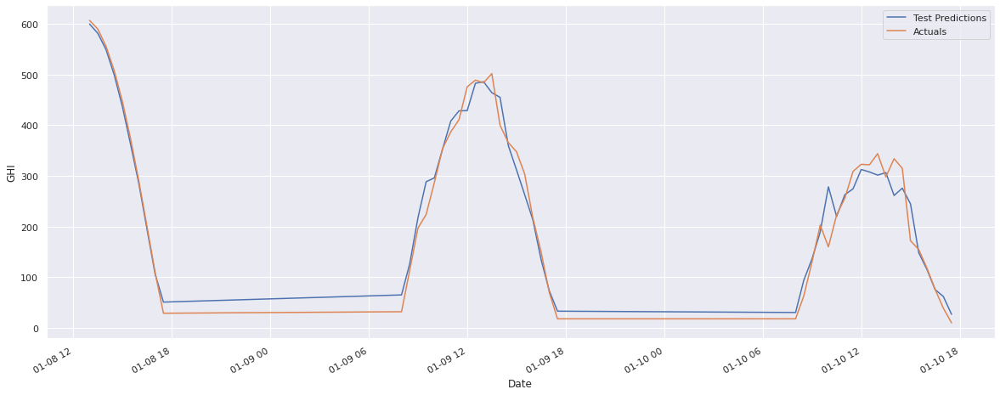

In [ ]:
test_results4['Test Predictions'][150:200].plot(figsize=(20,8), label='Test Predictions')
test_results4['Actuals'][150:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

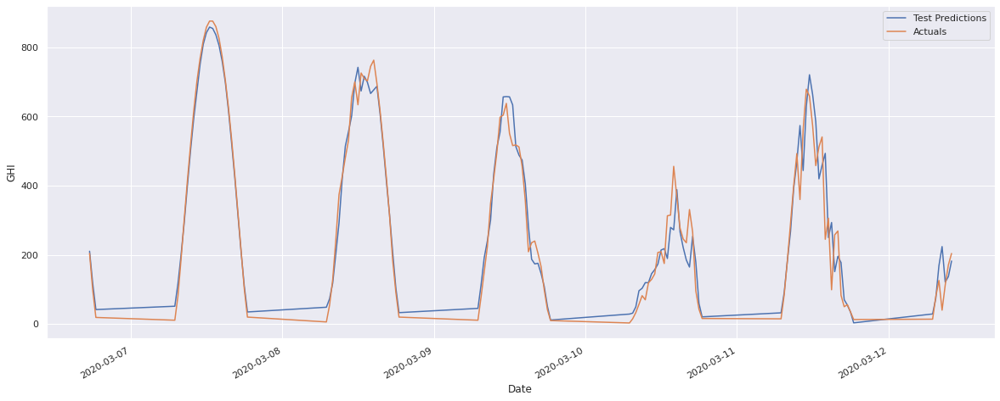

In [ ]:
test_results4['Test Predictions'][1410:1540].plot(figsize=(20,8), label='Test Predictions')
test_results4['Actuals'][1410:1540].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

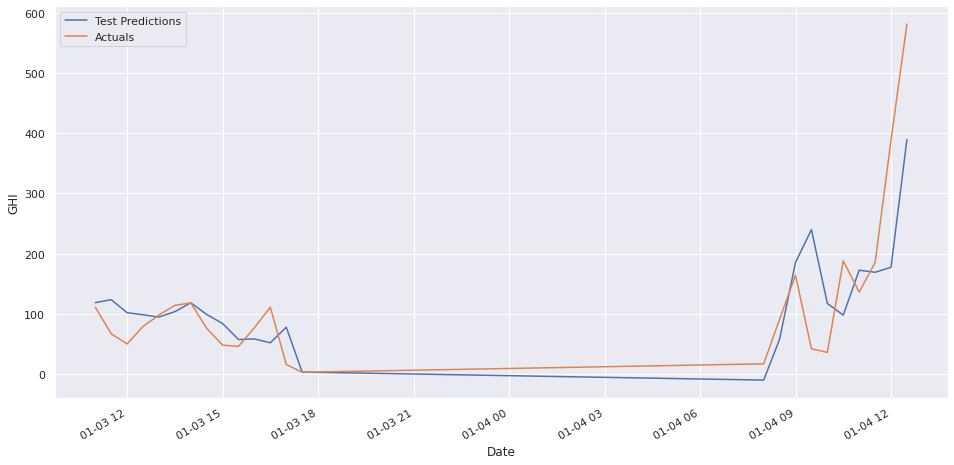

In [ ]:
test_results4['Test Predictions'][46:70].plot(figsize=(16,8), label='Test Predictions')
test_results4['Actuals'][46:70].plot(figsize=(16,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
test_results40 = test_results4 
test_results4 = test_results4.reset_index()
test_results4 = test_results4.drop(['Date'], axis = 'columns')

# **Daily Reults RNN**

In [ ]:
testyear4 = pd.concat([testyear,test_results4], axis = 'columns')
testyear4.head()

,Date,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
0,2020-01-01 08:00:00,25,32,87.35,90.41,1.6,0,0,0,0,0,0,0,0,0,0.78125,76.807953,25.0
1,2020-01-01 08:30:00,91,111,82.22,82.43,2.9,0,0,0,0,0,0,0,0,0,0.81982,122.343796,91.0
2,2020-01-01 09:00:00,181,200,77.27,78.43,4.1,0,0,0,0,0,0,0,0,0,0.90500,196.127151,181.0
3,2020-01-01 09:30:00,279,288,72.65,69.20,5.9,0,0,0,0,0,0,0,0,0,0.96875,272.289734,279.0
4,2020-01-01 10:00:00,359,369,68.44,55.88,7.7,0,0,0,0,0,0,0,0,0,0.97290,369.590393,359.0


In [ ]:
testyear4 = testyear4.resample('D',on='Date').sum()

In [ ]:
testyear1.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals,cluster
Date,,,,,,,,,,,,,,,,,,
2020-01-01,6514,7127,1384.89,1178.58,176.6,0,0,0,4,0,2,0,0,0,17.334613,6622.289551,6514.0,0
2020-01-02,554,6332,1383.49,1878.32,161.5,0,0,0,1,3,13,3,0,0,1.884887,1028.255737,554.0,2
2020-01-03,1214,6498,1381.99,1974.26,365.4,0,0,2,9,3,1,4,0,0,3.983212,1156.815063,1214.0,2
2020-01-04,5021,7081,1380.26,1414.50,219.8,0,2,1,7,0,0,0,0,0,13.493359,4841.107910,5021.0,2
2020-01-05,7332,7332,1378.45,1260.91,135.8,0,0,0,0,0,0,0,0,0,20.000000,7368.443359,7332.0,0


In [ ]:
#testyear4 = testyear4.dropna()
testyear4 = testyear4.drop("2020-02-29")
testyear4

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,6514,7127,1384.89,1178.58,176.6,0,0,0,4,0,2,0,0,0,17.334613,6717.900391,6514.0
2020-01-02,554,6332,1383.49,1878.32,161.5,0,0,0,1,3,13,3,0,0,1.884887,945.468323,554.0
2020-01-03,1214,6498,1381.99,1974.26,365.4,0,0,2,9,3,1,4,0,0,3.983212,1418.876343,1214.0
2020-01-04,5021,7081,1380.26,1414.50,219.8,0,2,1,7,0,0,0,0,0,13.493359,4996.867676,5021.0
2020-01-05,7332,7332,1378.45,1260.91,135.8,0,0,0,0,0,0,0,0,0,20.000000,7376.291992,7332.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,7154,7157,1389.59,1239.62,154.9,0,0,0,0,0,0,0,0,0,19.988506,7212.962402,7154.0
2020-12-28,3704,6633,1388.66,1608.23,203.6,0,1,5,5,0,3,0,0,0,12.554911,4162.226074,3704.0
2020-12-29,6645,7023,1387.66,1488.35,223.5,0,0,0,1,0,0,0,0,0,18.935431,6747.999512,6645.0


In [ ]:
testyear4['cluster'] = clusters
testyear4.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals,cluster
Date,,,,,,,,,,,,,,,,,,
2020-01-01,6514,7127,1384.89,1178.58,176.6,0,0,0,4,0,2,0,0,0,17.334613,6717.900391,6514.0,0
2020-01-02,554,6332,1383.49,1878.32,161.5,0,0,0,1,3,13,3,0,0,1.884887,945.468323,554.0,2
2020-01-03,1214,6498,1381.99,1974.26,365.4,0,0,2,9,3,1,4,0,0,3.983212,1418.876343,1214.0,2
2020-01-04,5021,7081,1380.26,1414.50,219.8,0,2,1,7,0,0,0,0,0,13.493359,4996.867676,5021.0,2
2020-01-05,7332,7332,1378.45,1260.91,135.8,0,0,0,0,0,0,0,0,0,20.000000,7376.291992,7332.0,0


# **Dividing days according to clusters RNN**

In [ ]:
 Fullyear4= testyear4[['Test Predictions',	'Actuals']]

In [ ]:
Fullyeararrap4 =  Fullyear4['Test Predictions'].to_numpy()
Fullyearac4 =  Fullyear4['Actuals'].to_numpy()

In [ ]:
RsquaredFullyear4 =r2_score(Fullyearac4, Fullyeararrap4)
mapeFullyear4 = tf.keras.metrics.mean_absolute_percentage_error(Fullyearac4, Fullyeararrap4)
maeFullyear4 = tf.keras.metrics.mean_absolute_error(Fullyearac4, Fullyeararrap4)

mFullyear4 = tf.keras.metrics.RootMeanSquaredError()
mFullyear4.update_state(Fullyearac4, Fullyeararrap4)
rmseFullyear4 = mFullyear4.result().numpy()
meanFullyear4 =np.mean(Fullyearac4)
print('Rsqrared: ', RsquaredFullyear4), print('MAPE: ',mapeFullyear4), print('MAE: ',maeFullyear4), print('RMSE: ',rmseFullyear4), print('Mean: ',meanFullyear4)



Rsqrared:  0.9888978897004465
MAPE:  tf.Tensor(8.216752, shape=(), dtype=float32)
MAE:  tf.Tensor(353.07162, shape=(), dtype=float32)
RMSE:  462.9763
Mean:  8648.758904109589


(None, None, None, None, None)

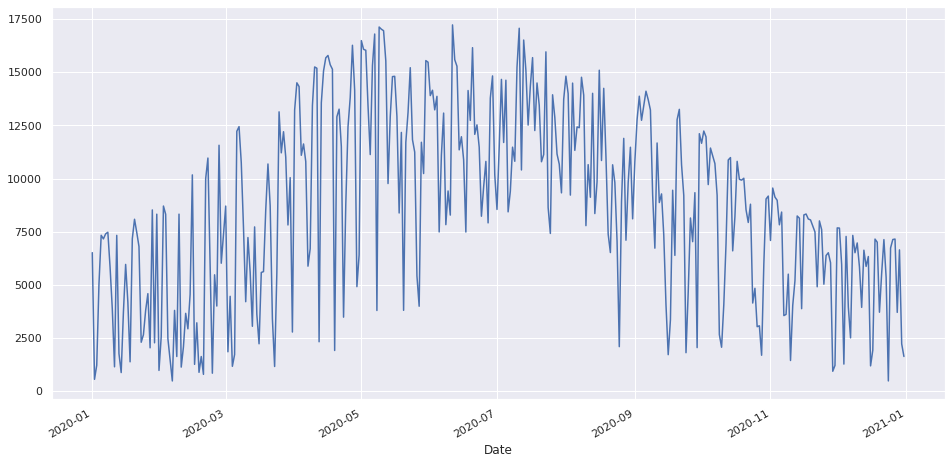

In [ ]:
Fullyear4['Actuals'][:].plot(figsize=(16,8), label='Actuals')

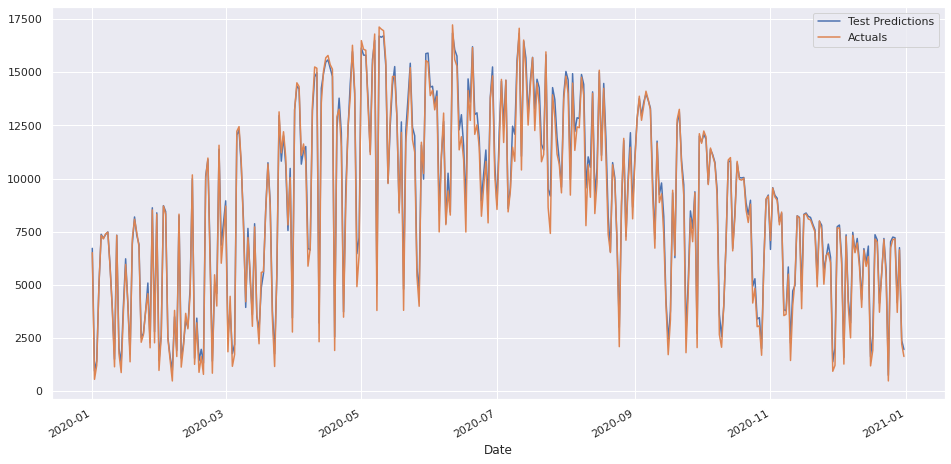

In [ ]:
Fullyear4['Test Predictions'][:].plot(figsize=(16,8), label='Test Predictions')
Fullyear4['Actuals'][:].plot(figsize=(16,8), label='Actuals')
plt.legend()

# Cluster sorting

In [ ]:
sunnydays4 = testyear4[testyear4.cluster == clus]
mixeddays4 = testyear4[testyear4.cluster == clum]
cloudydays4 = testyear4[testyear4.cluster == cluc]

In [ ]:
sunnydays4 = sunnydays4[['Test Predictions',	'Actuals']]
sunnydays4

,Test Predictions,Actuals
Date,,
2020-02-22,10903.523438,10966.0
2020-02-27,11378.967773,11568.0
2020-03-06,12043.443359,12225.0
2020-03-07,12286.793945,12445.0
2020-03-08,10584.314453,10751.0
2020-03-20,10745.516602,10687.0
2020-03-25,12959.978516,13140.0
2020-03-26,10819.094727,11211.0
2020-03-27,12011.246094,12205.0


In [ ]:
sunnyarrap4 = sunnydays4['Test Predictions'].to_numpy()
sunnyac4 = sunnydays4['Actuals'].to_numpy()


In [ ]:
Rsquaredsunny4 =r2_score(sunnyac4, sunnyarrap4)
mapesunny4 = tf.keras.metrics.mean_absolute_percentage_error(sunnyac4, sunnyarrap4)
maesunny4 = tf.keras.metrics.mean_absolute_error(sunnyac4, sunnyarrap4)

msunny4 = tf.keras.metrics.RootMeanSquaredError()
msunny4.update_state(sunnyac4, sunnyarrap4)
rmsesunny4 = msunny4.result().numpy()
meansunny4 =np.mean(sunnyac4)
print('Rsqrared: ', Rsquaredsunny4), print('MAPE: ',mapesunny4), print('MAE: ',maesunny4), print('RMSE: ',rmsesunny4), print('Mean: ',meansunny4)



Rsqrared:  0.944614182414838
MAPE:  tf.Tensor(2.7109213, shape=(), dtype=float32)
MAE:  tf.Tensor(344.52136, shape=(), dtype=float32)
RMSE:  435.99246
Mean:  13235.535714285714


(None, None, None, None, None)

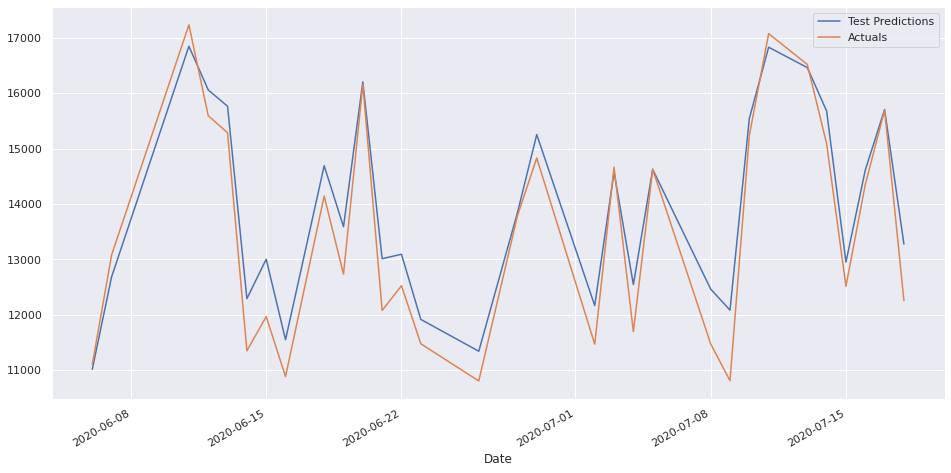

In [ ]:
sunnydays4['Test Predictions'][60:91].plot(figsize=(16,8), label='Test Predictions')
sunnydays4['Actuals'][60:91].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
mixdays4 = mixeddays4[['Test Predictions',	'Actuals']]
mixdays4

,Test Predictions,Actuals
Date,,
2020-01-01,6717.900391,6514.0
2020-01-05,7376.291992,7332.0
2020-01-06,7192.943359,7163.0
2020-01-07,7370.295898,7398.0
2020-01-08,7487.644043,7475.0
2020-01-09,5891.909668,5830.0
2020-01-12,7336.011719,7329.0
2020-01-16,6224.802246,5961.0
2020-01-19,6906.523438,7167.0


In [ ]:
mixarrap4 = mixeddays4['Test Predictions'].to_numpy()
mixac4 = mixeddays4['Actuals'].to_numpy()

In [ ]:
Rsquaredmix4 =r2_score(mixac4, mixarrap4)
mapemix4 = tf.keras.metrics.mean_absolute_percentage_error(mixac4, mixarrap4)
maemix4 = tf.keras.metrics.mean_absolute_error(mixac4, mixarrap4)

mmix4 = tf.keras.metrics.RootMeanSquaredError()
mmix4.update_state(mixac4, mixarrap4)
rmsemix4 = mmix4.result().numpy()
meanmix4 =np.mean(mixac4)
print('Rsqrared: ', Rsquaredmix4), print('MAPE: ',mapemix4), print('MAE: ',maemix4), print('RMSE: ',rmsemix4), print('Mean: ',meanmix4)



Rsqrared:  0.8849178201100627
MAPE:  tf.Tensor(3.9562955, shape=(), dtype=float32)
MAE:  tf.Tensor(299.6395, shape=(), dtype=float32)
RMSE:  445.17667
Mean:  7813.713235294118


(None, None, None, None, None)

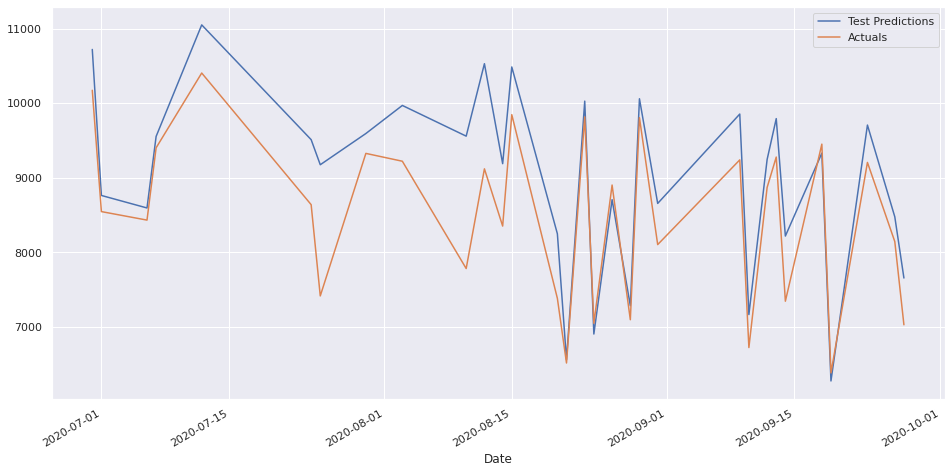

In [ ]:
mixeddays4['Test Predictions'][50:81].plot(figsize=(16,8), label='Test Predictions')
mixeddays4['Actuals'][50:81].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
cloudydays4 = cloudydays4[['Test Predictions',	'Actuals']]
cloudydays4

,Test Predictions,Actuals
Date,,
2020-01-02,945.468323,554.0
2020-01-03,1418.876343,1214.0
2020-01-04,4996.867676,5021.0
2020-01-10,3926.016602,3868.0
2020-01-11,1496.510864,1143.0
2020-01-13,2002.705444,1763.0
2020-01-14,1342.984009,872.0
2020-01-15,4036.995361,3713.0
2020-01-17,4079.350098,4184.0


In [ ]:
cloudyarrap4 = cloudydays4['Test Predictions'].to_numpy()
cloudyac4 = cloudydays4['Actuals'].to_numpy()

In [ ]:
Rsquaredcloudy4 =r2_score(cloudyac4, cloudyarrap4)
mapecloudy4 = tf.keras.metrics.mean_absolute_percentage_error(cloudyac4, cloudyarrap4)
maecloudy4 = tf.keras.metrics.mean_absolute_error(cloudyac4, cloudyarrap4)

mcloudy4 = tf.keras.metrics.RootMeanSquaredError()
mcloudy4.update_state(cloudyac4, cloudyarrap4)
rmsecloudy4 = mcloudy4.result().numpy()
meancloudy4 =np.mean(cloudyac4)
print('Rsqrared: ', Rsquaredcloudy4), print('MAPE: ',mapecloudy4), print('MAE: ',maecloudy4), print('RMSE: ',rmsecloudy4), print('Mean: ',meancloudy4)

Rsqrared:  0.8385005750526361
MAPE:  tf.Tensor(23.387972, shape=(), dtype=float32)
MAE:  tf.Tensor(448.17056, shape=(), dtype=float32)
RMSE:  526.50385
Mean:  2709.629213483146


(None, None, None, None, None)

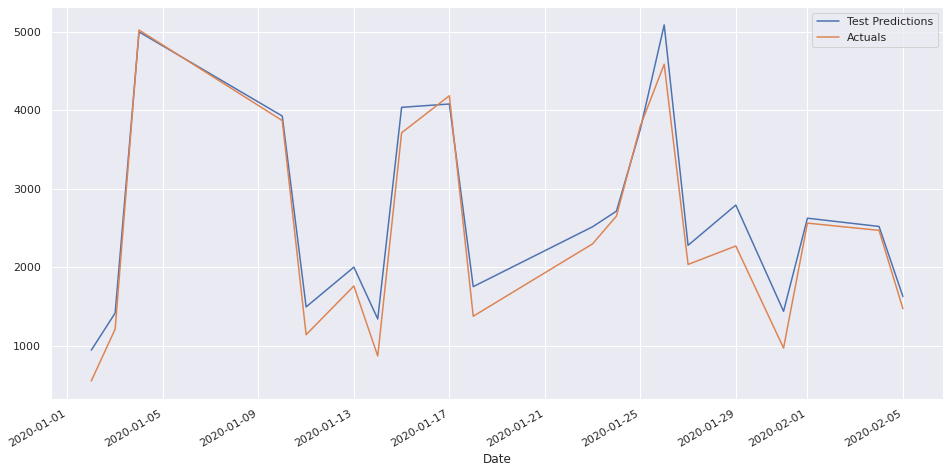

In [ ]:
cloudydays4['Test Predictions'][:20].plot(figsize=(16,8), label='Test Predictions')
cloudydays4['Actuals'][:20].plot(figsize=(16,8), label='Actuals')
plt.legend()

# **COMPARISON**

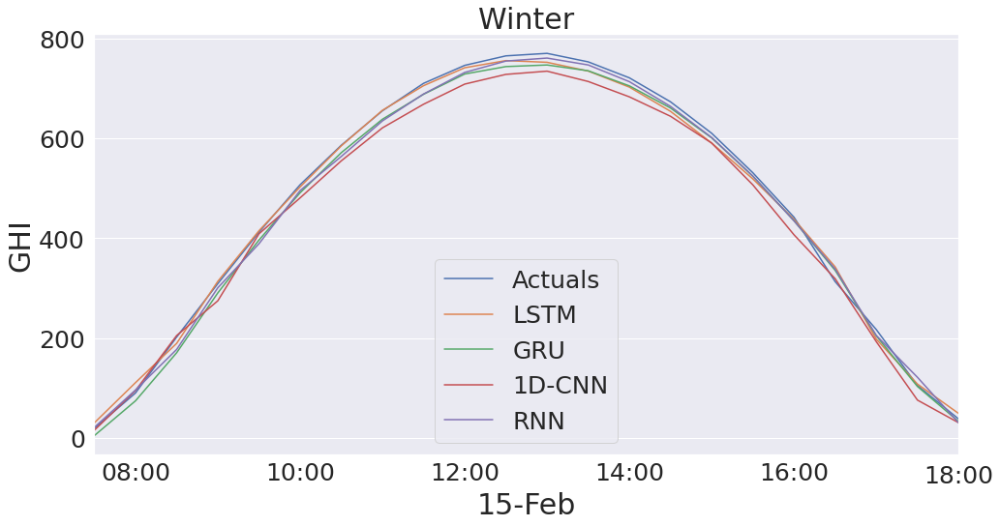

In [ ]:
test_results10['Actuals'][947:969].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][947:969].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][947:969].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][947:969].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][947:969].plot(figsize=(16,8), label='RNN')
plt.title('Winter')
plt.xlabel('15-Feb')
plt.ylabel('GHI')
plt.legend()

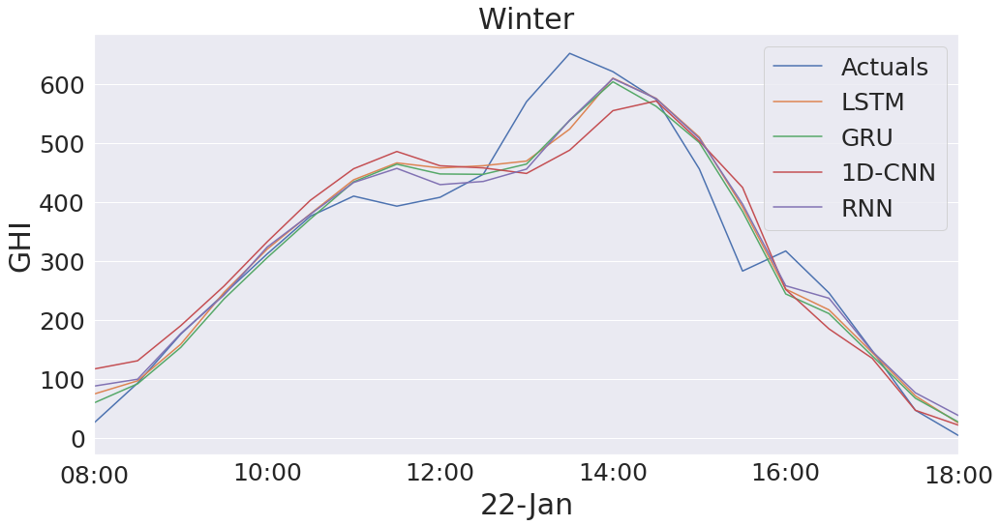

In [ ]:
test_results10['Actuals'][425:446].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][425:446].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][425:446].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][425:446].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][425:446].plot(figsize=(16,8), label='RNN')
plt.title('Winter')
plt.xlabel('22-Jan')
plt.ylabel('GHI')
plt.legend()

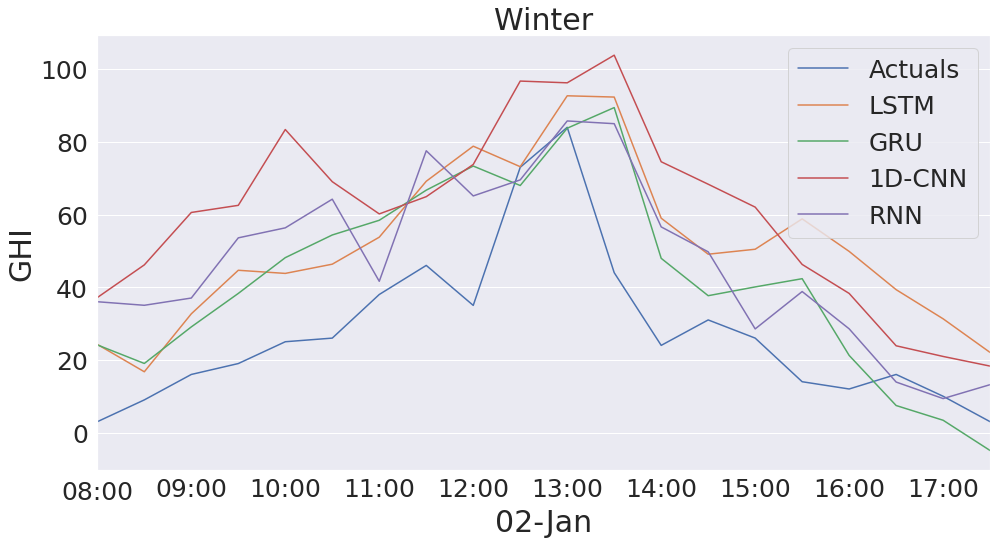

In [ ]:
test_results10['Actuals'][20:40].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][20:40].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][20:40].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][20:40].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][20:40].plot(figsize=(16,8), label='RNN')
plt.title('Winter')
plt.xlabel('02-Jan')
plt.ylabel('GHI')
plt.legend()

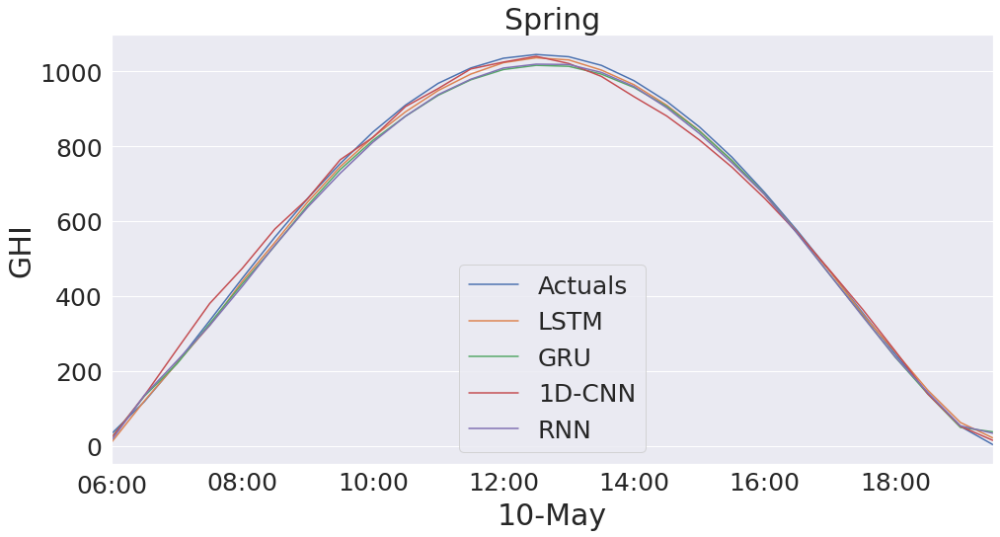

In [ ]:
test_results10['Actuals'][3078:3106].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][3078:3106].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][3078:3106].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][3078:3106].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][3078:3106].plot(figsize=(16,8), label='RNN')
plt.title('Spring')
plt.xlabel('10-May')
plt.ylabel('GHI')
plt.legend()

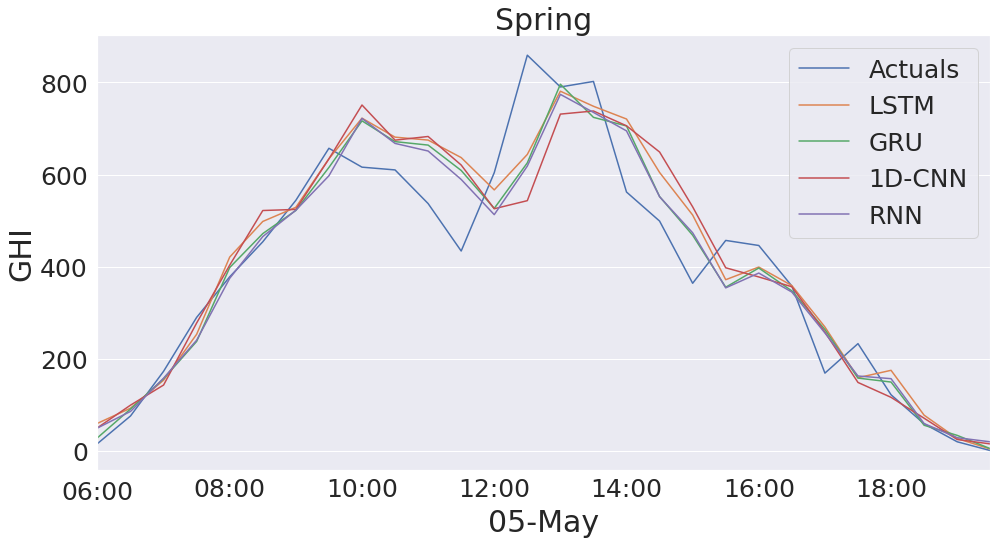

In [ ]:
test_results10['Actuals'][2938:2966].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][2938:2966].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][2938:2966].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][2938:2966].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][2938:2966].plot(figsize=(16,8), label='RNN')
plt.title('Spring')
plt.xlabel('05-May')
plt.ylabel('GHI')
plt.legend()

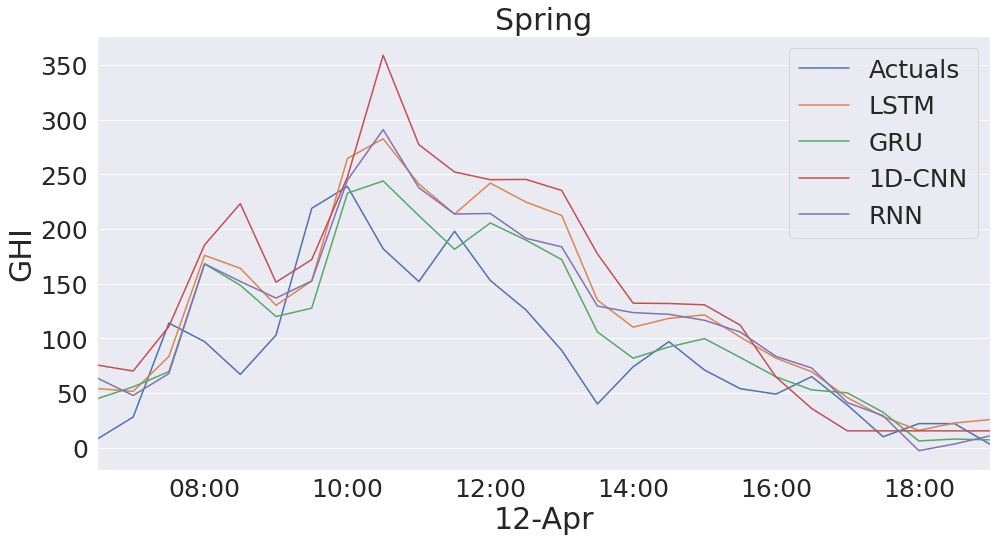

In [ ]:
test_results10['Actuals'][2317:2343].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][2317:2343].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][2317:2343].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][2317:2343].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][2317:2343].plot(figsize=(16,8), label='RNN')
plt.title('Spring')
plt.xlabel('12-Apr')
plt.ylabel('GHI')
plt.legend()

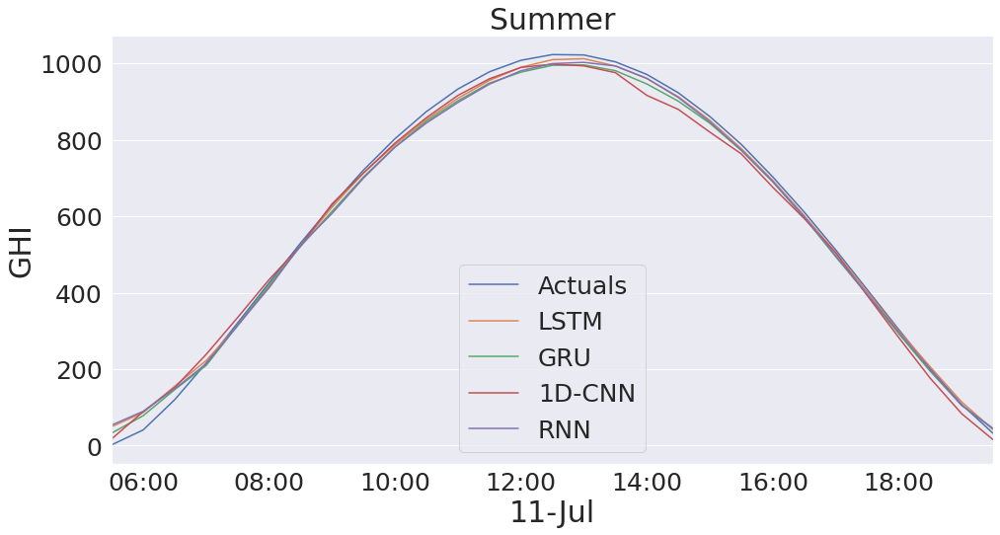

In [ ]:
test_results10['Actuals'][4872:4901].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][4872:4901].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][4872:4901].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][4872:4901].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][4872:4901].plot(figsize=(16,8), label='RNN')
plt.title('Summer')
plt.xlabel('11-Jul')
plt.ylabel('GHI')
plt.legend()

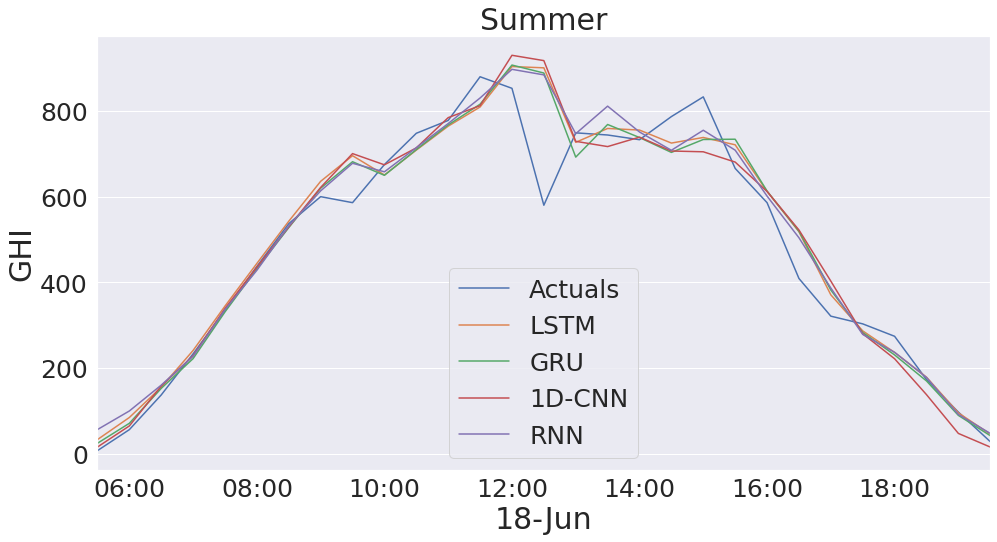

In [ ]:
test_results10['Actuals'][4205:4234].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][4205:4234].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][4205:4234].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][4205:4234].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][4205:4234].plot(figsize=(16,8), label='RNN')
plt.title('Summer')
plt.xlabel('18-Jun')
plt.ylabel('GHI')
plt.legend()

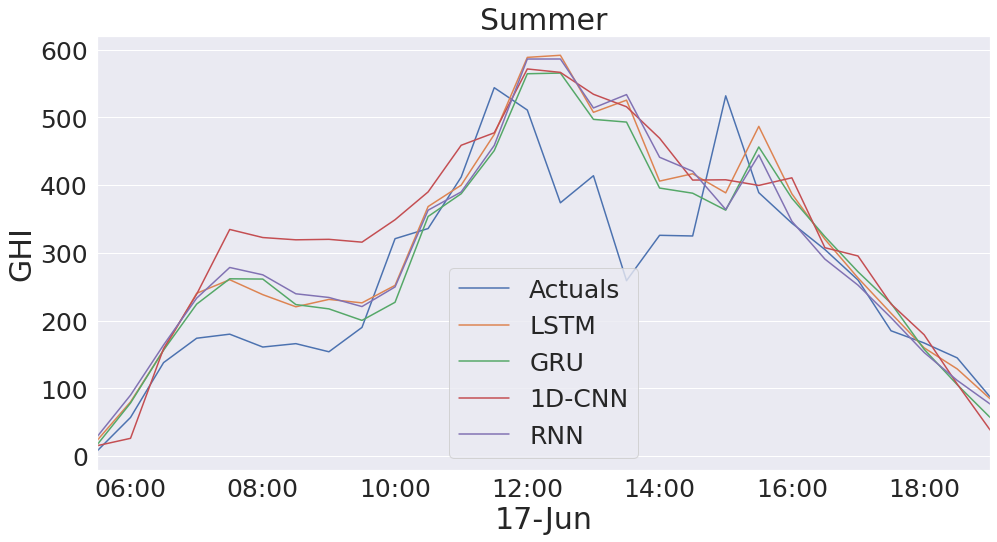

In [ ]:
test_results10['Actuals'][4176:4204].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][4176:4204].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][4176:4204].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][4176:4204].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][4176:4204].plot(figsize=(16,8), label='RNN')
plt.title('Summer')
plt.xlabel('17-Jun')
plt.ylabel('GHI')
plt.legend()

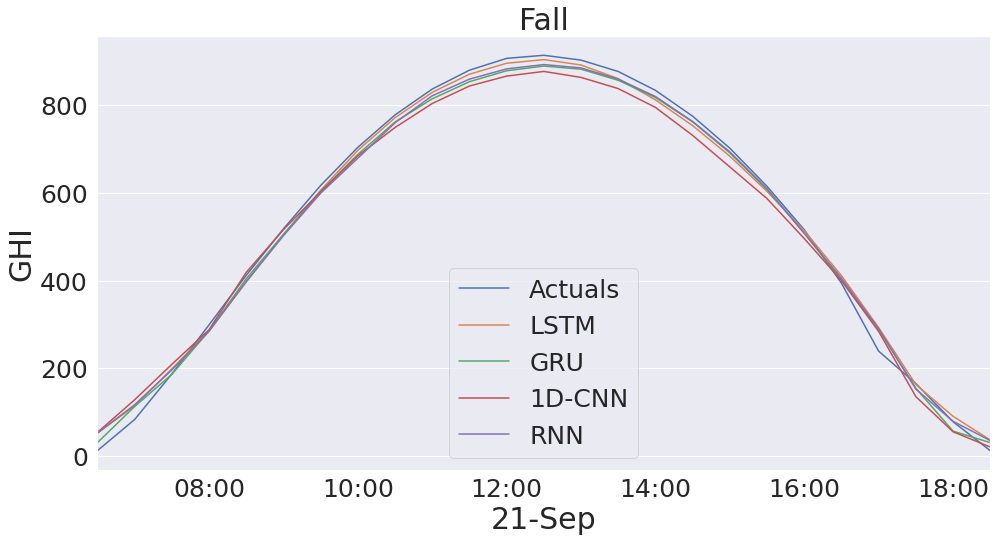

In [ ]:
test_results10['Actuals'][6818:6843].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][6818:6843].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][6818:6843].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][6818:6843].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][6818:6843].plot(figsize=(16,8), label='RNN')
plt.title('Fall')
plt.xlabel('21-Sep')
plt.ylabel('GHI')
plt.legend()

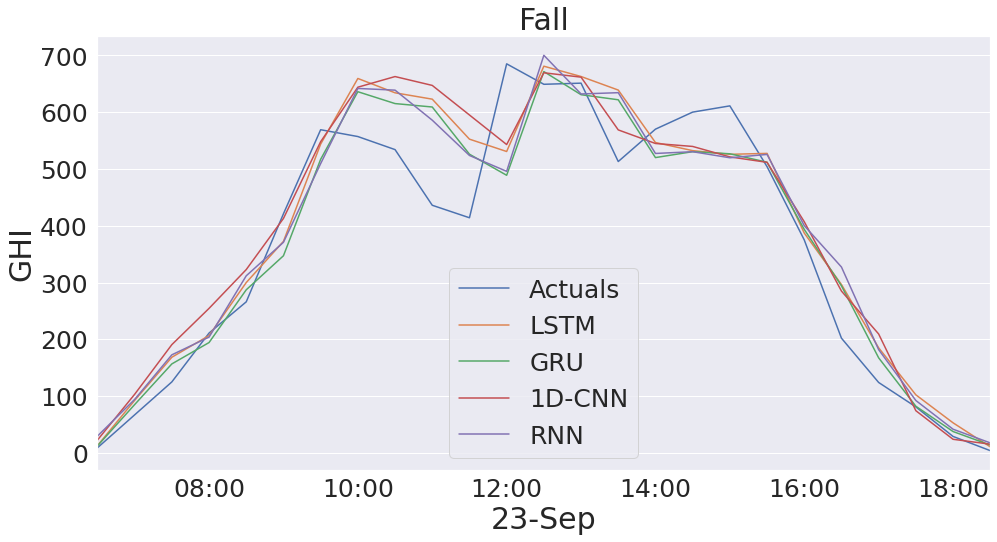

In [ ]:
test_results10['Actuals'][6868:6893].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][6868:6893].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][6868:6893].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][6868:6893].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][6868:6893].plot(figsize=(16,8), label='RNN')
plt.title('Fall')
plt.xlabel('23-Sep')
plt.ylabel('GHI')
plt.legend()

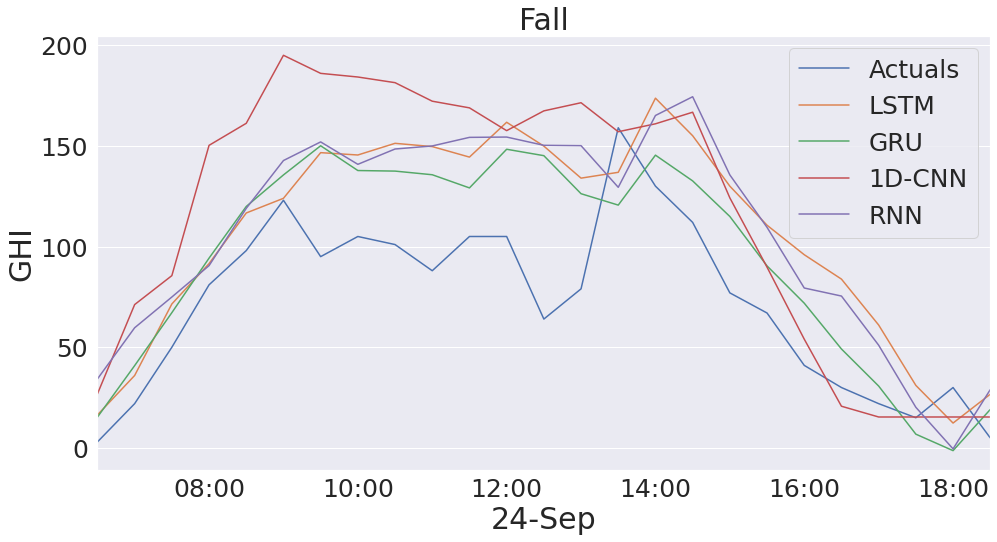

In [ ]:
test_results10['Actuals'][6893:6918].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][6893:6918].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][6893:6918].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][6893:6918].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][6893:6918].plot(figsize=(16,8), label='RNN')
plt.title('Fall')
plt.xlabel('24-Sep')
plt.ylabel('GHI')
plt.legend()

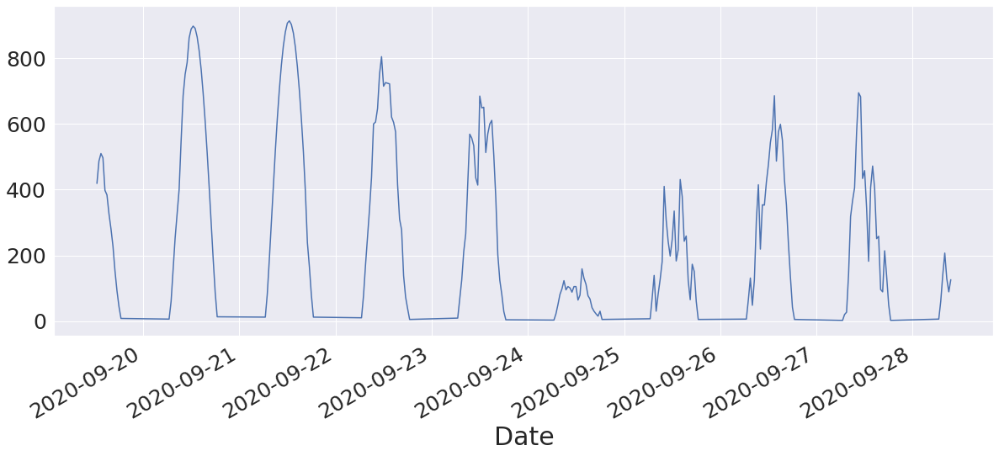

In [ ]:
test_results10['Actuals'][6780:7000].plot(figsize=(20,8), label='Actuals')

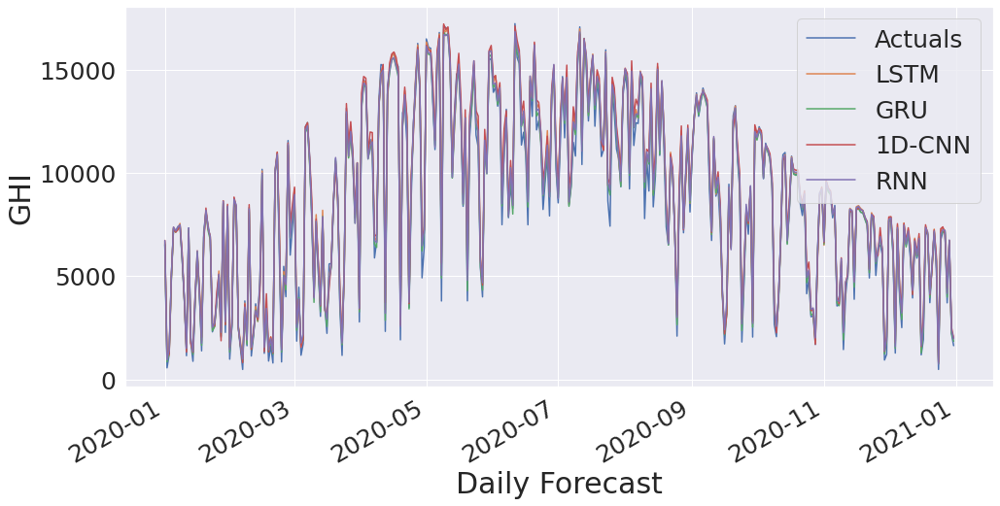

In [ ]:
Fullyear1['Actuals'][:].plot(figsize=(16,8), label='Actuals')
Fullyear1['Test Predictions'][:].plot(figsize=(16,8), label='LSTM')
Fullyear2['Test Predictions'][:].plot(figsize=(16,8), label='GRU')
Fullyear3['Test Predictions'][:].plot(figsize=(16,8), label='1D-CNN')
Fullyear4['Test Predictions'][:].plot(figsize=(16,8), label='RNN')
plt.xlabel('Daily Forecast')
plt.ylabel('GHI')
plt.legend()

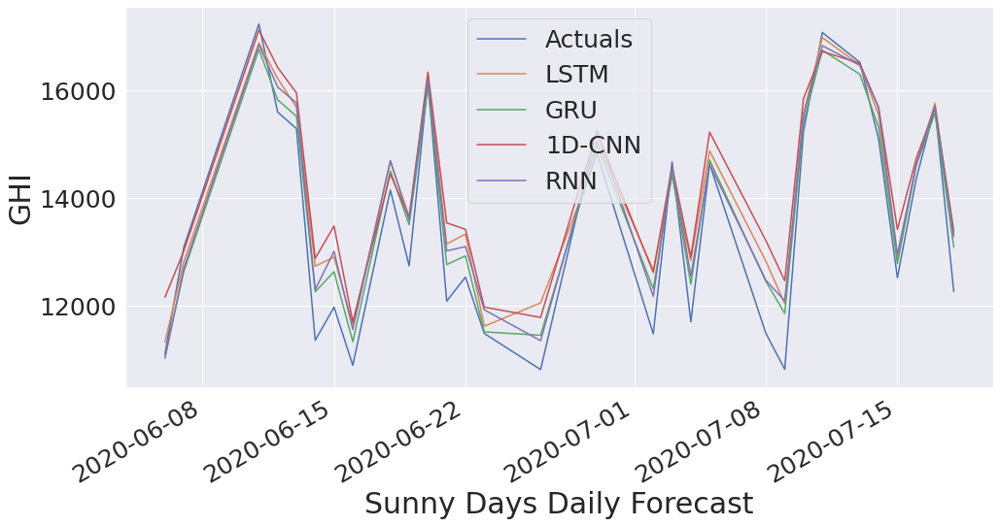

In [ ]:
sunnydays1['Actuals'][60:91].plot(figsize=(16,8), label='Actuals')
sunnydays1['Test Predictions'][60:91].plot(figsize=(16,8), label='LSTM')
sunnydays2['Test Predictions'][60:91].plot(figsize=(16,8), label='GRU')
sunnydays3['Test Predictions'][60:91].plot(figsize=(16,8), label='1D-CNN')
sunnydays4['Test Predictions'][60:91].plot(figsize=(16,8), label='RNN')
plt.xlabel('Sunny Days Daily Forecast')
plt.ylabel('GHI')
plt.legend()

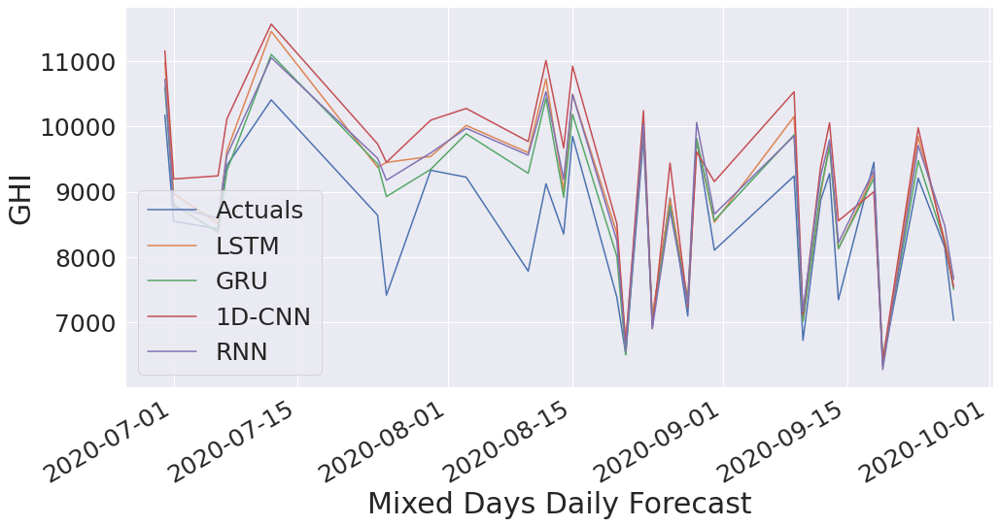

In [ ]:
mixeddays1['Actuals'][50:81].plot(figsize=(16,8), label='Actuals')
mixeddays1['Test Predictions'][50:81].plot(figsize=(16,8), label='LSTM')
mixeddays2['Test Predictions'][50:81].plot(figsize=(16,8), label='GRU')
mixeddays3['Test Predictions'][50:81].plot(figsize=(16,8), label='1D-CNN')
mixeddays4['Test Predictions'][50:81].plot(figsize=(16,8), label='RNN')
plt.xlabel('Mixed Days Daily Forecast')
plt.ylabel('GHI')
plt.legend()

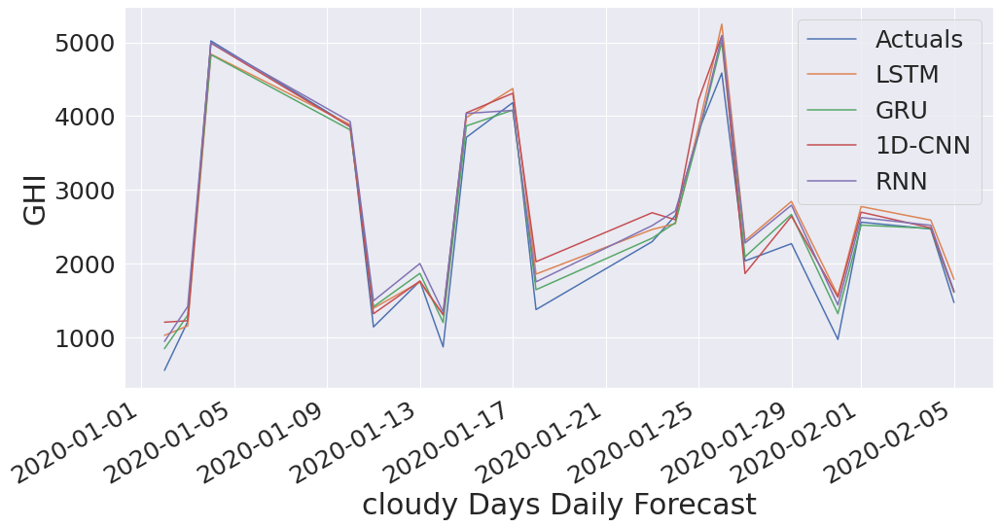

In [ ]:
cloudydays1['Actuals'][:20].plot(figsize=(16,8), label='Actuals')
cloudydays1['Test Predictions'][:20].plot(figsize=(16,8), label='LSTM')
cloudydays2['Test Predictions'][:20].plot(figsize=(16,8), label='GRU')
cloudydays3['Test Predictions'][:20].plot(figsize=(16,8), label='1D-CNN')
cloudydays4['Test Predictions'][:20].plot(figsize=(16,8), label='RNN')
plt.xlabel('cloudy Days Daily Forecast')
plt.ylabel('GHI')
plt.legend()

# **Evaluation Parameters Barcharts**

In [ ]:

columns = ["Models", "R2_SCORE%", "MAE", "RMSE"]
HawaiiHourly = pd.DataFrame.from_records([("1D-CNN", Rsquared3*100, mae3.numpy(),rmse3),
                                          ("RNN", Rsquared4*100, mae4.numpy(), rmse4),
                                          ("LSTM", Rsquared1*100, mae1.numpy(), rmse1),
                                          ("GRU", Rsquared2*100, mae2.numpy(), rmse2)],
                                       columns=columns)
HawaiiHourlymelted = pd.melt(HawaiiHourly, id_vars=columns[0],
                           var_name="Performance Metrics", value_name="R2_SCORE%, MAE, & RMSE")


In [ ]:
def show_values(axs, orient="v", space=.01):
    def _single(ax):
        if orient == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height() + (p.get_height()*0.01)
                value = '{:.1f}'.format(p.get_height())
                ax.text(_x, _y, value, ha="center") 
        elif orient == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_y() + p.get_height() - (p.get_height()*0.5)
                value = '{:.1f}'.format(p.get_width())
                ax.text(_x, _y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _single(ax)
    else:
        _single(axs)

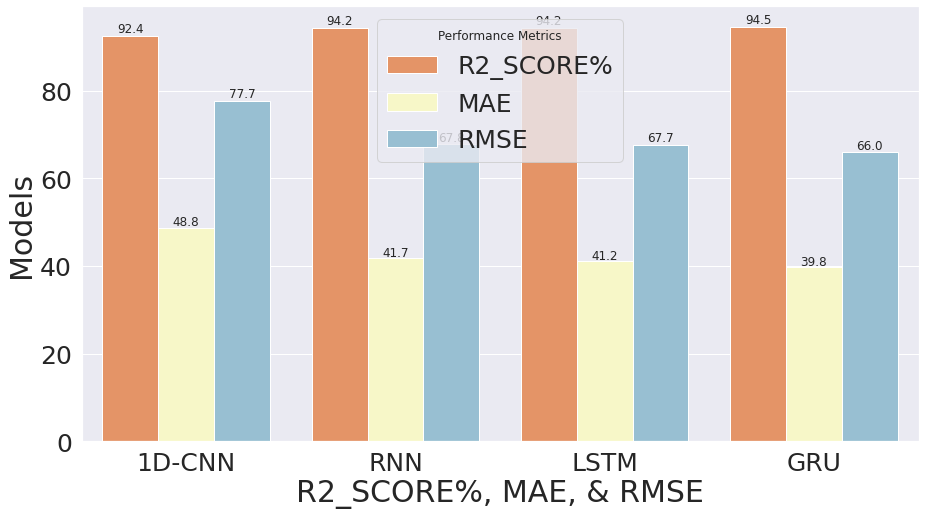

In [ ]:

a = sns.barplot(x=columns[0], y="R2_SCORE%, MAE, & RMSE", hue="Performance Metrics",
                data=HawaiiHourlymelted, errwidth=0, palette="RdYlBu", alpha=1)
a.set_xlabel("R2_SCORE%, MAE, & RMSE",fontsize=30)
a.set_ylabel("Models",fontsize=30)
a.tick_params(labelsize=25)

show_values(a)


In [ ]:
HawaiiHourly.set_index('Models')

,R2_SCORE%,MAE,RMSE
Models,,,
1D-CNN,92.420484,48.774406,77.678978
RNN,94.227506,41.733002,67.789825
LSTM,94.241439,41.241932,67.707962
GRU,94.522915,39.788952,66.032463


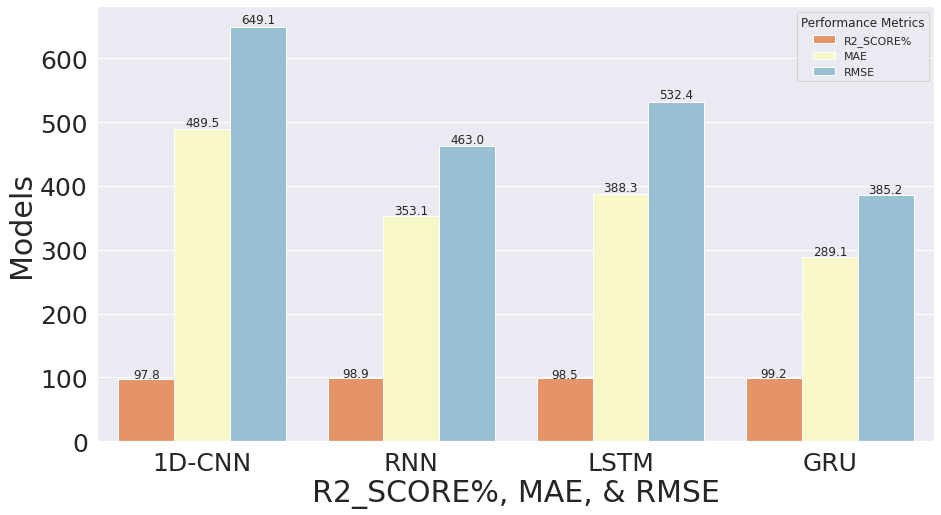

In [ ]:
columns1 = ["Models", "R2_SCORE%", "MAE", "RMSE"]
Daily = pd.DataFrame.from_records([("1D-CNN", RsquaredFullyear3*100, maeFullyear3.numpy(), rmseFullyear3),
                                          ("RNN", RsquaredFullyear4*100, maeFullyear4.numpy(), rmseFullyear4),
                                          ("LSTM", RsquaredFullyear1*100, maeFullyear1.numpy(), rmseFullyear1),
                                          ("GRU", RsquaredFullyear2*100, maeFullyear2.numpy(), rmseFullyear2)],
                                       columns=columns1)
Dailymelted = pd.melt(Daily, id_vars=columns[0],
                           var_name="Performance Metrics", value_name="R2_SCORE%, MAE, & RMSE")

b = sns.barplot(x=columns[0], y="R2_SCORE%, MAE, & RMSE", hue="Performance Metrics",
                data=Dailymelted, errwidth=0, palette="RdYlBu", alpha=1)
b.set_xlabel("R2_SCORE%, MAE, & RMSE",fontsize=30)
b.set_ylabel("Models",fontsize=30)
b.tick_params(labelsize=25)

show_values(b)

In [ ]:
Daily.set_index('Models')

,R2_SCORE%,MAE,RMSE
Models,,,
1D-CNN,97.817751,489.468536,649.094727
RNN,98.889789,353.071625,462.976288
LSTM,98.531631,388.274872,532.443604
GRU,99.231326,289.148834,385.236267


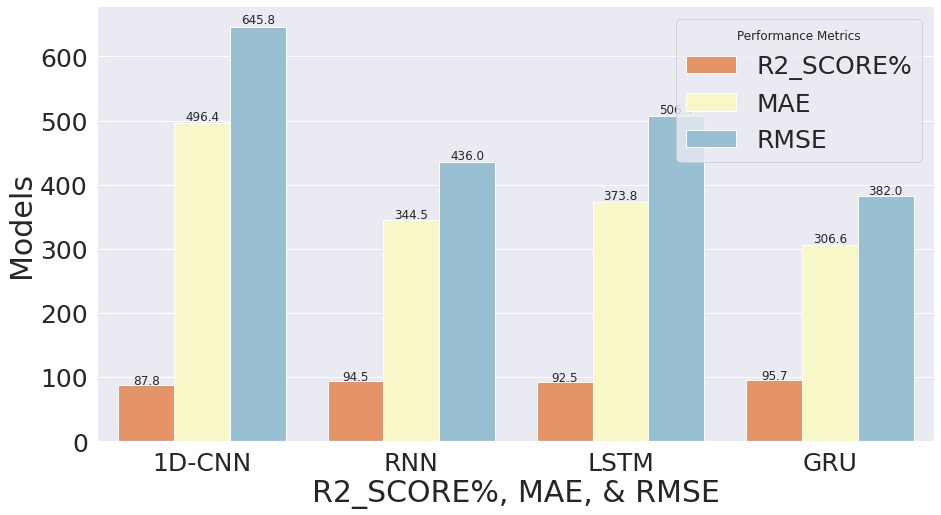

In [ ]:
columns2 = ["Models", "R2_SCORE%", "MAE", "RMSE"]
Sunny = pd.DataFrame.from_records([("1D-CNN", Rsquaredsunny3*100, maesunny3.numpy(), rmsesunny3),
                                          ("RNN", Rsquaredsunny4*100, maesunny4.numpy(), rmsesunny4),
                                          ("LSTM", Rsquaredsunny1*100, maesunny1.numpy(), rmsesunny1),
                                          ("GRU", Rsquaredsunny2*100, maesunny2.numpy(), rmsesunny2)],
                                       columns=columns2)
Sunnymelted = pd.melt(Sunny, id_vars=columns[0],
                           var_name="Performance Metrics", value_name="R2_SCORE%, MAE, & RMSE")

c = sns.barplot(x=columns[0], y="R2_SCORE%, MAE, & RMSE", hue="Performance Metrics",
                data=Sunnymelted, errwidth=0, palette="RdYlBu", alpha=1)
c.set_xlabel("R2_SCORE%, MAE, & RMSE",fontsize=30)
c.set_ylabel("Models",fontsize=30)
c.tick_params(labelsize=25)

show_values(c)

In [ ]:
Sunny.set_index('Models')

,R2_SCORE%,MAE,RMSE
Models,,,
1D-CNN,87.849622,496.418518,645.765076
RNN,94.461418,344.521362,435.992462
LSTM,92.526681,373.761719,506.449860
GRU,95.748965,306.636993,381.968048


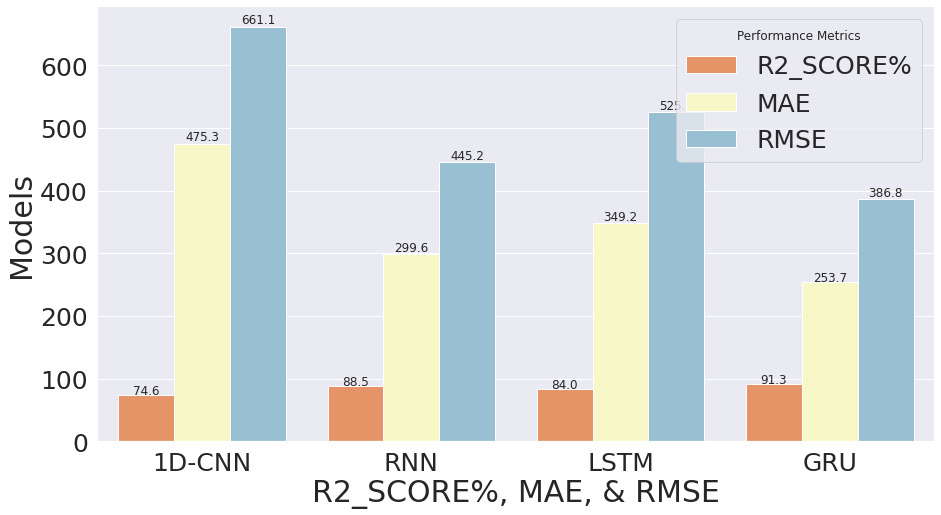

In [ ]:
columns3 = ["Models", "R2_SCORE%", "MAE", "RMSE"]
Mixed = pd.DataFrame.from_records([("1D-CNN", Rsquaredmix3*100, maemix3.numpy(), rmsemix3),
                                          ("RNN", Rsquaredmix4*100, maemix4.numpy(), rmsemix4),
                                          ("LSTM", Rsquaredmix1*100, maemix1.numpy(), rmsemix1),
                                          ("GRU", Rsquaredmix2*100, maemix2.numpy(), rmsemix2)],
                                       columns=columns3)
Mixedmelted = pd.melt(Mixed, id_vars=columns[0],
                           var_name="Performance Metrics", value_name="R2_SCORE%, MAE, & RMSE")

d = sns.barplot(x=columns[0], y="R2_SCORE%, MAE, & RMSE", hue="Performance Metrics",
                data=Mixedmelted, errwidth=0, palette="RdYlBu", alpha=1)
d.set_xlabel("R2_SCORE%, MAE, & RMSE",fontsize=30)
d.set_ylabel("Models",fontsize=30)
d.tick_params(labelsize=25)

show_values(d)

In [ ]:
Mixed.set_index('Models')

,R2_SCORE%,MAE,RMSE
Models,,,
1D-CNN,74.619057,475.317017,661.122986
RNN,88.491782,299.639496,445.176666
LSTM,83.989877,349.153900,525.080261
GRU,91.313215,253.731247,386.774567


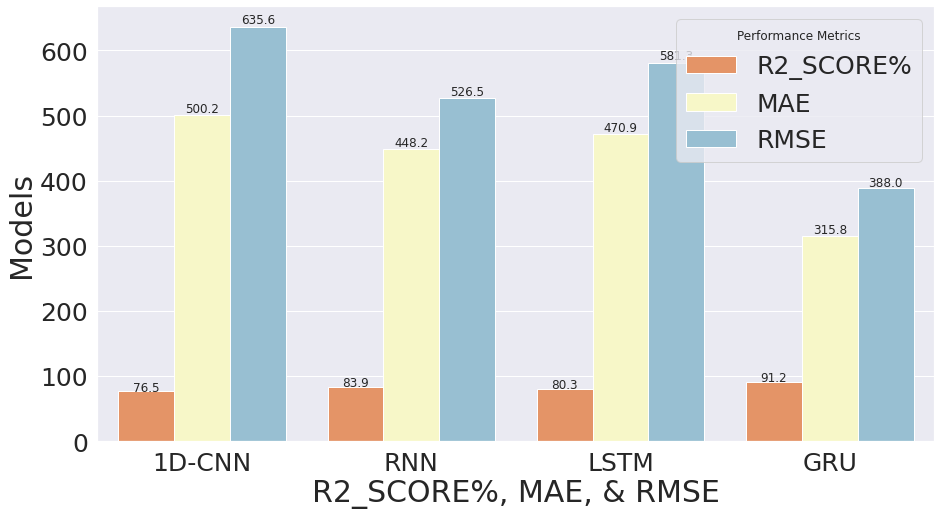

In [ ]:
columns4 = ["Models", "R2_SCORE%", "MAE", "RMSE"]
Cloudy = pd.DataFrame.from_records([("1D-CNN", Rsquaredcloudy3*100, maecloudy3.numpy(), rmsecloudy3),
                                          ("RNN", Rsquaredcloudy4*100, maecloudy4.numpy(), rmsecloudy4),
                                          ("LSTM", Rsquaredcloudy1*100, maecloudy1.numpy(), rmsecloudy1),
                                          ("GRU", Rsquaredcloudy2*100, maecloudy2.numpy(), rmsecloudy2)],
                                       columns=columns4)
Cloudymelted = pd.melt(Cloudy, id_vars=columns[0],
                           var_name="Performance Metrics", value_name="R2_SCORE%, MAE, & RMSE")

e = sns.barplot(x=columns[0], y="R2_SCORE%, MAE, & RMSE", hue="Performance Metrics",
                data=Cloudymelted, errwidth=0, palette="RdYlBu", alpha=1)

e.set_xlabel("R2_SCORE%, MAE, & RMSE",fontsize=30)
e.set_ylabel("Models",fontsize=30)
e.tick_params(labelsize=25)

show_values(e)

In [ ]:
Cloudy.set_index('Models')

,R2_SCORE%,MAE,RMSE
Models,,,
1D-CNN,76.461705,500.160950,635.628784
RNN,83.850058,448.170563,526.503845
LSTM,80.315538,470.884918,581.269897
GRU,91.229795,315.760590,387.990387
